In [ ]:
import torch
import numpy as np
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import torch
import os

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
noise_scale = noise_std = 0.1

# Dataset Setup

## Dataloader creation

In [ ]:
import torch.utils.data as udata


class PieceWiseConstantDataset(udata.Dataset):

    def __init__(self, n_data = 1000, n_signal = 40, prob=0.3, fix_datapoints = True,
                  min_val = 0, max_val = 1, min_sep = 20, min_diff=0.4, use_circular_shift=True, circular_shift_get_item= False, seed=0, shift_item = False):
        super(PieceWiseConstantDataset, self).__init__()

        assert(min_sep > 0)
        self.n_data = n_data;
        self.n_signal = n_signal;
        self.prob = prob
        self.fix_datapoints = fix_datapoints;
        self.min_val = min_val;
        self.max_val = max_val;
        self.min_sep = min_sep;
        self.min_diff = min_diff
        assert min_diff < (max_val-min_val)/2

        self.use_circular_shift = use_circular_shift
        self.circular_shift_get_item = circular_shift_get_item
        self.shift_item =shift_item

        np.random.seed(seed)

        if self.fix_datapoints:
            self.data_list = [None] * self.n_data;
            for i in range(self.n_data):
                # self.data_list[i] = self.gen_piecewise_constant(self.n_signal, self.prob, min_val=self.min_val, max_val=self.max_val);
                self.data_list[i] = self.gen_piecewise_constant_minsep(self.n_signal, self.prob, self.min_sep,
                                                    min_val=self.min_val, max_val=self.max_val);

    def __len__(self):
        return self.n_data

    def circular_shift_shift(self, signal, shift):
        return np.roll(signal, shift)

    def circular_shift(self, signal, shift):
        if shift > int(self.n_signal/2):
          return np.flip(signal).copy()
        else:
          return signal


    def gen_piecewise_constant(self, n, prob, min_val, max_val):
        # np.random.seed(seed)  # Set the seed for reproducibility
        min_diff = self.min_diff
        signal = np.zeros(n)
        val = np.random.uniform(min_val, max_val);
        ind = np.random.randint(n)
        for i in range(n):
            signal[ind] = val
            if np.random.rand() < prob:

                new_val = np.random.uniform(min_val, max_val)
                # Ensure the new value differs from the old value by at least min_diff
                while abs(new_val - val) < min_diff:
                    new_val = np.random.uniform(min_val, max_val)
                val = new_val
                # val = np.random.uniform(min_val, max_val);
            ind = np.mod(ind + 1,n)
        return signal

    def gen_piecewise_constant_minsep(self, n, prob, minsep, min_val, max_val):
        # np.random.seed(seed)  # Set the seed for reproducibility
        signal = np.zeros(n)
        ind = 0
        val = np.random.uniform(min_val, max_val);
        while ind < n:
            if ind + minsep > n:
                signal[ind:] = val
                break
            if ind == 0 or np.random.rand() < prob:
                val = np.random.uniform(min_val, max_val);
                sep = np.random.randint(1, minsep+1) if ind == 0 else minsep;
                if ind + sep > n:
                    signal[ind:] = val
                    break
                else:
                    signal[ind:(ind+sep)] = val
                    ind += sep
            else:
                signal[ind] = val
                ind += 1
        if self.use_circular_shift:
          shift = np.random.randint(n)
          # print(signal)
          signal = self.circular_shift(signal, shift)
        return signal

    def __getitem__(self, index):

        if self.fix_datapoints:
            signal = self.data_list[index];
        else:
            # signal = self.gen_piecewise_constant(self.n_signal, self.prob, min_val=self.min_val, max_val=self.max_val);
            signal = self.gen_piecewise_constant_minsep(self.n_signal, self.prob, self.min_sep,
                                                    min_val=self.min_val, max_val=self.max_val);

        if self.circular_shift_get_item:
          shift = np.random.randint(self.n_signal)
          if not self.shift_item:
            signal = self.circular_shift(signal, shift)
          else:
            signal = self.circular_shift_shift(signal, shift)



        return torch.from_numpy(signal).unsqueeze(0).type(torch.FloatTensor)

In [ ]:
def get_noise(signal, noise_std=0.1, noise_scale=1, max_noise=1,  mode='G'):
    if mode == 'poisson':
        scaled_signal = signal * noise_scale
        noise_sample = torch.tensor(np.random.poisson(scaled_signal.numpy()))
        noise = (noise_sample - scaled_signal) / noise_scale
    else:
        noise = torch.normal(0, noise_std, size=signal.shape)

    noise = torch.clamp(noise, -max_noise, max_noise)
    return noise


In [ ]:
def validation_error(model, dataset_val, noise_std):
    model.eval()
    error_val = 0;
    total_length = 0;

    criterion = nn.MSELoss(reduction='sum');

    for data in dataset_val:
        out_val = model(data + get_noise(data, noise_std) );
        error_val += criterion(out_val, data).item()
        total_length += data.shape[0];

    return error_val/total_length

In [ ]:
def train_network_on_noise(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();

            out_train = model(data + get_noise(data, noise_std) );

            loss = criterion(out_train, data);
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
# path_to_saved_models = '/content/drive/MyDrive/Denoising Code/Denoising_Tutorial/image_wavelet/saved_models_picecewise_constant1/'
path_to_saved_models = 'saved_models_picecewise_constant1'
if not os.path.exists(path_to_saved_models):
    os.mkdir(path_to_saved_models)

In [ ]:
kernel_size = 3;
num_filters = 3;
center_list = np.arange(-2, 2, 0.05);
sigma_list = 0.1;
n_hidden = 5;
hidden_dim = 10;
# non_linear_func = 'rbf'
non_linear_func = 'nn'

In [ ]:
# noise_scale = noise_std = 1

In [ ]:
import numpy as np
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init

class DnCNN(nn.Module):
	def __init__(self, depth=20, n_channels=16, image_channels=1, use_bnorm=True, kernel_size=3, use_bias=True):
		super(DnCNN, self).__init__()
		kernel_size = 3
		padding = 1

		self.use_bnorm = use_bnorm;
		self.depth = depth;
		self.use_bias = use_bias


		self.first_layer = nn.Conv1d(in_channels=image_channels, out_channels=n_channels, kernel_size=kernel_size, padding=padding, bias=self.use_bias)

		self.hidden_layer_list = [None] * (self.depth - 2);
		if self.use_bnorm:
			self.bn_layer_list = [None] * (self.depth -2 );

		for i in range(self.depth-2):
			self.hidden_layer_list[i] = nn.Conv1d(in_channels=n_channels, out_channels=n_channels, kernel_size=kernel_size, padding=padding, bias=self.use_bias);
			if self.use_bnorm:
				self.bn_layer_list[i] = nn.BatchNorm1d(n_channels, eps=0.0001, momentum = 0.95)

		self.hidden_layer_list = nn.ModuleList(self.hidden_layer_list);
		if self.use_bnorm:
			self.bn_layer_list = nn.ModuleList(self.bn_layer_list);
		self.last_layer = nn.Conv1d(in_channels=n_channels, out_channels=image_channels, kernel_size=kernel_size, padding=padding, bias=self.use_bias)

		self._initialize_weights()

	def forward(self, x):

		out = self.first_layer(x);
		out = F.relu(out);

		for i in range(self.depth-2):
			out = self.hidden_layer_list[i](out);
			if self.use_bnorm:
				out = self.bn_layer_list[i](out);
			out = F.relu(out)

		out = self.last_layer(out);

		return out

	def _initialize_weights(self):
		for m in self.modules():
			if isinstance(m, nn.Conv1d):
				init.orthogonal_(m.weight)
				# print('init weight')
				if m.bias is not None:
					init.constant_(m.bias, 0)
			elif isinstance(m, nn.BatchNorm1d):
				init.constant_(m.weight, 1)
				init.constant_(m.bias, 0)



In [ ]:
signal_length = 100

In [ ]:
train_dataset = PieceWiseConstantDataset(n_data = 500, prob = 0.3, n_signal = signal_length, fix_datapoints = True, min_sep = 5, use_circular_shift=False, circular_shift_get_item=True);
val_dataset = PieceWiseConstantDataset(n_data = 100, n_signal = signal_length, prob = 0.3, min_sep = 5, use_circular_shift=False);
train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=32, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 1,
                       shuffle = False)

In [ ]:
def visualize_denoising(source, net, noise_std, figsize=(10,10)):
    noise_sample = get_noise(source, noise_std);
    reconstructed = net(source+noise_sample);

    fig, axes = plt.subplots(1, 4, sharex=True, sharey=True, figsize=figsize);
    axes[0].plot(source.data.numpy().reshape(-1))
    axes[0].set_title('Sigal')

    axes[1].plot(noise_sample.data.numpy().reshape(-1))
    axes[1].set_title('Noise Sample')

    axes[2].plot((source+noise_sample).data.numpy().reshape(-1))
    axes[2].set_title('Noisy')

    axes[3].plot(reconstructed.data.numpy().reshape(-1))
    axes[3].set_title('Reconstructed')

    plt.show()
def visualize_coeffs_and_denoising(source, net, noise_std, figsize=(10,20)):
    noise_sample = get_noise(source, noise_std)
def visualize_filter(net):
    n = net.num_filters;

    fig, axes = plt.subplots(n, 2, sharex=True, sharey=True, figsize=(10, 5));
#     plt.setp(axes.flat,  adjustable='box-forced');

    if n==1:
        axes[0].stem(net.get_forward_filter_list()[0])
        axes[1].stem(net.get_inverse_filter_list()[0])
    else:
        for i in range(n):
            axes[i][0].stem(net.get_forward_filter_list()[i])
            axes[i][1].stem(net.get_inverse_filter_list()[i])

    plt.show()

#### Example simple training code

In [ ]:
net_nn = DnCNN(depth=2, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3)

In [ ]:
net_nn

DnCNN(
  (first_layer): Conv1d(1, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (hidden_layer_list): ModuleList()
  (last_layer): Conv1d(64, 1, kernel_size=(3,), stride=(1,), padding=(1,))
)

In [ ]:
train_loss_dnn, val_loss_dnn = train_network_on_noise(net_nn, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)

0 train error:  1.3737145309448242 val error:  1.3950406044721604
1 train error:  0.7139419612884521 val error:  0.7402091214060783
2 train error:  0.6018402576446533 val error:  0.6123489603400231
3 train error:  0.539698558807373 val error:  0.5449002835154534
4 train error:  0.5050700283050538 val error:  0.5062740319967269
5 train error:  0.47543594932556155 val error:  0.4977747282385826
6 train error:  0.46112576484680173 val error:  0.46293830037117006
7 train error:  0.4345270709991455 val error:  0.4491132414340973
8 train error:  0.4126616592407227 val error:  0.43068798273801806
9 train error:  0.40764123725891116 val error:  0.40642131730914116
10 train error:  0.4043302125930786 val error:  0.40984662652015685
11 train error:  0.4017399730682373 val error:  0.40721849784255026
12 train error:  0.4017276058197021 val error:  0.4024056626856327
13 train error:  0.4059716644287109 val error:  0.40587039187550544
14 train error:  0.3927458620071411 val error:  0.41291144430637

In [ ]:
import matplotlib.pyplot as plt

def plot_side_by_side_losses(train_loss, val_loss, train_loss_dnn, val_loss_dnn, wiener_star_loss, save_path='side_by_side_losses.pdf', title1='DNN without Batch Normalization', title2='DNN with Batch Normalization'):


    y_min = 0  # Replace with your desired minimum value
    y_max = 1  # Replace with your desired maximum value
    # Create a figure with two side-by-side subplots that share the y-axis
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 6), sharey=True)

    # Plotting for the first experiment on the first subplot
    ax1.plot(train_loss, label='Train Loss', color='blue')
    ax1.plot(val_loss, label='Validation Loss', color='green')
    ax1.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')
    ax1.set_title('Linear Net Loss Curves', fontsize=16)
    ax1.set_xlabel('Epoch', fontsize=14)
    ax1.set_ylabel('Loss', fontsize=14)
    ax1.legend()
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax1.set_ylim(y_min, y_max)

    # Plotting for the DNN experiment on the second subplot
    ax2.plot(train_loss_dnn, label='Train Loss (DNN)', color='blue', linestyle='-.')
    ax2.plot(val_loss_dnn, label='Validation Loss (DNN)', color='green', linestyle='-.')
    ax2.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')
    ax2.set_title('DNN Loss Curves', fontsize=16)
    ax2.set_xlabel('Epoch', fontsize=14)
    ax2.legend()
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax2.set_ylim(y_min, y_max)

    # Ensure a tight layout and save
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

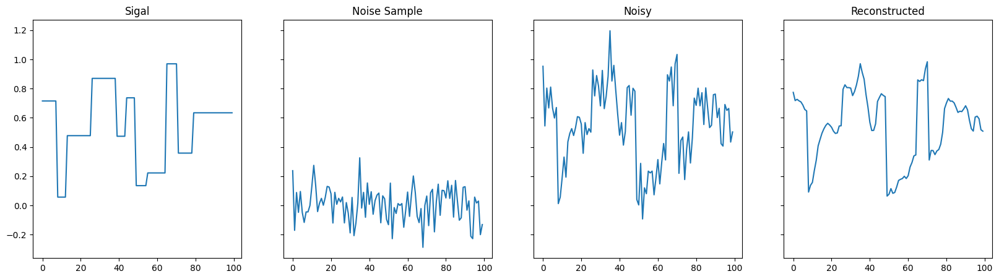

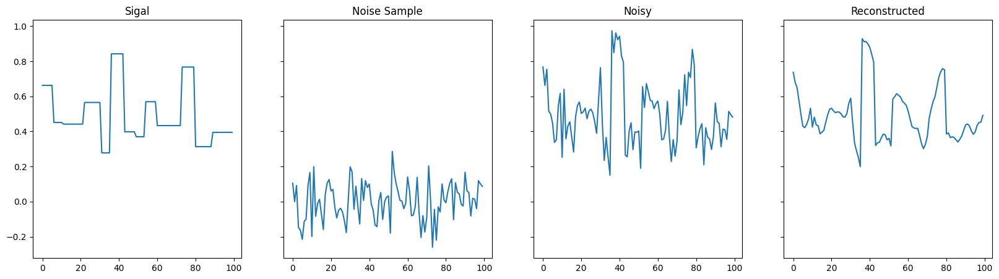

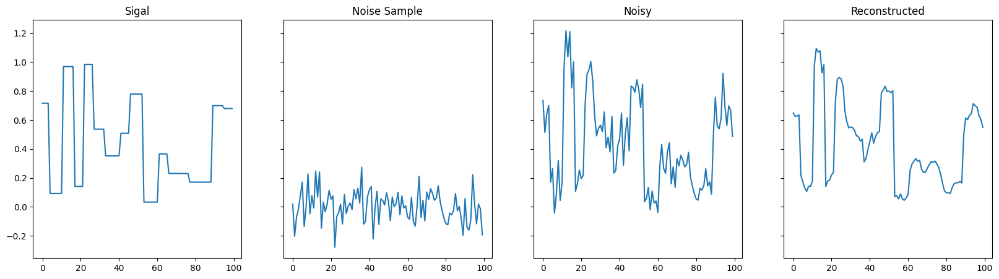

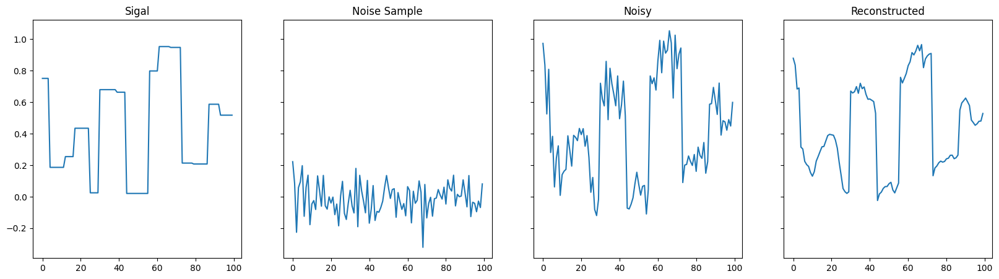

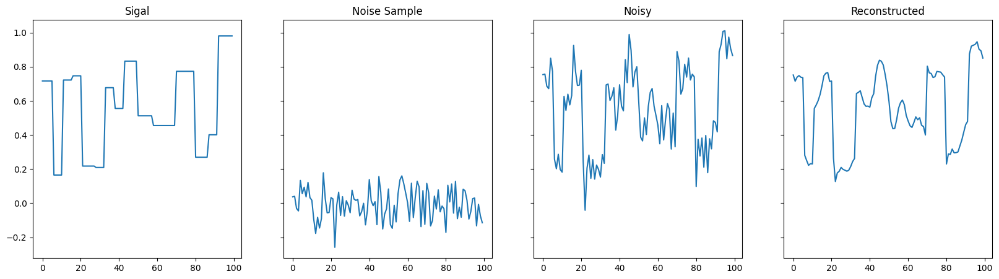

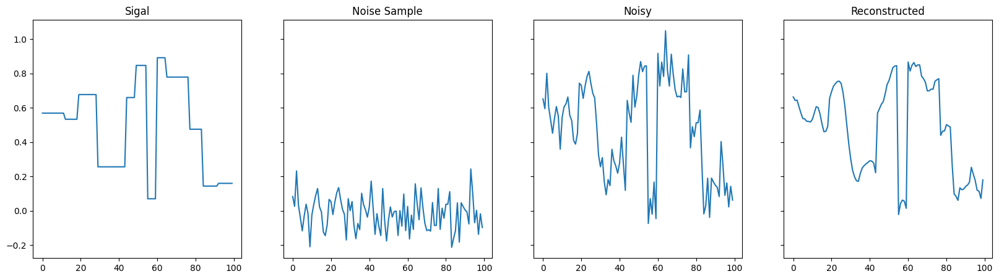

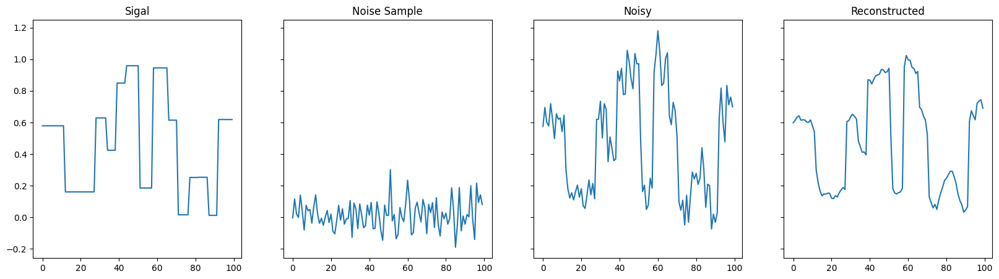

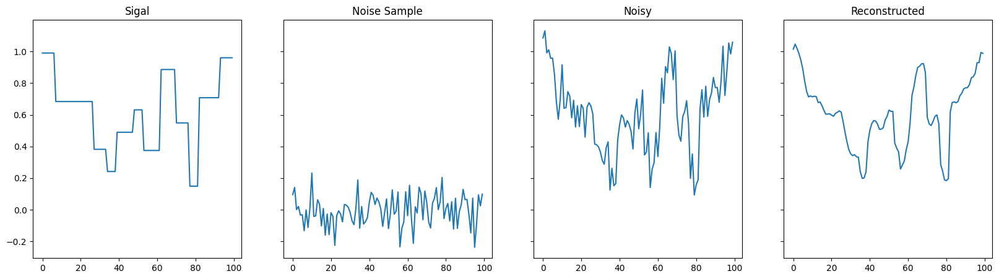

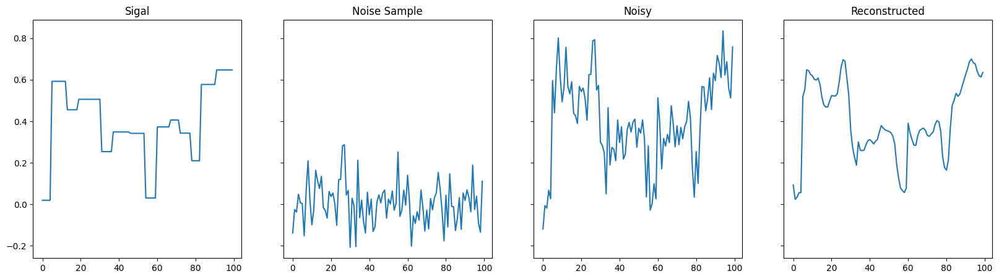

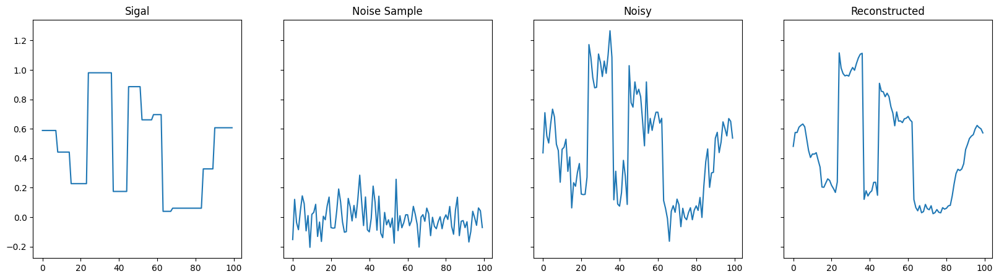

In [ ]:
for i in range(10):
    visualize_denoising(val_dataset[i].unsqueeze(0), net_nn, noise_std=noise_std, figsize=(20, 5))


In [ ]:
import os

from PIL import Image

import numpy as np
from torch.utils.data import DataLoader
import torch
import matplotlib.pyplot as plt

import cv2
# from skimage.measure.simple_metrics import compare_psnr
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
import glob
import pickle

import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import argparse
import sys
import torchvision
import torch
from torch.serialization import default_restore_location
from torch.distributions import Poisson
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
# import data
# import models
# import utils

In [ ]:
device = torch.device('cpu')

In [ ]:
kernel_size = 2
# noise_std_array = [float(10)/255, float(25)/255, float(55)/255];

n_examples = 3 #number of examples to plot

In [ ]:
train_dataset = train_loader.dataset
val_dataset = val_loader.dataset
test_loader = val_loader
test_dataset = test_loader.dataset

##Image statstics

In [ ]:
import numpy as np

def find_expected_coeff_square_1d(train_dataset):
    n = len(train_dataset)
    print(n)
    abs_coeff_sum = 0
    processed_samples = 0

    for i in range(n):
        sample = train_dataset[i]
#         print(sample)

#         # Check if sample is a NumPy array or needs to be converted
#         if not isinstance(sample, np.ndarray):
#             sample = np.array(sample)

#         print(sample)
#         # Debugging: Print the shape and type
#         print(f"Shape: {sample.shape}")
#         print(f"Type: {type(sample)}")

#         if len(sample.shape) != 1:
#             print(f"Skipping sample {i} as it is not 1D.")
#             continue

        # Perform FFT and accumulate
        temp = np.fft.fftshift(np.fft.fft(sample))
        abs_coeff_sum += np.abs(temp) ** 2
        processed_samples += 1

    if processed_samples == 0:
        print("No 1D samples processed.")
        return None

    abs_coeff_avg = abs_coeff_sum / processed_samples
    return abs_coeff_avg


In [ ]:
mean_coeff_sq = find_expected_coeff_square_1d(train_dataset)

500


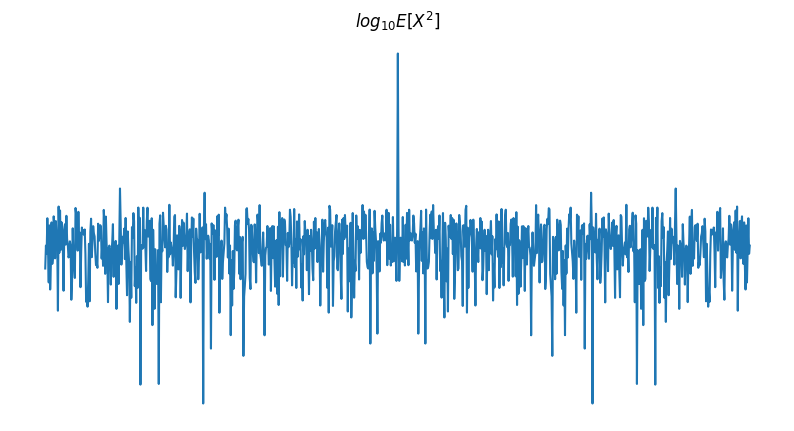

In [ ]:
def plot_signal_values(ax=None, signal=None, title_string=None, ax_off=False):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5))

    ax.plot(np.log10(signal))

    ax.set_xlabel('Frequency')
    ax.set_ylabel('Log Magnitude')

    if title_string is not None:
        ax.set_title(title_string)

    if ax_off:
        ax.axis('off')

# Example usage
mean_coeff_sq = np.abs(np.fft.fftshift(np.fft.fft(np.random.rand(1000)))) ** 2  # Replace this with your mean_coeff_sq
plot_signal_values(ax=None, signal=mean_coeff_sq, title_string='$log_{10}E[X^2]$', ax_off=True)


## Visalizing before training

In [ ]:
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from torch.distributions import Poisson


def batch_PSNR_1D(signals, clean_signals, data_range):
    Signals = signals.data.cpu().numpy().astype(np.float32)
    CleanSignals = clean_signals.data.cpu().numpy().astype(np.float32)
    PSNR = 0.0

    for i in range(Signals.shape[0]):
        PSNR += compare_psnr(CleanSignals[i, :], Signals[i, :], data_range=data_range)

    return PSNR / Signals.shape[0]

from skimage.metrics import peak_signal_noise_ratio as compare_psnr

def batch_PSNR(signals, clean_signals, data_range):
    Signals = signals.data.cpu().numpy().astype(np.float32)
    CleanSignals = clean_signals.data.cpu().numpy().astype(np.float32)
    PSNR = 0.0

    for i in range(Signals.shape[0]):
        PSNR += compare_psnr(CleanSignals[i, :], Signals[i, :], data_range=data_range)

    return PSNR / Signals.shape[0]

In [ ]:
def tensor_to_signal_1D(torch_signal, low=0.0, high=1.0, clamp=False):
    if clamp:
        torch_signal = torch.clamp(torch_signal, low, high)
    return torch_signal[0].cpu().data.numpy()


In [ ]:
def plot_1d_log_fft(signal, ax=None, ax_off=True, title_string=None):
    fft_shifted = np.fft.fftshift(np.fft.fft(signal))
    mat = np.log10(np.abs(fft_shifted) + 1e-9)

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 5))

    if ax_off:
        ax.axis('off')

    ax.plot(mat)
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Amplitude (Log Scale)')

    if title_string is not None:
        ax.set_title(title_string)

    return mat


In [ ]:
def get_noise(data, noise_std = 0.1,mode='G', max_noise=5e-1,noise_scale=1):
    noise = torch.randn_like(data);
    noise.data = noise.data * noise_std;
    return noise

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assume batch_PSNR and get_noise are defined elsewhere
# Assume tensor_to_image for 1D is also defined elsewhere

def plot_1d_log_fft(signal, ax=None):
    fft = np.fft.fftshift(np.fft.fft(signal))
    mat = np.log10(np.abs(fft) + 1e-9)
    ax.plot(mat)
    ax.set_title('Log FFT')
    return mat

def visualize_denoising(source, net, noise_std=0.1, noise_sample=None, noise_scale=1.0, figsize=(20, 5)):
    fig, axes = plt.subplots(1, 3, figsize=figsize)

    axes[0].plot(tensor_to_signal_1D(source))
    axes[0].set_title('Original')

    if noise_sample is None:
        noisy = source + get_noise(source, noise_std=noise_std, noise_scale=noise_scale)

    axes[1].plot(tensor_to_signal_1D(noisy))
    axes[1].set_title(f'Noisy - PSNR: {batch_PSNR_1D(noisy, source, 1.0):.2f}')

    denoised = net(noisy)
    axes[2].plot(tensor_to_signal_1D(denoised))
    axes[2].set_title(f'Denoised - PSNR: {batch_PSNR_1D(torch.clamp(denoised, 0.0, 1.0), source, 1.0):.2f}')

    plt.subplots_adjust(wspace=0.4)
    plt.show()

# Example usage:
# Let's assume `source` is your 1D piecewise constant signal tensor and `net` is your denoising model.
# visualize_denoising(source, net)


In [ ]:
import torch.nn as nn

class LinearCNN1D(nn.Module):
    def __init__(self, kernel_size=3):
        super(LinearCNN1D, self).__init__()
        self.conv1 = nn.Conv1d(1, 1, kernel_size, padding=(kernel_size-1)//2)
        print((kernel_size-1)//2)

    def forward(self, x):
        # Assuming input x is of shape (batch_size, signal_length)
        # Reshape to (batch_size, 1, signal_length) for 1D convolution
        x = x.unsqueeze(1)

        rec_img = self.conv1(x)

        # Reshape back to (batch_size, signal_length)
        rec_img = rec_img.squeeze(1)

        return rec_img



In [ ]:
net = LinearCNN1D()

1


In [ ]:
device = torch.device('cpu')

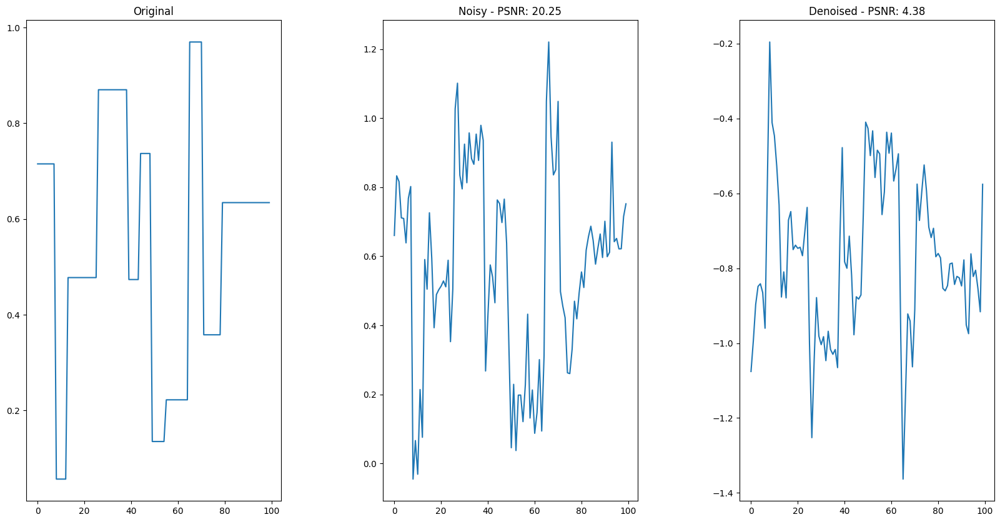

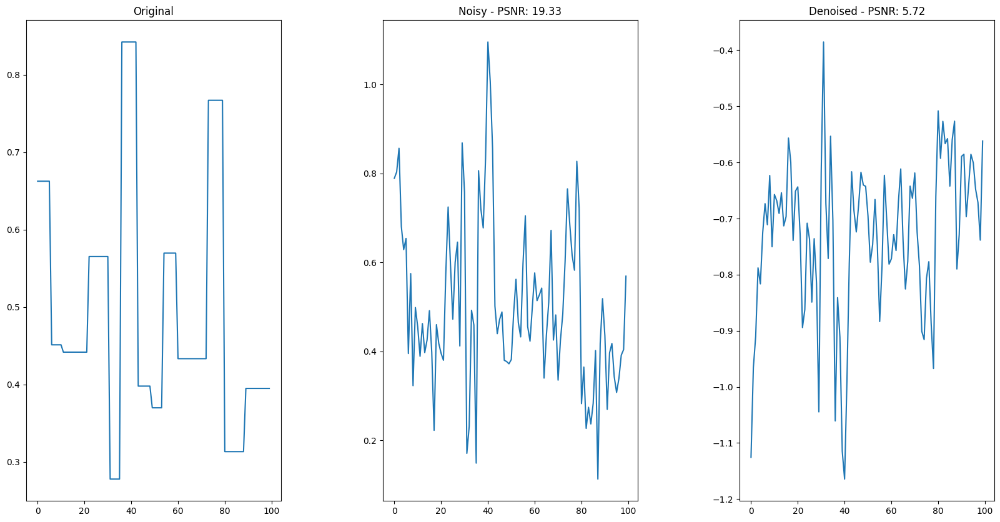

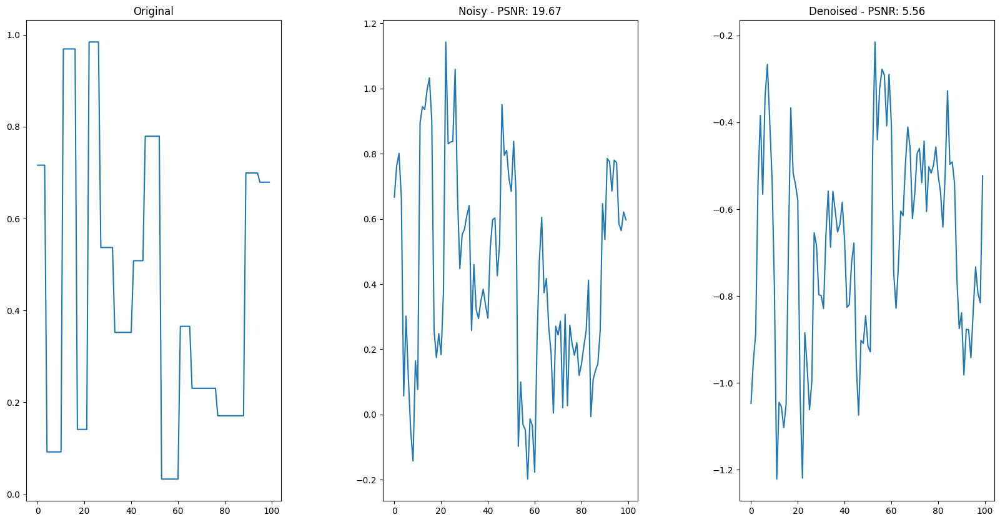

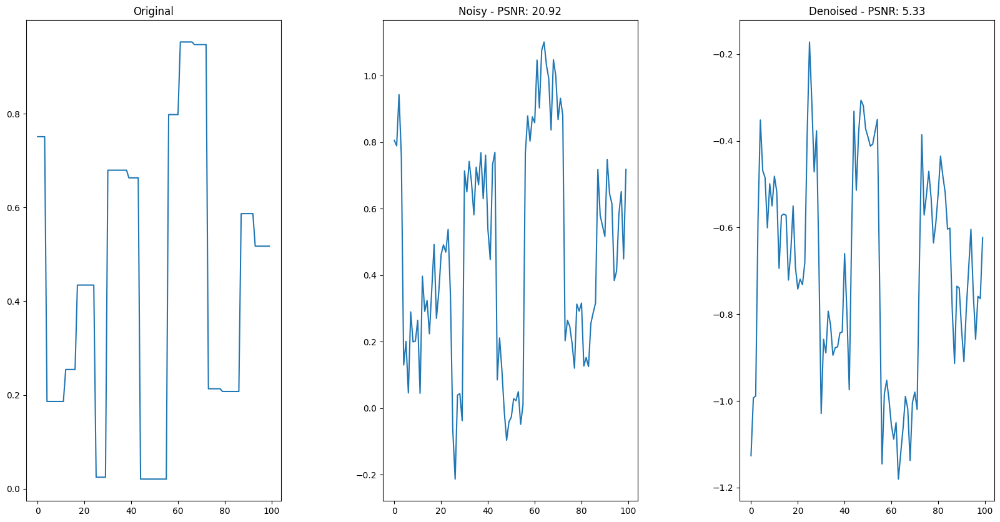

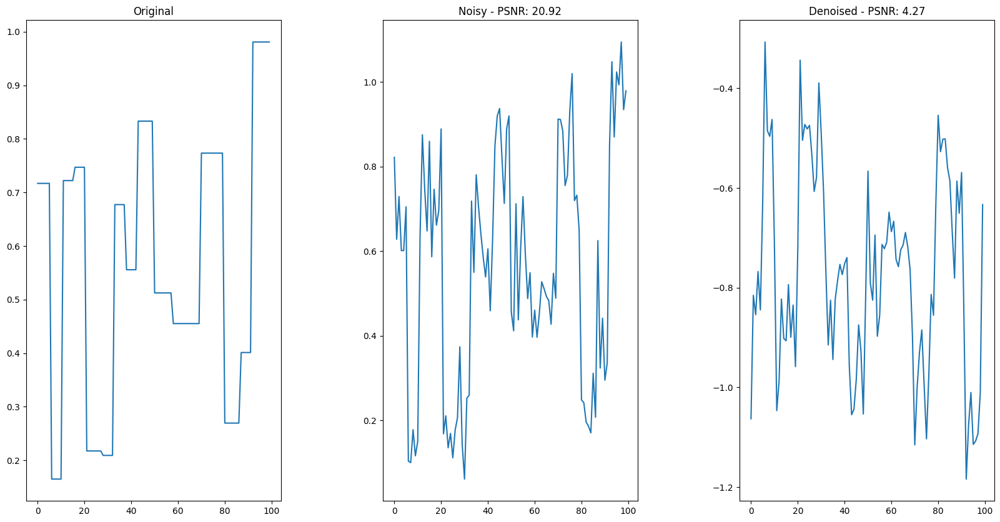

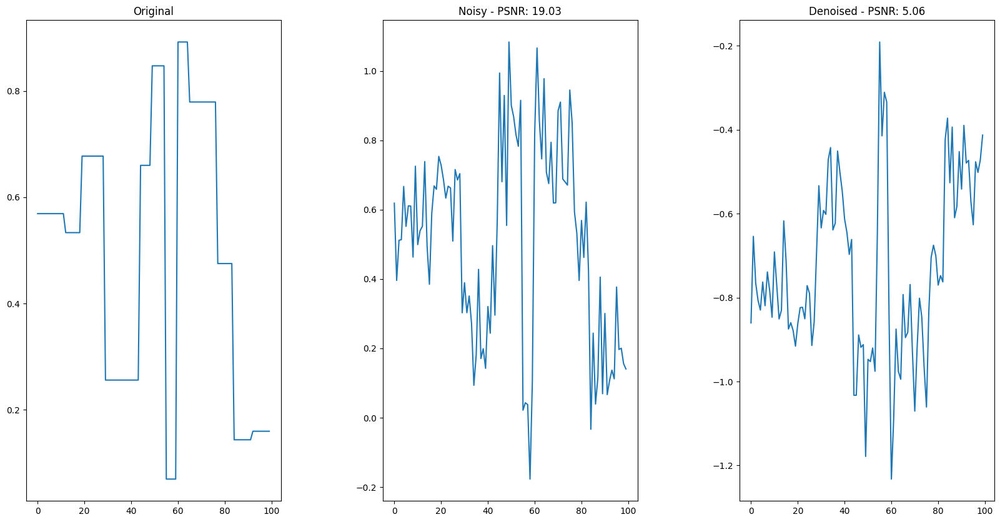

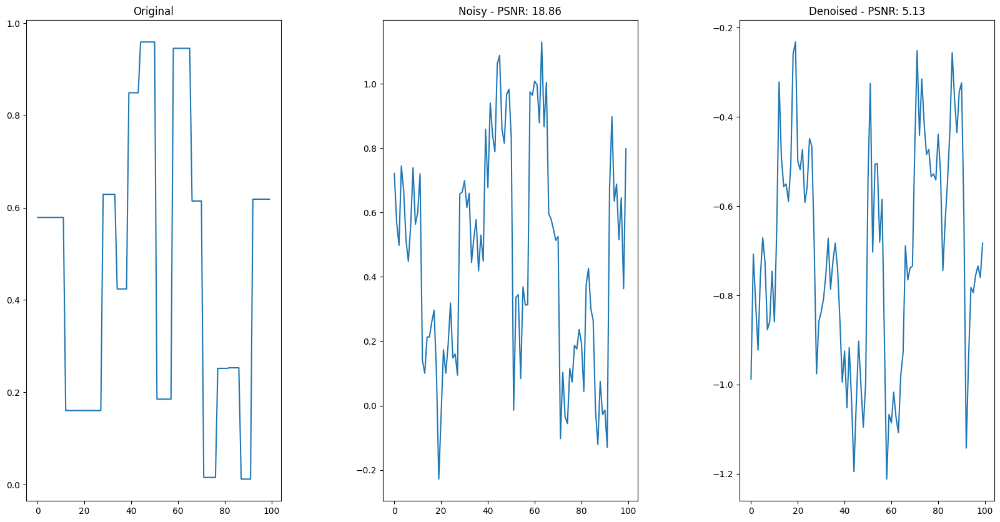

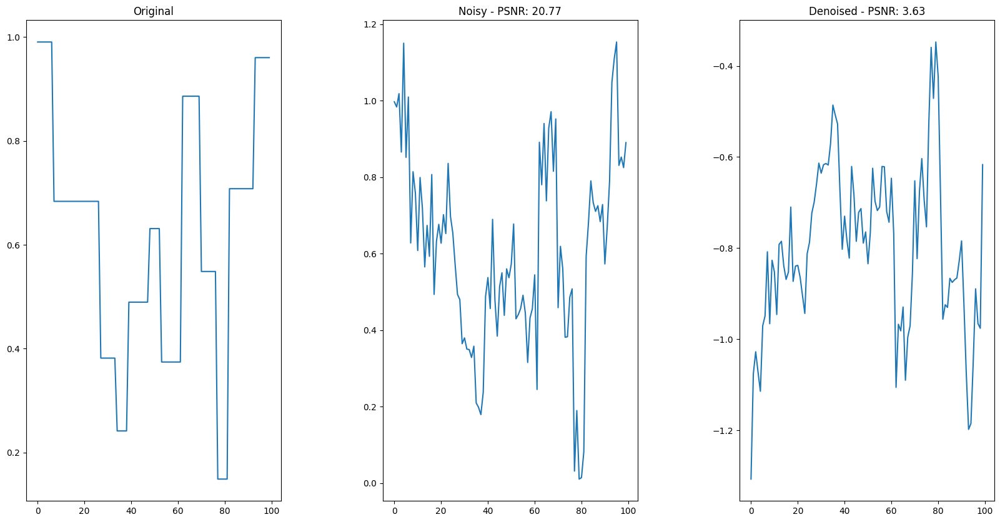

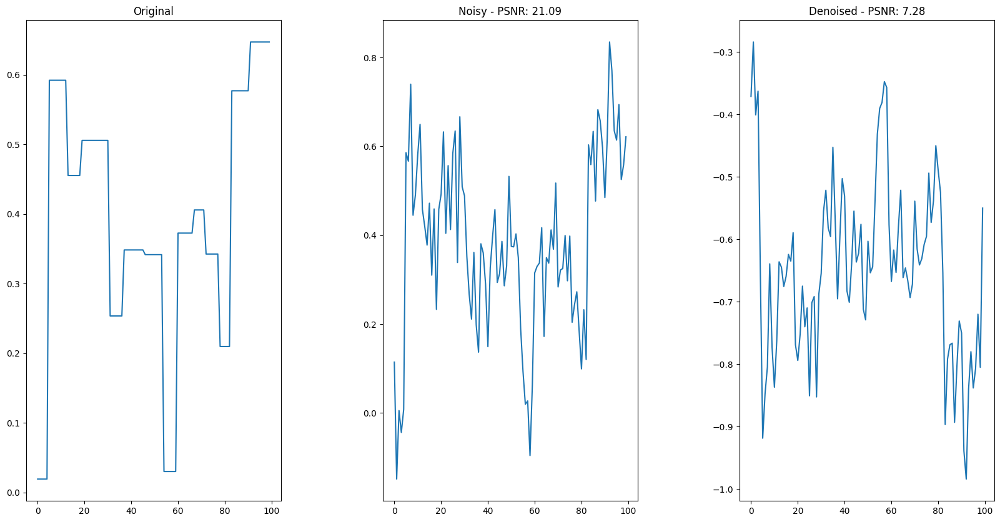

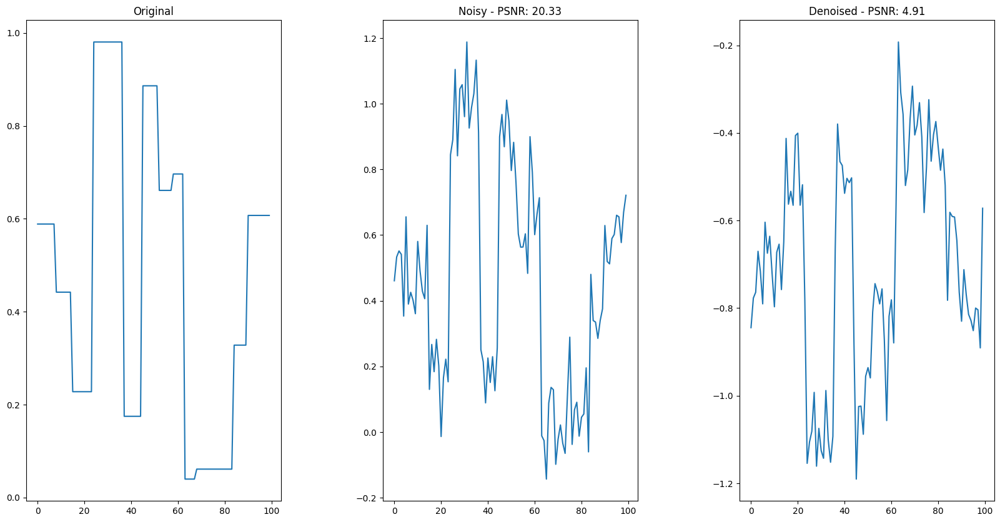

In [ ]:
# noise_std = np.random.choice(noise_std_array)
n_examples = 10
for i in range(n_examples):
    visualize_denoising(val_dataset[i].to(device), net.to(device), noise_std=noise_std, noise_scale=noise_scale, figsize=(20, 10))

# Theoretical Wiener Filter

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_signal_and_fft(signal, ax=None, title_string=None):
    if ax is None:
        fig, ax = plt.subplots(1, 2, sharex=False, sharey=False, figsize=(10, 5))

    ax[0].plot(signal)
    ax[0].set_title('Signal')
    ax[0].set_xlabel('Sample')
    ax[0].set_ylabel('Amplitude')

    fft_values = np.fft.fftshift(np.fft.fft(signal))
    fft_magnitude = np.abs(fft_values)

    ax[1].plot(fft_magnitude)
    ax[1].set_title('FFT Magnitude')
    ax[1].set_xlabel('Frequency')
    ax[1].set_ylabel('Magnitude')

    if title_string is not None:
        ax[0].set_title(title_string + ' - Signal')
        ax[1].set_title(title_string + ' - FFT')

def visualize_filters_1d(net):
    fig, ax = plt.subplots(1, 2, sharex=False, sharey=False, figsize=(20, 5))

    # Assuming net.first_layer.weight.cpu().data.numpy()[0] gives us the 1D filter.
    filter_1d = net.first_layer.weight.cpu().data.numpy()[0]

    plot_signal_and_fft(filter_1d, ax, "Filter")

    plt.show()

# Example usage: Replace 'your_net' with the actual network instance.
# visualize_filters_1d(your_net)

# Example usage
signal = np.sin(2 * np.pi * np.linspace(0, 1, 500))  # Replace this with your 1D signal
plot_signal_and_fft(signal)


In [ ]:
import numpy as np


def theoretical_wiener_from_data_1d(train_dataset, fft_shift=True, noise_std=0.1, fft_sample=100, n=10, noise_scale=50):
    first_sample = train_dataset[0].numpy()
    signal_squeeze = False

    # Check if it's a 1D array
    if len(first_sample.shape) != 1:
        signal_squeeze = True
#         print("Skipping: Not a 1D array.")
#         return None

    mean_coeff = np.fft.fft(first_sample, n=fft_sample) * 0.0

    for i in range(n):
        for x_tensor in train_dataset:
            if signal_squeeze:
                x_tensor = x_tensor.squeeze()
            x = x_tensor.numpy()

            if len(x.shape) != 1:
                print("Skipping: Not a 1D array.")
                continue
#             plt.figure()
#             plt.plot(x)
#             plt.show()
#             plt.close()
#             print(x.shape)
            noisy = x + get_noise(x_tensor, mode='G', noise_std=noise_std, noise_scale=noise_scale).numpy()
#             print(noisy.shape)
#             plt.figure()
#             plt.plot(noisy)
# #             print(np.min(noisy))
#             plt.show()
#             plt.close()

            noise_fft = np.fft.fft(noisy, n=fft_sample)
#             print(noise_fft)


            clean_fft = np.fft.fft(x, n=fft_sample)

            mean_coeff += clean_fft * np.conjugate(noise_fft) / (np.abs(noise_fft + 1e-8)**2)
#             print(clean_fft * np.conjugate(noise_fft) / (np.abs(noise_fft + 1e-8)**2))

    mean_coeff /= (n * len(train_dataset))
    mean_coeff = mean_coeff[0]
#     print(mean_coeff.shape)

    if fft_shift:
        return np.fft.fftshift(mean_coeff)
    else:
        return mean_coeff

# Sample usage with PyTorch tensors (Replace this with your actual dataset)
# import torch
# train_dataset = [torch.tensor([1.0, 2.0, 3.0]), torch.tensor([4.0, 5.0, 6.0])]

result = theoretical_wiener_from_data_1d(train_dataset,fft_sample=signal_length,noise_std=noise_std)



In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_number_line(ax, values, title=''):
    ax.set_title(title)
    ax.plot(values)

def plot_filter_and_fft_from_fft_1d(fft_vector, s=17):
    fig, axes = plt.subplots(1, 2, figsize=(20, 5))

    axes[0].set_title('Filter')
    axes[1].set_title('$log_{10}(FFT)$')

    filter_np = np.real(np.fft.ifft(np.fft.ifftshift(fft_vector), n=s))
    log_fft = np.log10(np.abs(fft_vector))

    plot_number_line(axes[0], filter_np)
    plot_number_line(axes[1], log_fft)

# Example usage:
# fft_vector = np.fft.fft(np.array([1.0, 2.0, 3.0, 4.0, 5.0]))
# theoretical_wiener_from_data_1d(fft_vector)


### Visualizing filters

In [ ]:
# noise_std

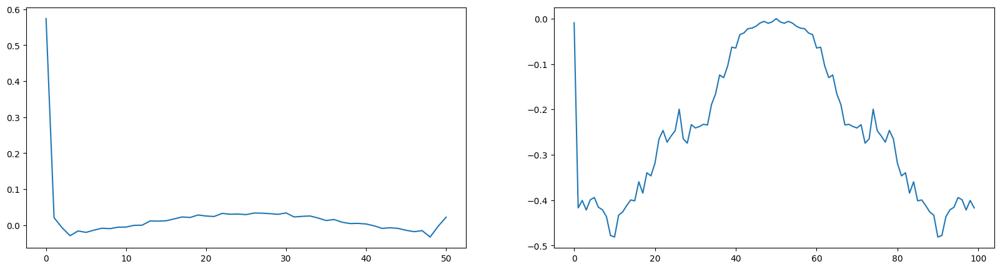

In [ ]:
wiener_star = theoretical_wiener_from_data_1d(train_dataset,fft_sample=signal_length,noise_std=noise_std,noise_scale=noise_scale)
#     wiener_star = theoretical_wiener_from_expected_coeff_sq(mean_coeff_sq, noise_std, len(train_dataset));
plot_filter_and_fft_from_fft_1d(wiener_star, s = 51)
plt.show()

In [ ]:
# wiener_star

### Visualize Theoretical Wiener Denoising

In [ ]:
import numpy as np
from tqdm import tqdm
# Define your get_noise function here
# ...

# Placeholder for the compare_psnr function
def compare_psnr(img1, img2, data_range=1):
    mse = np.mean((img1 - img2) ** 2)
    psnr = 10 * np.log10((data_range ** 2) / mse)
    return psnr

def best_wiener_loss_and_psnr_1d(val_dataset, wiener_star, fft_sample=100, noise_std=0.1, noise_scale=50):
    mean_loss = 0
    mean_psnr = 0
    mean_noisy_psnr = 0;

    for idx in tqdm(range(len(val_dataset))):
        source = val_dataset[idx]
#         print(source.shape)
        if len(source.shape) != 1:
            source = source.squeeze()
        # Add noise to the source
        noisy = source + get_noise(source, mode='G', noise_std=noise_std, noise_scale=noise_scale)

        # Convert to numpy if necessary
        source = source if isinstance(source, np.ndarray) else source.numpy()
        noisy = noisy if isinstance(noisy, np.ndarray) else noisy.numpy()

        # Perform FFT and denoising in the frequency domain
        source_fft = np.fft.fftshift(np.fft.fft(source, n=fft_sample))
        noisy_fft = np.fft.fftshift(np.fft.fft(noisy, n=fft_sample))
        denoised_fft = noisy_fft * wiener_star

        # Perform inverse FFT and clip values
        source_ifft = np.clip(np.real(np.fft.ifft(np.fft.ifftshift(source_fft), n=fft_sample)), 0., 1.)
        noisy_ifft = np.clip(np.real(np.fft.ifft(np.fft.ifftshift(noisy_fft), n=fft_sample)), 0., 1.)
        denoised_ifft = np.clip(np.real(np.fft.ifft(np.fft.ifftshift(denoised_fft), n=fft_sample)), 0., 1.)

        # Calculate loss and PSNR
        mean_loss += np.linalg.norm(denoised_ifft - source_ifft) ** 2
        mean_psnr += compare_psnr(source_ifft, denoised_ifft, data_range=1.)
        mean_noisy_psnr += compare_psnr(source_ifft, noisy, data_range=1.)
    print(mean_noisy_psnr/len(val_dataset))
    return mean_loss / len(val_dataset), mean_psnr / len(val_dataset)

# Replace val_dataset and wiener_star with your actual 1D data arrays and filters.
# mean_loss, mean_psnr = best_wiener_loss_and_psnr_1d(val_dataset, wiener_star)


In [ ]:
len(val_dataset)

100

In [ ]:
val_dataset[0]

tensor([[0.7152, 0.7152, 0.7152, 0.7152, 0.7152, 0.7152, 0.7152, 0.7152, 0.0567,
         0.0567, 0.0567, 0.0567, 0.0567, 0.4777, 0.4777, 0.4777, 0.4777, 0.4777,
         0.4777, 0.4777, 0.4777, 0.4777, 0.4777, 0.4777, 0.4777, 0.4777, 0.8701,
         0.8701, 0.8701, 0.8701, 0.8701, 0.8701, 0.8701, 0.8701, 0.8701, 0.8701,
         0.8701, 0.8701, 0.8701, 0.4736, 0.4736, 0.4736, 0.4736, 0.4736, 0.7369,
         0.7369, 0.7369, 0.7369, 0.7369, 0.1352, 0.1352, 0.1352, 0.1352, 0.1352,
         0.1352, 0.2223, 0.2223, 0.2223, 0.2223, 0.2223, 0.2223, 0.2223, 0.2223,
         0.2223, 0.2223, 0.9698, 0.9698, 0.9698, 0.9698, 0.9698, 0.9698, 0.3582,
         0.3582, 0.3582, 0.3582, 0.3582, 0.3582, 0.3582, 0.3582, 0.6343, 0.6343,
         0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343,
         0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343, 0.6343,
         0.6343]])

In [ ]:
# for source in tqdm(val_dataset):
#     pass

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import wiener
from scipy.fft import fftshift, fft, ifft

# Define your get_noise function here
# ...

def compare_psnr(img1, img2, data_range=1):
    mse = np.mean((img1 - img2) ** 2)
#     psnr = 10 * np.log10((data_range ** 2) / mse)
    epsilon = 1e-10  # A small constant to prevent division by zero
    psnr = 10 * np.log10((data_range ** 2) / (mse + epsilon))
    return psnr

def plot_1d_log_fft(data, ax):
    fft_data = fftshift(fft(data))
    ax.semilogy(np.abs(fft_data))
    ax.set_title('Log FFT')

def visualize_best_wiener_denoising_1d(source, wiener_star, figsize=(20, 10), fft_sample=256, noise_std=0.1, noise_scale=50):

    if len(source.shape) != 1:
        source = source.squeeze()
    # Add noise to the source signal
    noisy = source + get_noise(source, mode='G', noise_std=noise_std, noise_scale=noise_scale)
#     print(noisy.shape)

    # Convert tensors to numpy arrays if necessary
    source = source if isinstance(source, np.ndarray) else source.numpy()
    noisy = noisy if isinstance(noisy, np.ndarray) else noisy.numpy()

    # Compute FFT
    source_fft = fftshift(fft(source, n=fft_sample))
    noisy_fft = fftshift(fft(noisy, n=fft_sample))
    denoised_fft = noisy_fft * wiener_star

    # Compute inverse FFT and clip values
#     source_ifft = np.clip(np.real(ifft(fftshift(source_fft), n=fft_sample)), 0., 1.)
#     noisy_ifft = np.clip(np.real(ifft(fftshift(noisy_fft), n=fft_sample)), 0., 1.)
#     denoised_ifft = np.clip(np.real(ifft(fftshift(denoised_fft), n=fft_sample)), 0., 1.)

    source_ifft = np.real(ifft(fftshift(source_fft), n=fft_sample))
    noisy_ifft = np.real(ifft(fftshift(noisy_fft), n=fft_sample))
    denoised_ifft = np.real(ifft(fftshift(denoised_fft), n=fft_sample))


    # Visualization
    fig, axes = plt.subplots(2, 3, sharex=True, figsize=figsize)
    axes[0, 0].plot(source_ifft)
    axes[0, 0].set_title('Original')

    plot_1d_log_fft(source_ifft, axes[1, 0])

    axes[0, 1].plot(noisy_ifft)
    axes[0, 1].set_title(f'Noisy, PSNR: {compare_psnr(source_ifft, noisy_ifft, data_range=1.):.2f}')

    plot_1d_log_fft(noisy_ifft, axes[1, 1])

    axes[0, 2].plot(denoised_ifft)
    axes[0, 2].set_title(f'Denoised, PSNR: {compare_psnr(source_ifft, denoised_ifft, data_range=1.):.2f}')

    plot_1d_log_fft(denoised_ifft, axes[1, 2])

    plt.tight_layout()
    plt.show()

# Replace source and wiener_star with your actual 1D data arrays
# visualize_best_wiener_denoising_1d(source, wiener_star)


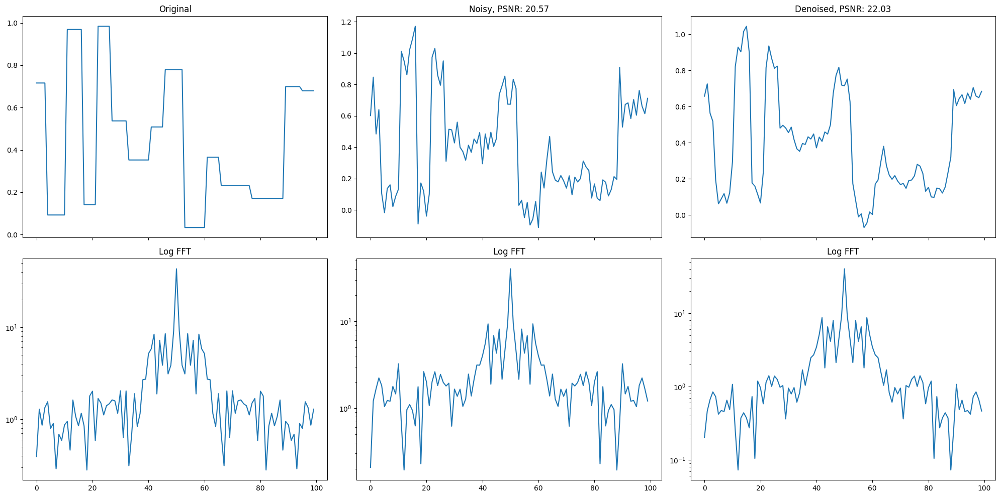

In [ ]:
# import numpy as np
# from PIL import Image
# import torch
# path = '/scratch/kl3141/Denoising_Tutorial/electron-microscopy-denoising/images/clean-images-for-paper/PtNp2-S1-2_2-S3_1_240slc_1024x1024_6nmDefocus.tif'
# image_np = np.array(Image.open(path).resize((256,256)))


# image_tensor = torch.tensor(image_np).unsqueeze(0)
# clean_tmpt = image_tensor.unsqueeze(0)

# # for noise_std in noise_std_array:
# #     print('='*50 +'\n\n')
# #     print('Noise Std: ', noise_std)
signal_tensor = test_dataset[2]
signal_np = signal_tensor[0].numpy()

visualize_best_wiener_denoising_1d(signal_tensor, wiener_star, fft_sample=100,noise_scale=noise_scale)

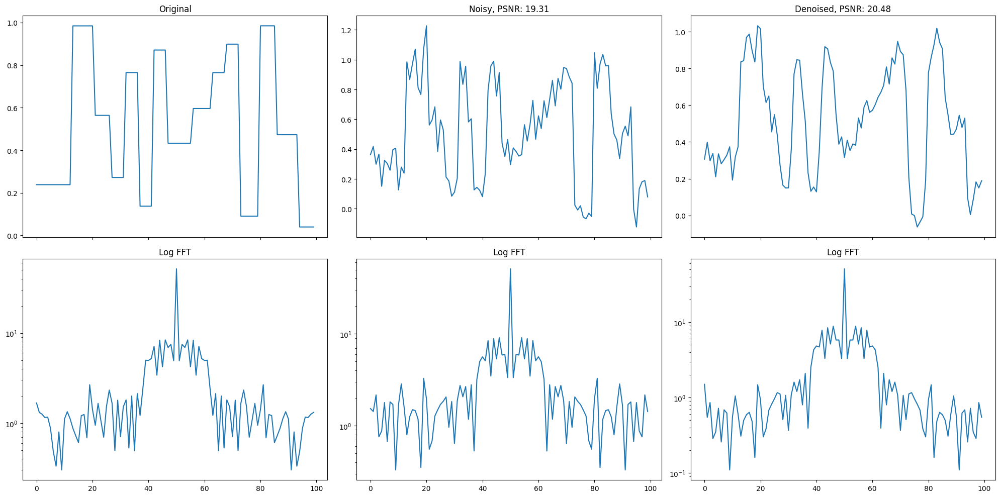

In [ ]:
# import numpy as np
# from PIL import Image
# import torch
# path = '/scratch/kl3141/Denoising_Tutorial/electron-microscopy-denoising/images/clean-images-for-paper/PtNp2-S1-2_2-S3_1_240slc_1024x1024_6nmDefocus.tif'
# image_np = np.array(Image.open(path).resize((256,256)))


# image_tensor = torch.tensor(image_np).unsqueeze(0)
# clean_tmpt = image_tensor.unsqueeze(0)

# # for noise_std in noise_std_array:
# #     print('='*50 +'\n\n')
# #     print('Noise Std: ', noise_std)
signal_tensor = test_dataset[10]
signal_np = signal_tensor[0].numpy()

visualize_best_wiener_denoising_1d(signal_tensor, wiener_star, fft_sample=signal_length,noise_scale=noise_scale)

In [ ]:
len(signal_tensor[0])

100

In [ ]:
len(val_dataset)

100

### Performance of Theoretical Wiener

In [ ]:
# wiener_star_psnr_val_dict = {}
# for noise_std in noise_std_array:
# print('noise std: ', noise_std)
wiener_star_loss, wiener_star_psnr = best_wiener_loss_and_psnr_1d(val_dataset, wiener_star, fft_sample = signal_length,noise_std=noise_std, noise_scale=noise_scale)
print('Loss: ', wiener_star_loss)
print('PSNR: ', wiener_star_psnr)
# wiener_star_psnr_val_dict[noise_std] = wiener_star_psnr
print('='*50 + '\n')

100%|██████████| 100/100 [00:00<00:00, 2325.31it/s]

20.086726462092052
Loss:  0.6183583393565761
PSNR:  22.168289012649506



# Deep Learning Model Training

## Utility function

In [ ]:
import matplotlib.pyplot as plt

def plot_side_by_side_losses(train_loss, val_loss, train_loss_dnn, val_loss_dnn, wiener_star_loss, save_path='side_by_side_losses.pdf', title1='DNN without Batch Normalization', title2='DNN with Batch Normalization', y_max=0.2):


    y_min = 0  # Replace with your desired minimum value
    y_max = y_max  # Replace with your desired maximum value
    # Create a figure with two side-by-side subplots that share the y-axis
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 6), sharey=True)

    # Plotting for the first experiment on the first subplot
    ax1.plot(train_loss, label='Train Loss', color='blue')
    ax1.plot(val_loss, label='Validation Loss', color='green')
    ax1.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')
    ax1.set_title(title1, fontsize=16)
    ax1.set_xlabel('Epoch', fontsize=14)
    ax1.set_ylabel('Loss', fontsize=14)
    ax1.legend()
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax1.set_ylim(y_min, y_max)

    # Plotting for the DNN experiment on the second subplot
    ax2.plot(train_loss_dnn, label='Train Loss', color='blue', linestyle='-.')
    ax2.plot(val_loss_dnn, label='Validation Loss', color='green', linestyle='-.')
    ax2.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')
    ax2.set_title(title2, fontsize=16)
    ax2.set_xlabel('Epoch', fontsize=14)
    ax2.legend()
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax2.set_ylim(y_min, y_max)

    # Ensure a tight layout and save
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

In [ ]:
def train_network_on_noise(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();

            out_train = model(data + get_noise(data, noise_std) );

            loss = criterion(out_train, data);
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
def train_network_on_fixed_noise(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001, seed=0, weight_decay=0):

    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);
    torch.manual_seed(seed)

    noise_list = []
    for i, data in enumerate(train_loader):

      noise = torch.normal(0, noise_std, size=data.shape)

      # noise = torch.clamp(noise, -1, 1)

      noise_list.append(noise)

    # print(noise_list)


    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();

            out_train = model(data + noise_list[i]);

            loss = criterion(out_train, data);
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
import numpy as np
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init

class DnCNNskipcon(nn.Module):
	def __init__(self, depth=20, n_channels=16, image_channels=1, use_bnorm=True, kernel_size=3, use_bias=True, non_linear=True):
		super(DnCNNskipcon, self).__init__()
		kernel_size = 3
		padding = 1

		self.use_bnorm = use_bnorm;
		self.depth = depth;
		self.use_bias= use_bias
		self.non_linear = non_linear


		self.first_layer = nn.Conv1d(in_channels=image_channels, out_channels=n_channels, kernel_size=kernel_size, padding=padding, bias=self.use_bias)

		self.hidden_layer_list = [None] * (self.depth - 2);
		if self.use_bnorm:
			self.bn_layer_list = [None] * (self.depth -2 );

		for i in range(self.depth-2):
			self.hidden_layer_list[i] = nn.Conv1d(in_channels=n_channels, out_channels=n_channels, kernel_size=kernel_size, padding=padding, bias=self.use_bias);
			if self.use_bnorm:
				self.bn_layer_list[i] = nn.BatchNorm1d(n_channels, eps=0.0001, momentum = 0.95)

		self.hidden_layer_list = nn.ModuleList(self.hidden_layer_list);
		if self.use_bnorm:
			self.bn_layer_list = nn.ModuleList(self.bn_layer_list);
		self.last_layer = nn.Conv1d(in_channels=n_channels, out_channels=image_channels, kernel_size=kernel_size, padding=padding, bias=self.use_bias)

		self._initialize_weights()

	def forward(self, x):

		out = self.first_layer(x);
		if self.non_linear:
			out = F.relu(out);

		for i in range(self.depth-2):
			out = self.hidden_layer_list[i](out);
			if self.use_bnorm:
				out = self.bn_layer_list[i](out);
			if self.non_linear:
				out = F.relu(out)

		out = self.last_layer(out) + x;

		return out

	def _initialize_weights(self):
		for m in self.modules():
			if isinstance(m, nn.Conv1d):
				init.orthogonal_(m.weight)
				# print('init weight')
				if m.bias is not None:
					init.constant_(m.bias, 0)
			elif isinstance(m, nn.BatchNorm1d):
				init.constant_(m.weight, 1)
				init.constant_(m.bias, 0)



In [ ]:
def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')


def plot_combined_losses(train_loss, val_loss, train_loss_dnn, val_loss_dnn, wiener_star_loss, save_path='combined_losses.pdf', title1='DNN without Batch Normalization', title2='DNN with Batch Normalization', title='Combined Losses', y_max=0.2, smooth=False, xlim=100, figsize=(8,8), tick_font_size=14):
    y_min = 0
    y_max = y_max
    fig, ax = plt.subplots(figsize=figsize)

    if smooth:
        # Apply moving average if smoothing is desired
        train_loss = moving_average(train_loss)
        val_loss = moving_average(val_loss)
        train_loss_dnn = moving_average(train_loss_dnn)
        val_loss_dnn = moving_average(val_loss_dnn)

    # Plotting for the first experiment
    ax.plot(train_loss, label=title1 + ': Train Loss', color='blue')
    ax.plot(val_loss, label=title1 + ': Validation Loss', color='blue', linestyle='-.')
    # ax.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')

    # Plotting for the DNN experiment
    ax.plot(train_loss_dnn, label=title2 + ': Train Loss', color='green')
    ax.plot(val_loss_dnn, label=title2 + ': Validation Loss', color='green', linestyle='-.')

    # ax.set_title(title, fontsize=16)
    ax.set_xlabel('Epoch', fontsize=14)
    ax.set_ylabel('MSE', fontsize=14)
    ax.legend(fontsize=16)
    # ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), fancybox=True, shadow=True, ncol=2)

    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.set_ylim(y_min, y_max)
    ax.set_xlim(0, xlim)

    ax.tick_params(axis='both', which='major', labelsize=tick_font_size)


    plt.tight_layout()
    save_path = title1 + title2 + '.png'
    plt.savefig(save_path, dpi=300)
    plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_validation_losses_seaborn(val_loss, val_loss_dnn, title1='DNN without Batch Normalization',
                                   title2='DNN with Batch Normalization', title='Validation Losses Comparison',
                                   y_max=0.2, smooth=False, xlim=100, figsize=(8,8), tick_font_size=14, ylabel='MSE',
                                  legend_font_size=16, append=''):

    # Apply moving average if smoothing is desired
    if smooth:
        val_loss = moving_average(val_loss)
        val_loss_dnn = moving_average(val_loss_dnn)

    # Create a DataFrame for Seaborn plotting
    epochs = range(1, len(val_loss) + 1)
    df = pd.DataFrame({
        'Epoch': np.concatenate((epochs, epochs)),
        'Loss': np.concatenate((val_loss, val_loss_dnn)),
        'Model': np.concatenate((([title1] * len(val_loss)), ([title2] * len(val_loss_dnn))))
    })

    # Plotting using Seaborn
    plt.figure(figsize=figsize)
    sns.lineplot(data=df, x='Epoch', y='Loss', hue='Model', palette=['blue', 'red'], linewidth=2.5)

#     plt.title(title)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.ylim(0, y_max)
    plt.xlim(0, xlim)
    plt.tick_params(axis='both', which='major', labelsize=tick_font_size)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.grid(False)
    plt.legend(fontsize=legend_font_size)
    plt.tight_layout()

    save_path = append + ylabel + title1 + '_' + title2 + 'piecewiseconstant_validation.png'
    plt.savefig(save_path, dpi=300)
    plt.show()


In [ ]:
# noise_std =0.05

In [ ]:

prob_val = 0.3
min_sep = 5
signal_length = 100
n_sample = 1
train_dataset = PieceWiseConstantDataset(n_data = n_sample, prob = prob_val, n_signal = signal_length, fix_datapoints = True, min_sep = min_sep, use_circular_shift=False, circular_shift_get_item=False)
val_dataset = PieceWiseConstantDataset(n_data = 100, n_signal = signal_length, prob = prob_val, min_sep =min_sep, use_circular_shift=False,circular_shift_get_item=False);
train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=32, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 1,
                       shuffle = False)

## Supervised training: ablation on different training recipes

### Continuous noise or not

In [ ]:
train_dataset = train_loader.dataset
val_dataset = val_loader.dataset
test_loader = val_loader
test_dataset = test_loader.dataset

In [ ]:
noise_std =0.1

In [ ]:
net_nn_wo_bn = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3,  use_bias=True)
# train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_noise(net_nn_wo_bn, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 200,
#                        milestone = 50,
#                       lr = 1e-2)

train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_fixed_noise(net_nn_wo_bn, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  170.3858642578125 val error:  156.58089698791503
1 train error:  0.7984710931777954 val error:  1.01304432451725
2 train error:  0.9317355751991272 val error:  1.0755671095848083
3 train error:  1.1472193002700806 val error:  1.021991469860077
4 train error:  1.9838370084762573 val error:  1.6454890036582948
5 train error:  1.2458369731903076 val error:  0.9951766556501389
6 train error:  1.0059648752212524 val error:  1.0259773313999176
7 train error:  1.0057768821716309 val error:  1.1249984645843505
8 train error:  1.0419433116912842 val error:  1.0908372807502746
9 train error:  1.3087811470031738 val error:  1.0787890642881393
10 train error:  1.0037063360214233 val error:  1.0148465591669082
11 train error:  1.1498898267745972 val error:  0.9979575139284134
12 train error:  1.017174243927002 val error:  1.0802845829725265
13 train error:  1.1799393892288208 val error:  1.1333528810739517
14 train error:  1.0032390356063843 val error:  1.0873407298326492
15 train e

In [ ]:
net_nn_fixed_noise = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)
train_loss_dnn_fixed_noise, val_loss_dnn_fixed_noise = train_network_on_fixed_noise(net_nn_fixed_noise, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  141.21563720703125 val error:  129.88315551757813
1 train error:  0.7745583057403564 val error:  0.9966772735118866
2 train error:  0.926702618598938 val error:  1.068590053319931
3 train error:  1.4697872400283813 val error:  1.3054379278421402
4 train error:  1.7988635301589966 val error:  1.705470461845398
5 train error:  1.5417050123214722 val error:  1.2342931401729584
6 train error:  0.9904024004936218 val error:  0.9966374039649963
7 train error:  1.4064596891403198 val error:  1.4933093392848968
8 train error:  1.2522709369659424 val error:  1.1727695947885513
9 train error:  1.4270204305648804 val error:  1.0236610877513885
10 train error:  1.0188748836517334 val error:  1.027205541729927
11 train error:  1.143575668334961 val error:  1.0269877010583877
12 train error:  0.9458770751953125 val error:  1.0042162996530533
13 train error:  1.0787144899368286 val error:  1.0355538731813432
14 train error:  1.1550073623657227 val error:  1.2732809406518937
15 train e

In [ ]:
net_nn_continous_noise = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3,use_bias=True)
train_loss_dnn_continous_noise, val_loss_dnn_continous_noise = train_network_on_noise(net_nn_continous_noise, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  8.157938957214355 val error:  7.564953408241272
1 train error:  2.3887479305267334 val error:  1.9661765170097352
2 train error:  1.3807649612426758 val error:  1.465719256401062
3 train error:  0.9562880992889404 val error:  1.104423770904541
4 train error:  0.8771967887878418 val error:  1.0028831630945205
5 train error:  1.5678659677505493 val error:  1.6633613961935043
6 train error:  0.9067466855049133 val error:  1.0129651761054992
7 train error:  0.8421238660812378 val error:  1.0061254143714904
8 train error:  0.9553436040878296 val error:  1.0407109588384629
9 train error:  1.2898775339126587 val error:  1.0463711988925934
10 train error:  1.0099072456359863 val error:  1.0582168358564377
11 train error:  0.9427448511123657 val error:  1.0452360677719117
12 train error:  1.2003223896026611 val error:  0.9930599552392959
13 train error:  1.0269687175750732 val error:  0.9926590520143509
14 train error:  0.8888963460922241 val error:  0.9876463341712952
15 train 

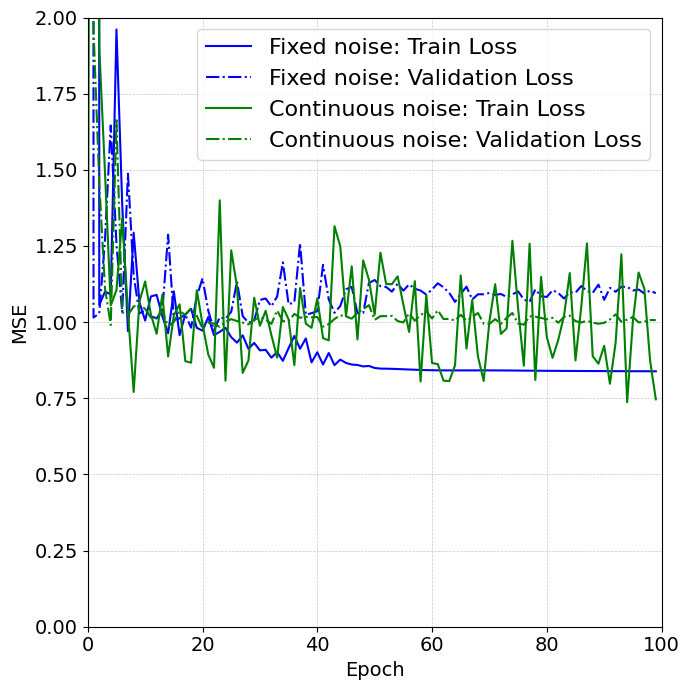

In [ ]:
plot_combined_losses(train_loss_dnn_fixed_noise*signal_length, val_loss_dnn_fixed_noise, train_loss_dnn_continous_noise*signal_length, val_loss_dnn_continous_noise, wiener_star_loss, title1='Fixed noise', title2='Continuous noise', y_max=2, smooth=False, xlim=100, figsize=(7,7))

### Skip connection

#### Small training set

In [ ]:

prob_val = 0.3
min_sep = 5
signal_length = 100
n_sample = 10
train_dataset = PieceWiseConstantDataset(n_data = n_sample, prob = prob_val, n_signal = signal_length, fix_datapoints = True, min_sep = min_sep, use_circular_shift=False, circular_shift_get_item=False)
val_dataset = PieceWiseConstantDataset(n_data = 100, n_signal = signal_length, prob = prob_val, min_sep =min_sep, use_circular_shift=False,circular_shift_get_item=False);
train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=32, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 1,
                       shuffle = False)

In [ ]:
net_nn_w_skipcon = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)

train_loss_dnn_w_skipcon, val_loss_dnn_w_skipcon = train_network_on_fixed_noise(net_nn_w_skipcon, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 200,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  7.760868835449219 val error:  8.101620678901673
1 train error:  1.06219539642334 val error:  1.0925176399946213
2 train error:  1.1969154357910157 val error:  1.13114610850811
3 train error:  1.1294898986816406 val error:  1.052351315021515
4 train error:  1.038254165649414 val error:  1.0005606281757355
5 train error:  1.1346341133117677 val error:  1.1024090456962585
6 train error:  1.0277816772460937 val error:  1.025078467130661
7 train error:  1.0592963218688964 val error:  0.9972327440977097
8 train error:  1.0540550231933594 val error:  1.018073096871376
9 train error:  1.0273497581481934 val error:  0.981283746957779
10 train error:  1.017288875579834 val error:  1.0024210900068282
11 train error:  0.9579489707946778 val error:  0.9972904831171036
12 train error:  1.1020987510681153 val error:  1.0021849608421325
13 train error:  1.0620737075805664 val error:  1.0171923637390137
14 train error:  1.061140537261963 val error:  1.0082347244024277
15 train error:  0

In [ ]:
net_nn_wo_skipcon = DnCNN(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)

train_loss_dnn_wo_skipcon, val_loss_dnn_wo_skipcon = train_network_on_fixed_noise(net_nn_wo_skipcon, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 200,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  3.8386676788330076 val error:  3.946085259914398
1 train error:  14272.796875 val error:  15507.067431640626
2 train error:  2.9214073181152345 val error:  2.8204927802085877
3 train error:  28.451779174804688 val error:  30.29023977279663
4 train error:  29.270974731445314 val error:  31.132426929473876
5 train error:  28.78949890136719 val error:  30.63471667289734
6 train error:  27.051885986328124 val error:  28.849213256835938
7 train error:  23.512174987792967 val error:  25.206355066299437
8 train error:  17.145826721191405 val error:  18.557809114456177
9 train error:  7.959746551513672 val error:  8.80601578950882
10 train error:  34.682421875 val error:  34.86190969467163
11 train error:  7.654316711425781 val error:  8.17334732055664
12 train error:  9.031805419921875 val error:  10.049076538085938
13 train error:  12.634093475341796 val error:  13.911119332313538
14 train error:  14.69034423828125 val error:  16.096031341552735
15 train error:  15.6619720458

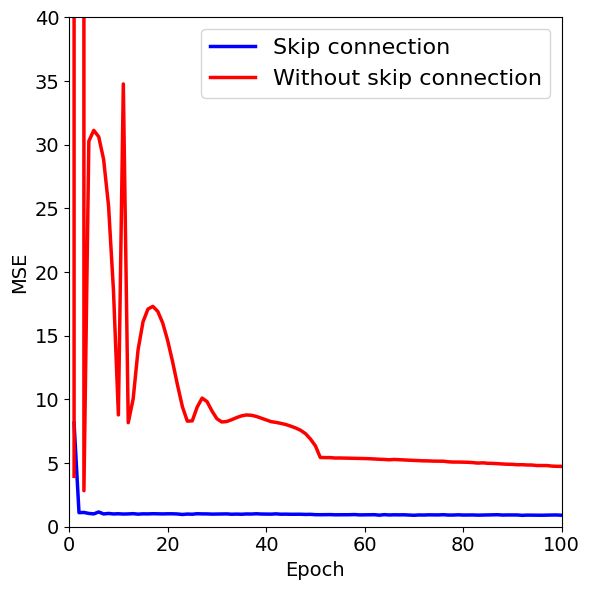

In [ ]:
plot_validation_losses_seaborn(  val_loss_dnn_w_skipcon, val_loss_dnn_wo_skipcon, title1='Skip connection', title2='Without skip connection', y_max=40, smooth=False, xlim=100, figsize=(6,6))

In [ ]:
# plot_combined_losses(train_loss_dnn_w_skipcon*signal_length, val_loss_dnn_w_skipcon, train_loss_dnn_wo_skipcon*signal_length, val_loss_dnn_wo_skipcon, wiener_star_loss, title1='Skip connection', title2='Without skip connection', y_max=10, smooth=False)

#### Large training set

In [ ]:

prob_val = 0.3
min_sep = 5
signal_length = 100
n_sample = 500
train_dataset = PieceWiseConstantDataset(n_data = n_sample, prob = prob_val, n_signal = signal_length, fix_datapoints = True, min_sep = min_sep, use_circular_shift=False, circular_shift_get_item=False)
val_dataset = PieceWiseConstantDataset(n_data = 100, n_signal = signal_length, prob = prob_val, min_sep =min_sep, use_circular_shift=False,circular_shift_get_item=False);
train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=32, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 1,
                       shuffle = False)

In [ ]:
net_nn_w_skipcon_large = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)

train_loss_dnn_w_skipcon_large, val_loss_dnn_w_skipcon_large = train_network_on_fixed_noise(net_nn_w_skipcon_large, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 200,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  0.577304744720459 val error:  0.5779720059037209
1 train error:  0.4171408348083496 val error:  0.4007560209929943
2 train error:  0.3553814935684204 val error:  0.34487072452902795
3 train error:  0.35792863845825196 val error:  0.3679520982503891
4 train error:  0.32580090999603273 val error:  0.323939558416605
5 train error:  0.33862210655212405 val error:  0.34083803355693815
6 train error:  0.29325495529174805 val error:  0.2809868983179331
7 train error:  0.2701397933959961 val error:  0.26937454119324683
8 train error:  0.2787562732696533 val error:  0.26473235204815865
9 train error:  0.2944590997695923 val error:  0.29496168851852417
10 train error:  0.27204989051818845 val error:  0.26495617128908633
11 train error:  0.2759673919677734 val error:  0.2685610594600439
12 train error:  0.2645166568756104 val error:  0.26272131644189356
13 train error:  0.2525491409301758 val error:  0.2592268587648869
14 train error:  0.2517229595184326 val error:  0.257832909971

In [ ]:
net_nn_wo_skipcon_large = DnCNN(depth=10, n_channels=16, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)


train_loss_dnn_wo_skipcon_large, val_loss_dnn_wo_skipcon_large = train_network_on_fixed_noise(net_nn_wo_skipcon_large, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 200,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  8.581985870361327 val error:  8.50373114824295
1 train error:  3.7146263275146483 val error:  3.5800203704833984
2 train error:  1.233854679107666 val error:  1.238530421257019
3 train error:  0.9622112236022949 val error:  0.9729255193471908
4 train error:  0.8243876113891602 val error:  0.8332026025652886
5 train error:  0.701878870010376 val error:  0.7023465797305107
6 train error:  0.5584986724853516 val error:  0.5686000412702561
7 train error:  0.44700584983825686 val error:  0.45339173316955567
8 train error:  0.41866258239746096 val error:  0.41567944511771204
9 train error:  0.3873693218231201 val error:  0.3975559450685978
10 train error:  0.3660637855529785 val error:  0.36738945186138156
11 train error:  0.36025051212310794 val error:  0.35853716790676116
12 train error:  0.39268840789794923 val error:  0.39994056925177573
13 train error:  0.3343896083831787 val error:  0.3349557659029961
14 train error:  0.31769408988952635 val error:  0.34194421499967576


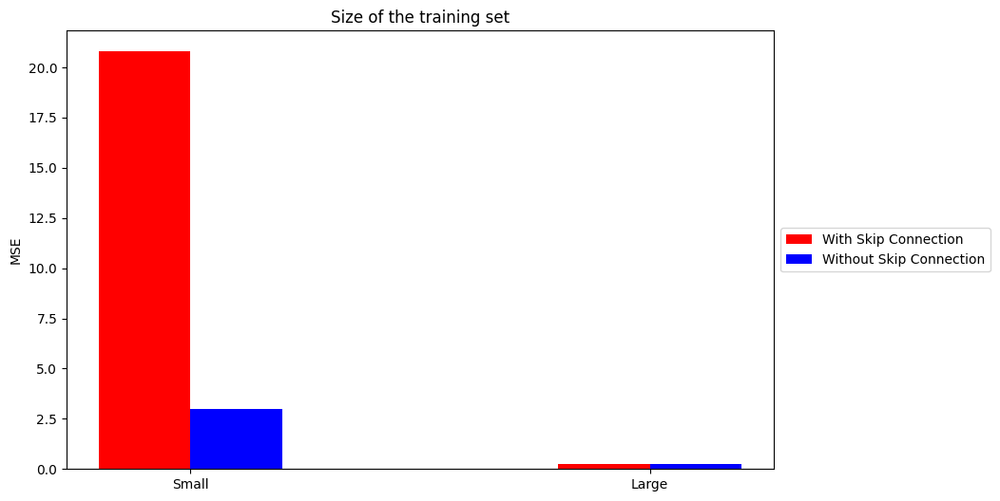

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Colors and fine-tuning sets as specified
category_colors = {
    'With Skip Connection': 'red',
    'Without Skip Connection': 'blue'
}

ft_sets = {
    'Small': [('With Skip Connection', 20.788661925792694150000), ('Without Skip Connection', 3.0075262880325315)],
    'Large': [('With Skip Connection', 0.22647472001612187), ('Without Skip Connection', 0.24923587411642076)],
}

# Create subplots
fig, ax = plt.subplots(figsize=(12, 6))

# Adjust the bar width and offset
bar_width = 0.2
offset = bar_width * len(category_colors)

# Track labels for the legend
legend_labels = {}

# Plot each Fine-Tuning Set
for i, (ft_set, data_tuples) in enumerate(ft_sets.items()):
    bottom = 0
    for j, (data_type, size) in enumerate(data_tuples):
        position = i - offset / 2 + j * bar_width
        ax.bar(position, size, width=bar_width, color=category_colors[data_type], label=data_type if data_type not in legend_labels else "")
        legend_labels[data_type] = category_colors[data_type]

# Adjust the axes and labels
ax.set_xticks(np.arange(len(ft_sets)) - offset / 2 + bar_width * (len(category_colors) - 1) / 2)
ax.set_xticklabels(ft_sets.keys())
ax.set_ylabel('MSE')
ax.set_title('Size of the training set')

# Add the legend
# ax.legend()
# Adjust the plot area and set the legend outside
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height]) # Resize plot to make space for legend
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Show the plot
plt.show()


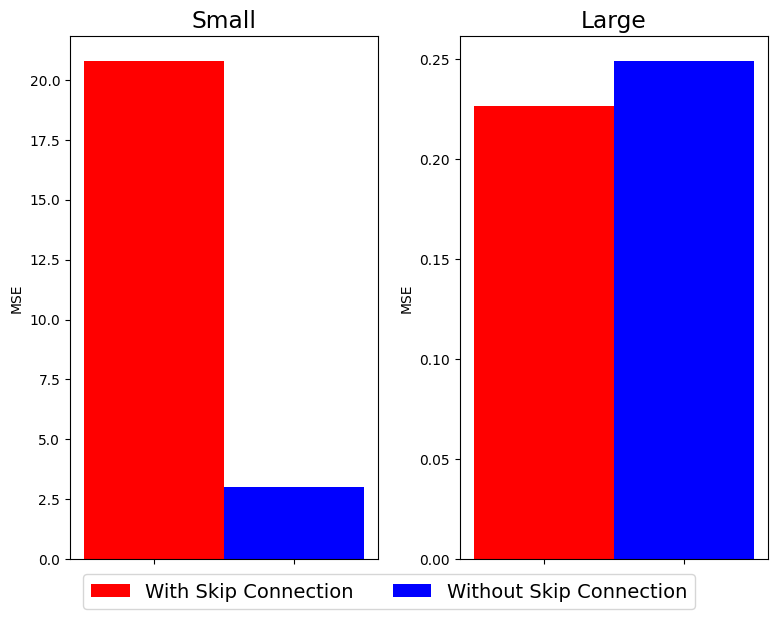

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Colors and fine-tuning sets as specified
category_colors = {
    'With Skip Connection': 'red',
    'Without Skip Connection': 'blue'
}

ft_sets = {
    'Small': [('With Skip Connection', 20.788661925792694150000), ('Without Skip Connection', 3.0075262880325315)],
    'Large': [('With Skip Connection', 0.22647472001612187), ('Without Skip Connection', 0.24923587411642076)],
}

# Further adjustments based on the new requirements:
# - Make bars much narrower
# - Place a shared legend at the bottom of the plots

# Adjust plot size
fig, axs = plt.subplots(1, 2, figsize=(8, 6))  # Width remains decreased

# Adjust the bar width to be much narrower
bar_width = 0.1

# Increase font size
plt.rcParams.update({'font.size': 14})

legend_labels = {}

# Plot each Fine-Tuning Set
for ax, (ft_set, data_tuples) in zip(axs, ft_sets.items()):
    for j, (data_type, size) in enumerate(data_tuples):
        position = j * bar_width
        ax.bar(position, size, width=bar_width, color=category_colors[data_type], label=data_type if data_type not in legend_labels else "")
        legend_labels[data_type] = category_colors[data_type]

    # Adjust the axes and labels
    ax.set_xticks(np.arange(len(data_tuples)) * bar_width)
    ax.set_xticklabels([])
    ax.set_ylabel('MSE')
    ax.set_title(f'{ft_set}')

# Adjust subplot layout
plt.tight_layout()

# Add a shared legend at the bottom of the plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=len(legend_labels), bbox_to_anchor=(0.5, -0.05))
plt.savefig("training_set_comparison_plot.png", dpi=300, bbox_inches='tight')
plt.show()



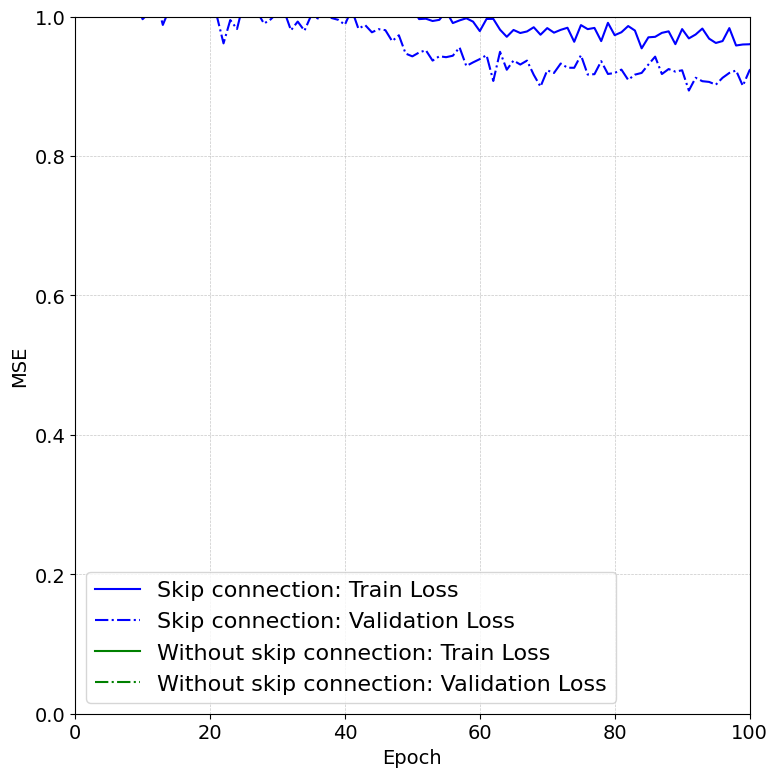

In [ ]:
plot_combined_losses(train_loss_dnn_w_skipcon*signal_length, val_loss_dnn_w_skipcon, train_loss_dnn_wo_skipcon*signal_length, val_loss_dnn_wo_skipcon, wiener_star_loss, title1='Skip connection', title2='Without skip connection', y_max=1, smooth=False)

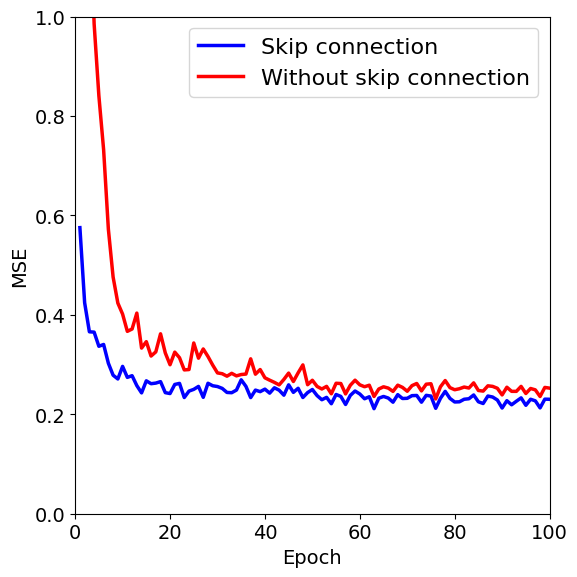

In [ ]:
plot_validation_losses_seaborn(  val_loss_dnn_w_skipcon_large, val_loss_dnn_wo_skipcon_large, title1='Skip connection', title2='Without skip connection', y_max=1, smooth=False, xlim=100, figsize=(6,6),append='Large')

In [ ]:
params = { 'val_loss_dnn_w_skipcon':val_loss_dnn_w_skipcon,
          'val_loss_dnn_wo_skipcon':val_loss_dnn_wo_skipcon,
          'val_loss_dnn_w_skipcon_large':val_loss_dnn_w_skipcon_large,
          'val_loss_dnn_wo_skipcon_large':val_loss_dnn_wo_skipcon_large,
          }


filename = 'piecewise_skipconnect_stats.pkl'
with open(filename, 'wb') as file:
    pickle.dump(params, file)


### Number of layers

In [ ]:

prob_val = 0.3
min_sep = 5
signal_length = 100
n_sample = 500
train_dataset = PieceWiseConstantDataset(n_data = n_sample, prob = prob_val, n_signal = signal_length, fix_datapoints = True, min_sep = min_sep, use_circular_shift=False, circular_shift_get_item=False)
val_dataset = PieceWiseConstantDataset(n_data = 100, n_signal = signal_length, prob = prob_val, min_sep =min_sep, use_circular_shift=False,circular_shift_get_item=False);
train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=32, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 1,
                       shuffle = False)

In [ ]:
net_nn_linear = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True, non_linear=False)
# train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_noise(net_nn_wo_bn, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 200,
#                        milestone = 50,
#                       lr = 1e-2)

train_loss_dnn_linear, val_loss_dnn_linear = train_network_on_fixed_noise(net_nn_linear, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  2976000.376 val error:  2926347.97
1 train error:  665130.002 val error:  662903.390625
2 train error:  4150.39809375 val error:  4148.235539550781
3 train error:  1249.31870703125 val error:  1263.3775817871094
4 train error:  254.3378076171875 val error:  251.96155395507813
5 train error:  88.12860693359374 val error:  91.01185333251954
6 train error:  38.7987451171875 val error:  38.00027402877808
7 train error:  20.705505432128906 val error:  20.79046799659729
8 train error:  12.817237335205078 val error:  12.71326268196106
9 train error:  10.379516540527344 val error:  10.507066836357117
10 train error:  9.060799591064454 val error:  9.007788763046264
11 train error:  8.175151885986327 val error:  8.226590662002563
12 train error:  7.5028781433105465 val error:  7.54487720489502
13 train error:  7.076763244628906 val error:  7.0881566190719605
14 train error:  6.690968780517578 val error:  6.801659893989563
15 train error:  6.381901184082031 val error:  6.346635622

In [ ]:
net_nn_overfitting = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)
# train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_noise(net_nn_wo_bn, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 200,
#                        milestone = 50,
#                       lr = 1e-2)

train_loss_dnn_overfitting, val_loss_dnn_overfitting = train_network_on_fixed_noise(net_nn_overfitting, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  1.0358166389465333 val error:  1.0258919262886048
1 train error:  1.0144176330566406 val error:  0.9978270125389099
2 train error:  0.9937106513977051 val error:  0.9883690106868744
3 train error:  0.8064145698547364 val error:  0.7959943509101868
4 train error:  0.49475931930541994 val error:  0.4887234655022621
5 train error:  0.4100853023529053 val error:  0.40711486369371414
6 train error:  0.35901412391662596 val error:  0.34942410230636595
7 train error:  0.331263973236084 val error:  0.33308845326304437
8 train error:  0.3179232759475708 val error:  0.3062581531703472
9 train error:  0.29363594818115235 val error:  0.29325157061219215
10 train error:  0.2824472255706787 val error:  0.2737407334893942
11 train error:  0.29332581424713133 val error:  0.2840639619529247
12 train error:  0.27542758464813233 val error:  0.27574352055788043
13 train error:  0.28419304752349855 val error:  0.2943127409368753
14 train error:  0.29325864410400393 val error:  0.30346966013

In [ ]:
net_nn_2layer= DnCNNskipcon(depth=2, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)
# train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_noise(net_nn_wo_bn, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 200,
#                        milestone = 50,
#                       lr = 1e-2)

train_loss_dnn_2layer, val_loss_dnn_2layer = train_network_on_fixed_noise(net_nn_2layer, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  0.617411735534668 val error:  0.6193938824534416
1 train error:  0.530801519393921 val error:  0.5212669146060943
2 train error:  0.4929496822357178 val error:  0.4839776000380516
3 train error:  0.4732133541107178 val error:  0.4819732823967934
4 train error:  0.4557573070526123 val error:  0.4541735732555389
5 train error:  0.42399562644958494 val error:  0.4277015273272991
6 train error:  0.3908437404632568 val error:  0.385059529542923
7 train error:  0.37190244293212893 val error:  0.37089831098914144
8 train error:  0.37179088497161866 val error:  0.35510013639926913
9 train error:  0.3689650287628174 val error:  0.37079900041222574
10 train error:  0.36702314949035647 val error:  0.3578138613700867
11 train error:  0.36374591636657716 val error:  0.350745557397604
12 train error:  0.36211726570129393 val error:  0.3642898552119732
13 train error:  0.36548815155029296 val error:  0.36836291059851645
14 train error:  0.3570627546310425 val error:  0.372390698343515

In [ ]:
net_nn_5layer= DnCNNskipcon(depth=5, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)
# train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_noise(net_nn_wo_bn, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 200,
#                        milestone = 50,
#                       lr = 1e-2)

train_loss_dnn_5layer, val_loss_dnn_5layer = train_network_on_fixed_noise(net_nn_5layer, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  0.5827444725036621 val error:  0.5901662027835846
1 train error:  0.4006979217529297 val error:  0.3901182074844837
2 train error:  0.36397178745269776 val error:  0.35433251172304153
3 train error:  0.3567311630249023 val error:  0.3671650268137455
4 train error:  0.3411578788757324 val error:  0.33759430795907974
5 train error:  0.3259164962768555 val error:  0.32720035254955293
6 train error:  0.30819694805145265 val error:  0.30173151910305024
7 train error:  0.32987347412109375 val error:  0.3286005142331123
8 train error:  0.30522473239898684 val error:  0.2927037063241005
9 train error:  0.30768106269836426 val error:  0.30711957037448884
10 train error:  0.2944830455780029 val error:  0.288870442956686
11 train error:  0.28992170429229736 val error:  0.2835980425775051
12 train error:  0.28869353675842285 val error:  0.290829391553998
13 train error:  0.28468981647491454 val error:  0.29357505686581137
14 train error:  0.28666741466522216 val error:  0.295806436

In [ ]:
net_nn_15layer= DnCNNskipcon(depth=15, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)
# train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_noise(net_nn_wo_bn, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 200,
#                        milestone = 50,
#                       lr = 1e-2)

train_loss_dnn_15layer, val_loss_dnn_15layer = train_network_on_fixed_noise(net_nn_15layer, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  1.0028867263793946 val error:  1.0003793412446975
1 train error:  1.0165248794555664 val error:  0.9995349305868149
2 train error:  0.9973915519714356 val error:  0.9862563627958297
3 train error:  1.0012208518981933 val error:  0.9890349000692368
4 train error:  0.9877790298461914 val error:  0.9831887447834015
5 train error:  0.7598575534820556 val error:  0.7765952312946319
6 train error:  0.46343451690673826 val error:  0.45656034916639326
7 train error:  0.4241090984344482 val error:  0.4312538784742355
8 train error:  0.3712816352844238 val error:  0.3538260677456856
9 train error:  0.3388716707229614 val error:  0.33878225937485695
10 train error:  0.3131788806915283 val error:  0.3084929487109184
11 train error:  0.3029331102371216 val error:  0.2962910640984774
12 train error:  0.2958126239776611 val error:  0.2922793197631836
13 train error:  0.28782379627227783 val error:  0.2960954421758652
14 train error:  0.2730595226287842 val error:  0.2798243276774883
1

In [ ]:
net_nn_20layer= DnCNNskipcon(depth=20, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3, use_bias=True)
# train_loss_dnn_wo_bn, val_loss_dnn_wo_bn = train_network_on_noise(net_nn_wo_bn, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 200,
#                        milestone = 50,
#                       lr = 1e-2)

train_loss_dnn_20layer, val_loss_dnn_20layer = train_network_on_fixed_noise(net_nn_20layer, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  1.0022885246276856 val error:  0.9985812628269195
1 train error:  1.0156086959838868 val error:  0.9990698009729385
2 train error:  0.9978290061950683 val error:  0.9864395171403885
3 train error:  1.0045975265502929 val error:  0.9923635226488113
4 train error:  1.0068818397521972 val error:  1.0002851974964142
5 train error:  0.9987425231933593 val error:  1.016648769378662
6 train error:  0.9944099044799805 val error:  1.0001673263311386
7 train error:  0.9921551208496093 val error:  1.0076913756132126
8 train error:  0.9962459411621094 val error:  0.9596150207519532
9 train error:  0.9953739318847656 val error:  0.9822996562719345
10 train error:  1.0064855041503906 val error:  0.9635233122110367
11 train error:  1.0049323921203612 val error:  0.992819932103157
12 train error:  0.9951096992492676 val error:  0.9956686395406723
13 train error:  1.1034508361816406 val error:  1.102954894900322
14 train error:  1.0014809532165527 val error:  1.029987143278122
15 train 

[0.6122653645887061, 0.3367959952354431, 0.24160549022257327, 0.2328472763299942, 0.23142494209110737]


<ipython-input-104-822213987769>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='Validation Loss', data=df, palette='muted')


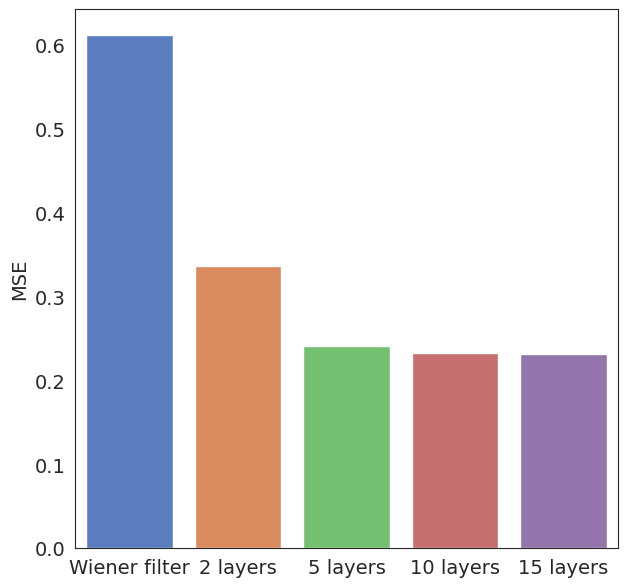

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Sample data
epoch_idx = 80
val_losses_list = [0.6122653645887061, val_loss_dnn_2layer[epoch_idx], val_loss_dnn_5layer[epoch_idx], val_loss_dnn_overfitting[epoch_idx], val_loss_dnn_15layer[epoch_idx]]
print(val_losses_list)
model_names = ['Wiener filter', '2 layers', '5 layers', '10 layers', '15 layers']

# Create a DataFrame for the data
data = {
    'Model': model_names,
    'Validation Loss': val_losses_list
}

df = pd.DataFrame(data)

# Set Seaborn style to white (no grid)
sns.set_style("white")

# Create the plot
plt.figure(figsize=(7,7))
sns.barplot(x='Model', y='Validation Loss', data=df, palette='muted')

# Set plot title and labels
plt.xlabel('')
plt.ylabel('MSE')

# Increase font size for better visibility
plt.rcParams.update({'font.size': 12})

plt.savefig("num_layers_training_set_comparison_plot.pdf", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [ ]:
# params = {          'Wiener filter': 0.6122653645887061, '2 layers':val_loss_dnn_2layer[epoch_idx],
#                     '5 layers': val_loss_dnn_5layer[epoch_idx],
#                     '10 layers':val_loss_dnn_overfitting[epoch_idx],
#                     '15 layers':val_loss_dnn_15layer[epoch_idx]
#           }


# filename = 'piecewise_layers_stats.pkl'
# with open(filename, 'wb') as file:
#     pickle.dump(params, file)


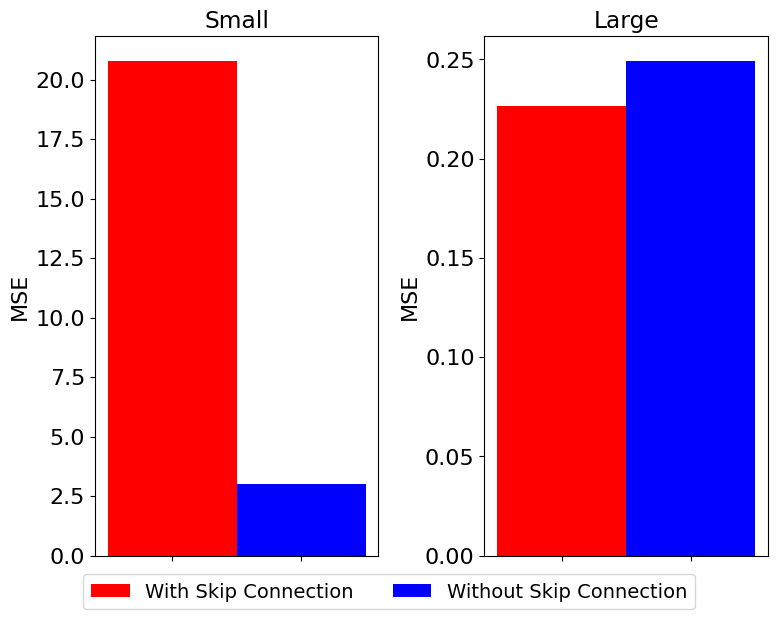

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Colors and fine-tuning sets as specified
category_colors = {
    'With Skip Connection': 'red',
    'Without Skip Connection': 'blue'
}


# Further adjustments based on the new requirements:
# - Make bars much narrower
# - Place a shared legend at the bottom of the plots

# Adjust plot size
fig, axs = plt.subplots(1, 2, figsize=(8, 6))  # Width remains decreased

# Adjust the bar width to be much narrower
bar_width = 0.1

# Increase font size
plt.rcParams.update({'font.size': 14})

legend_labels = {}

# Plot each Fine-Tuning Set
for ax, (ft_set, data_tuples) in zip(axs, ft_sets.items()):
    for j, (data_type, size) in enumerate(data_tuples):
        position = j * bar_width
        ax.bar(position, size, width=bar_width, color=category_colors[data_type], label=data_type if data_type not in legend_labels else "")
        legend_labels[data_type] = category_colors[data_type]

    # Adjust the axes and labels
    ax.set_xticks(np.arange(len(data_tuples)) * bar_width)
    ax.set_xticklabels([])
    ax.set_ylabel('MSE')
    ax.set_title(f'{ft_set}')

# Adjust subplot layout
plt.tight_layout()

# Add a shared legend at the bottom of the plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=len(legend_labels), bbox_to_anchor=(0.5, -0.05))
plt.savefig("training_set_comparison_plot.png", dpi=300, bbox_inches='tight')
plt.show()



In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_validation_losses_seaborn(val_losses, model_names, wiener_star_loss, title='Validation Losses Comparison',
                                   y_max=0.2, smooth=False, xlim=100, figsize=(5,5), tick_font_size=14, ylabel='MSE',
                                   legend_font_size=16, append=''):

    # Check if the lengths of val_losses and model_names are equal
    if len(val_losses) != len(model_names):
        raise ValueError("The lengths of val_losses and model_names must be the same.")

    # Apply moving average if smoothing is desired and prepare data for DataFrame
    epochs_list = []
    losses_list = []
    models_list = []

    for i, (val_loss, model_name) in enumerate(zip(val_losses, model_names)):
        if smooth:
            val_loss = moving_average(val_loss)

        epochs = range(1, len(val_loss) + 1)
        epochs_list.extend(epochs)
        losses_list.extend(val_loss)
        models_list.extend([model_name] * len(val_loss))

    # Create a DataFrame for Seaborn plotting
    df = pd.DataFrame({
        'Epoch': epochs_list,
        'Loss': losses_list,
        'Model': models_list
    })

    # Plotting using Seaborn
    plt.figure(figsize=figsize)
    lineplot = sns.lineplot(data=df, x='Epoch', y='Loss', hue='Model', palette=sns.color_palette("hsv", len(model_names)), linewidth=2.5)

    # Add horizontal line for wiener_star_loss in orange color
    wiener_line = plt.axhline(y=wiener_star_loss, color='orange', linestyle='--', linewidth=2)

    # Modify the legend to include wiener_star_loss
    handles, labels = lineplot.get_legend_handles_labels()
    handles.append(wiener_line)
    labels.append(f'Wiener Loss')
    plt.legend(handles=handles, labels=labels, fontsize=legend_font_size)

    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.ylim(0, y_max)
    plt.xlim(0, xlim)
    plt.tick_params(axis='both', which='major', labelsize=tick_font_size)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.grid(False)
    plt.tight_layout()

    save_path = append + ylabel + '_'.join(model_names) + '_validation.png'
    plt.savefig(save_path, dpi=300)
    plt.show()


In [ ]:
val_losses_list = [val_loss_dnn_linear, val_loss_dnn_2layer, val_loss_dnn_5layer, val_loss_dnn_overfitting, val_loss_dnn_15layer]
model_names = ['10 layers linear','2 layers', '5 layers', '10 layers', '15 layers']

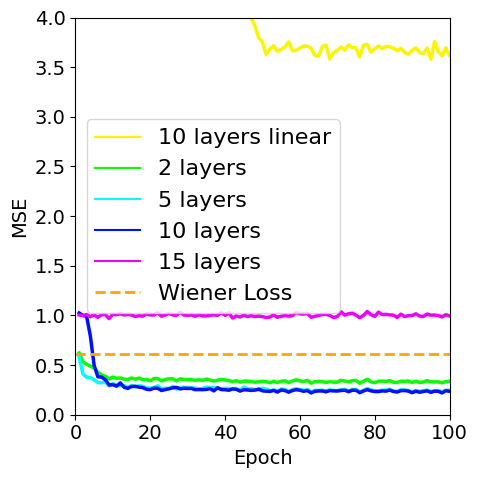

In [ ]:
plot_validation_losses_seaborn(val_losses_list, model_names, wiener_star_loss, y_max=4)

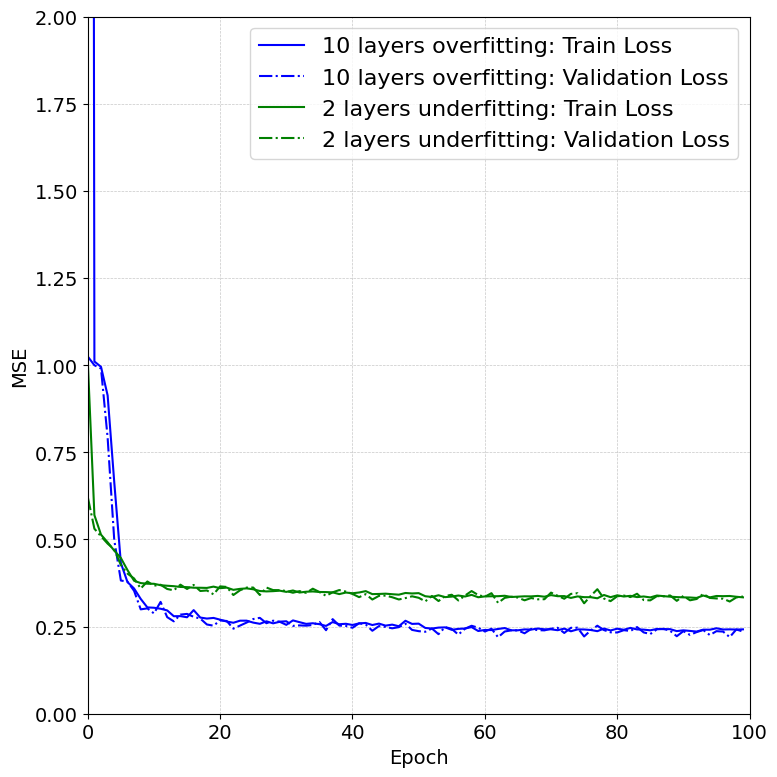

In [ ]:
plot_combined_losses(train_loss_dnn_overfitting*signal_length, val_loss_dnn_overfitting, train_loss_dnn_2layer*signal_length, val_loss_dnn_2layer, wiener_star_loss, title1='10 layers overfitting', title2='2 layers underfitting', y_max=2, smooth=False,  xlim=100)

## Unsupervised training: Noise2Noise

### Small training set

In [ ]:
def train_network_on_noise_noise2noise(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();

            out_train = model(data + get_noise(data, noise_std) );
            target = data + get_noise(data, noise_std)

            loss = criterion(out_train, target)
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

def train_network_on_neighbor2neighbor(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();
            noisy = data + get_noise(data, noise_std)
            # print(noisy.shape)
            mask1, mask2 = generate_mask_pair(noisy)
            noisy_sub1 = generate_subimages(noisy, mask1)
            noisy_sub2 = generate_subimages(noisy, mask2)
            with torch.no_grad():
              noisy_denoised = model(noisy)
            noisy_sub1_denoised = generate_subimages(noisy_denoised, mask1)
            noisy_sub2_denoised = generate_subimages(noisy_denoised, mask2)
            noisy_output = model(noisy_sub1)
            noisy_target = noisy_sub2

            diff = noisy_output - noisy_target
            exp_diff = noisy_sub1_denoised - noisy_sub2_denoised
            loss1 = torch.mean(diff**2)
            loss2 =  torch.mean((diff - exp_diff)**2)
            loss = loss1 + loss2
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
def train_network_on_neighbor2neighbor(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();
            noisy = data + get_noise(data, noise_std)
            # print(noisy.shape)
            mask1, mask2 = generate_mask_pair(noisy)
            noisy_sub1 = generate_subimages(noisy, mask1)
            noisy_sub2 = generate_subimages(noisy, mask2)
            with torch.no_grad():
              noisy_denoised = model(noisy)
            noisy_sub1_denoised = generate_subimages(noisy_denoised, mask1)
            noisy_sub2_denoised = generate_subimages(noisy_denoised, mask2)
            noisy_output = model(noisy_sub1)
            noisy_target = noisy_sub2

            diff = noisy_output - noisy_target
            exp_diff = noisy_sub1_denoised - noisy_sub2_denoised
            loss1 = torch.mean(diff**2)
            loss2 =  torch.mean((diff - exp_diff)**2)
            loss = loss1 + loss2
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_combined_three_losses(train_loss, val_loss, train_loss_dnn, val_loss_dnn, train_loss_dnn2, val_loss_dnn2, save_path='combined_losses.pdf', title1='supervised', title2='noise2noise', title3='neighbor2neighbor', title='Combined Losses', y_max=0.2, smooth=True):
    y_min = 0
    y_max = y_max
    fig, ax = plt.subplots(figsize=(10, 8))  # Adjusted for more data

    if smooth:
        # Apply moving average if smoothing is desired
        train_loss = moving_average(train_loss)
        val_loss = moving_average(val_loss)
        train_loss_dnn = moving_average(train_loss_dnn)
        val_loss_dnn = moving_average(val_loss_dnn)
        train_loss_dnn2 = moving_average(train_loss_dnn2)
        val_loss_dnn2 = moving_average(val_loss_dnn2)

    # Plotting for the first experiment
    ax.plot(train_loss, label=title1 + ': Train Loss', color='blue')
    ax.plot(val_loss, label=title1 + ':Validation Loss', color='blue', linestyle='-.')

    # Plotting for the second experiment
    ax.plot(train_loss_dnn, label=title2 + ': Train Loss', color='green')
    ax.plot(val_loss_dnn, label=title2 + ': Validation Loss', color='green', linestyle='-.')

    # Plotting for the third experiment
    ax.plot(train_loss_dnn2, label=title3 + ': Train Loss', color='orange')
    ax.plot(val_loss_dnn2, label=title3 + ': Validation Loss', color='orange', linestyle='-.')

    ax.set_xlabel('Epoch', fontsize=14)
    ax.set_ylabel('Loss', fontsize=14)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=2)  # Adjusted legend

    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.set_ylim(y_min, y_max)
    ax.set_xlim(0, 100)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()


In [ ]:

prob_val = 0.3
min_sep = 5
signal_length = 100
train_dataset = PieceWiseConstantDataset(n_data = 10, prob = prob_val, n_signal = signal_length, fix_datapoints = True, min_sep = min_sep, use_circular_shift=False, circular_shift_get_item=False)
val_dataset = PieceWiseConstantDataset(n_data = 100, n_signal = signal_length, prob = prob_val, min_sep =min_sep, use_circular_shift=False,circular_shift_get_item=False);
train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=32, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 1,
                       shuffle = False)

In [ ]:
net_nn_lr_final_noise2noise = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3)


train_loss_dnn_final_noise2noise, val_loss_dnn_final_noise2noise = train_network_on_noise_noise2noise(net_nn_lr_final_noise2noise, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  1.0887495040893556 val error:  1.1396605896949767
1 train error:  390.5728759765625 val error:  413.1073883056641
2 train error:  1.250002670288086 val error:  1.3333615559339522
3 train error:  1.0922490119934083 val error:  1.098414768576622
4 train error:  1.1823649406433105 val error:  1.1109854769706726
5 train error:  1.1432888984680176 val error:  1.120037539601326
6 train error:  1.0536348342895507 val error:  1.0963477510213853
7 train error:  1.023768424987793 val error:  1.0411388319730759
8 train error:  1.0392436027526855 val error:  1.0543646317720414
9 train error:  1.0597764015197755 val error:  1.0037112164497375
10 train error:  0.9883260726928711 val error:  1.0025244808197022
11 train error:  0.9909080505371094 val error:  1.0184350460767746
12 train error:  1.019965362548828 val error:  1.0028151160478591
13 train error:  1.0526247024536133 val error:  1.0267908191680908
14 train error:  1.0031748771667481 val error:  0.9846410948038101
15 train err

In [ ]:
net_nn_lr_final_supervised= DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3)


train_loss_dnn_final_supervised, val_loss_dnn_final_supervised = train_network_on_noise(net_nn_lr_final_supervised, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  3.8556251525878906 val error:  3.756946609020233
1 train error:  2.2938888549804686 val error:  2.419719988107681
2 train error:  1.0280051231384277 val error:  1.0543314975500107
3 train error:  0.9546956062316895 val error:  1.0035320681333542
4 train error:  0.9914020538330078 val error:  1.0225300753116608
5 train error:  0.9840972900390625 val error:  1.029273152947426
6 train error:  0.944218921661377 val error:  0.9943673491477967
7 train error:  1.0403642654418945 val error:  1.0152283483743667
8 train error:  0.9146831512451172 val error:  1.0153415220975877
9 train error:  1.002584457397461 val error:  0.9874978750944138
10 train error:  0.9741808891296386 val error:  0.9919625651836396
11 train error:  0.9969677925109863 val error:  1.0164463990926742
12 train error:  0.9915965080261231 val error:  1.0166611826419831
13 train error:  0.9833051681518554 val error:  1.0092651307582856
14 train error:  1.0445622444152831 val error:  0.9808664333820343
15 train e

In [ ]:
def validation_error_psnr(model, dataset_val, noise_std):
    model.eval()
    error_val = 0;
    total_length = 0;
    mean_noisy_psnr = 0;

    criterion = nn.MSELoss(reduction='sum');

    for data in dataset_val:
        out_val = model(data + get_noise(data, noise_std) );
        error_val += criterion(out_val, data).item()
        total_length += data.shape[0];
        # print(data)
        # print(out_val.shape)
        mean_noisy_psnr += compare_psnr(data.data.numpy(), out_val.data.numpy(), data_range=1.)
    print(mean_noisy_psnr/total_length)
    return error_val/total_length

In [ ]:
print(validation_error_psnr(net_nn_lr_final_noise2noise,val_loader,noise_std))
print(validation_error_psnr(net_nn_lr_final_supervised,val_loader,noise_std))

20.233248771924863
0.958631551861763
23.358423002874506
0.4712335446476936


In [ ]:
# net_nn_lr_final = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3)


# train_loss_dnn_final, val_loss_dnn_final = train_network_on_neighbor2neighbor(net_nn_lr_final, train_loader, val_loader,
#                        noise_std=noise_std,
#                        max_epoch = 100,
#                        milestone = 50,
#                       lr = 1e-2)



### Large training set

In [ ]:
# plot_combined_three_losses(train_loss_dnn_final_supervised*signal_length, val_loss_dnn_final_supervised, train_loss_dnn_final_noise2noise*signal_length, val_loss_dnn_final_noise2noise, train_loss_dnn_final*signal_length, val_loss_dnn_final,  y_max=3)

In [ ]:

prob_val = 0.3
min_sep = 5
signal_length = 100
train_dataset = PieceWiseConstantDataset(n_data = 500, prob = prob_val, n_signal = signal_length, fix_datapoints = True, min_sep = min_sep, use_circular_shift=False, circular_shift_get_item=False)
val_dataset = PieceWiseConstantDataset(n_data = 100, n_signal = signal_length, prob = prob_val, min_sep =min_sep, use_circular_shift=False,circular_shift_get_item=False);
train_loader = DataLoader(dataset=train_dataset,
                          num_workers=0,
                          batch_size=32, shuffle=True);

val_loader = DataLoader(dataset = val_dataset,
                       num_workers = 0,
                       batch_size = 1,
                       shuffle = False)

In [ ]:
def train_network_on_noise_noise2noise(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();

            out_train = model(data + get_noise(data, noise_std) );
            target = data + get_noise(data, noise_std)

            loss = criterion(out_train, target)
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
import torch

# def space_to_depth(x, block_size):
#     n, c, h = x.size()
#     unfolded_x = torch.nn.functional.unfold(x, block_size, stride=block_size)
#     return unfolded_x.view(n, c * block_size**2, h // block_size)

def space_to_depth(x, block_size):
    # x is expected to have shape [n, c, l] where l is the length of the sequence
    n, c, l = x.size()

    # Ensure the length is divisible by block_size
    if l % block_size != 0:
        raise ValueError("The length of the sequence must be divisible by the block_size.")

    # Reshape and transpose to interleave the blocks into the depth dimension
    x_reshaped = x.view(n, c, l // block_size, block_size)
    x_transposed = x_reshaped.permute(0, 1, 3, 2)
    return x_transposed.contiguous().view(n, c * block_size, l // block_size)


def generate_subimages(img, mask):
    n, c, h = img.shape
    subimage = torch.zeros(n,
                           c,
                           h // 2,
                           dtype=img.dtype,
                           layout=img.layout,
                           device=img.device)

    # per channel
    for i in range(c):
        img_per_channel = space_to_depth(img[:, i:i + 1, :], block_size=2)
        img_per_channel = img_per_channel.permute(0, 2, 1).reshape(-1)
        subimage[:, i:i + 1, :] = img_per_channel[mask].reshape(n, h // 2, 1).permute(0, 2, 1)

    return subimage


# def get_generator():
#     global operation_seed_counter
#     operation_seed_counter += 1
#     g_cuda_generator = torch.Generator(device="cpu")
#     g_cuda_generator.manual_seed(operation_seed_counter)
#     return g_cuda_generator


def generate_mask_pair(img):
    # prepare masks (N x C x H/2)
    n, c, h = img.shape
    mask1 = torch.zeros(size=(n * h // 2 * 2, ),
                        dtype=torch.bool,
                        device=img.device)
    mask2 = torch.zeros(size=(n * h // 2 * 2, ),
                        dtype=torch.bool,
                        device=img.device)

    # prepare random mask pairs
    idx_pair = torch.tensor(
        [[0, 1], [1, 0]],  # Adjusted for 1D case
        dtype=torch.int64,
        device=img.device)

    rd_idx = torch.zeros(size=(n * h // 2, ),
                         dtype=torch.int64,
                         device=img.device)
    torch.randint(low=0,
                  high=2,  # Adjusted for 1D case
                  size=(n * h // 2, ),
                  out=rd_idx)
    rd_pair_idx = idx_pair[rd_idx]
    rd_pair_idx += torch.arange(start=0,
                                end=n * h // 2 * 2,
                                step=2,  # Adjusted for 1D case
                                dtype=torch.int64,
                                device=img.device).reshape(-1, 1)

    # get masks
    mask1[rd_pair_idx[:, 0]] = 1
    mask2[rd_pair_idx[:, 1]] = 1

    return mask1, mask2

In [ ]:
def train_network_on_noise_noise2noise(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();

            out_train = model(data + get_noise(data, noise_std) );
            target = data + get_noise(data, noise_std)

            loss = criterion(out_train, target)
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
def train_network_on_neighbor2neighbor(model, train_loader, val_loader, noise_std, max_epoch = 50,
                           milestone = 50, lr=0.001):

    optimizer = optim.Adam(model.parameters(), lr=lr);

    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    for epoch in range(max_epoch):

        if epoch > milestone:
            for param_group in optimizer.param_groups:
                param_group["lr"] = lr/100;
        loss_all = 0
        total_length = 0
        for i, data in enumerate(train_loader):
            optimizer.zero_grad();
            model.train();
            noisy = data + get_noise(data, noise_std)
            # print(noisy.shape)
            mask1, mask2 = generate_mask_pair(noisy)
            noisy_sub1 = generate_subimages(noisy, mask1)
            noisy_sub2 = generate_subimages(noisy, mask2)
            with torch.no_grad():
              noisy_denoised = model(noisy)
            noisy_sub1_denoised = generate_subimages(noisy_denoised, mask1)
            noisy_sub2_denoised = generate_subimages(noisy_denoised, mask2)
            noisy_output = model(noisy_sub1)
            noisy_target = noisy_sub2

            diff = noisy_output - noisy_target
            exp_diff = noisy_sub1_denoised - noisy_sub2_denoised
            loss1 = torch.mean(diff**2)
            loss2 =  torch.mean((diff - exp_diff)**2)
            loss = loss1 + loss2
            loss.backward()
            optimizer.step()
            loss_all += loss.item()
            total_length+=1

        train_loss[epoch] = loss_all/total_length
#         train_loss[epoch] = validation_error(model, train_loader, noise_std)
        val_loss[epoch] =  validation_error(model, val_loader, noise_std)

        if epoch % 1 == 0:
            print(epoch, 'train error: ', validation_error(model, train_loader, noise_std),
                                                     'val error: ', validation_error(model, val_loader, noise_std));

    return train_loss, val_loss

In [ ]:
net_nn_lr_final = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3)


train_loss_dnn_final, val_loss_dnn_final = train_network_on_neighbor2neighbor(net_nn_lr_final, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  0.9919185180664063 val error:  1.000565448999405
1 train error:  0.8399851341247558 val error:  0.8610933977365494
2 train error:  0.633153060913086 val error:  0.630532708466053
3 train error:  0.5131239051818848 val error:  0.5222247740626336
4 train error:  0.5032902431488037 val error:  0.5170672142505646
5 train error:  0.5384920883178711 val error:  0.5517635858058929
6 train error:  0.531867696762085 val error:  0.5441462188959122
7 train error:  0.5286197242736816 val error:  0.524964115023613
8 train error:  0.5233002338409424 val error:  0.5185876768827439
9 train error:  0.5099986896514893 val error:  0.5101669648289681
10 train error:  0.5388431930541993 val error:  0.5482518088817596
11 train error:  0.5772216167449952 val error:  0.55555783867836
12 train error:  0.5222039546966553 val error:  0.5117939412593842
13 train error:  0.5126918029785156 val error:  0.4934658095240593
14 train error:  0.4971732978820801 val error:  0.4944490876793861
15 train err

In [ ]:
net_nn_lr_final_noise2noise_large = DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3)


train_loss_dnn_final_noise2noise, val_loss_dnn_final_noise2noise = train_network_on_noise_noise2noise(net_nn_lr_final_noise2noise_large, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  1.002747184753418 val error:  1.0192779260873794
1 train error:  1.0012260704040528 val error:  1.0022526651620864
2 train error:  0.9981418991088867 val error:  0.9878243446350098
3 train error:  1.0021704330444337 val error:  0.9790413838624954
4 train error:  1.0034820137023925 val error:  0.9773321557044983
5 train error:  0.9233608512878418 val error:  0.9280763292312622
6 train error:  0.680497241973877 val error:  0.6713801205158234
7 train error:  0.4261438674926758 val error:  0.4191331671178341
8 train error:  0.37078410816192625 val error:  0.38757389053702357
9 train error:  0.35151033592224123 val error:  0.35495449990034106
10 train error:  0.3518336992263794 val error:  0.3535714852809906
11 train error:  0.33377814388275145 val error:  0.3431465108692646
12 train error:  0.3187175979614258 val error:  0.3173334339261055
13 train error:  0.32657816314697263 val error:  0.31458028450608255
14 train error:  0.32707417774200437 val error:  0.3303410299122333

In [ ]:
net_nn_lr_final_supervised_large= DnCNNskipcon(depth=10, n_channels=64, image_channels=1, use_bnorm=False, kernel_size=3)


train_loss_dnn_final_supervised, val_loss_dnn_final_supervised = train_network_on_noise(net_nn_lr_final_supervised_large, train_loader, val_loader,
                       noise_std=noise_std,
                       max_epoch = 100,
                       milestone = 50,
                      lr = 1e-2)



0 train error:  0.9963070983886719 val error:  0.9975807774066925
1 train error:  1.0046265869140625 val error:  0.9957027572393418
2 train error:  0.8295937690734864 val error:  0.8410069280862809
3 train error:  0.5048185768127441 val error:  0.4956510239839554
4 train error:  0.38018142127990723 val error:  0.38190671890974043
5 train error:  0.35742089939117433 val error:  0.3436534386873245
6 train error:  0.32605604267120364 val error:  0.3208030177652836
7 train error:  0.3353350963592529 val error:  0.3500763289630413
8 train error:  0.31257269191741943 val error:  0.3223503042757511
9 train error:  0.2928451061248779 val error:  0.2846141391992569
10 train error:  0.2881831703186035 val error:  0.2845441445708275
11 train error:  0.26924686908721923 val error:  0.28052565671503543
12 train error:  0.26682335090637205 val error:  0.28145562298595905
13 train error:  0.30575066947937013 val error:  0.3050818920135498
14 train error:  0.2752044105529785 val error:  0.265117782801

In [ ]:
print(validation_error_psnr(net_nn_lr_final_noise2noise_large,val_loader,noise_std))
print(validation_error_psnr(net_nn_lr_final_supervised_large,val_loader,noise_std))

26.361963600349235
0.24450370132923127
26.765686922023182
0.22447417557239532


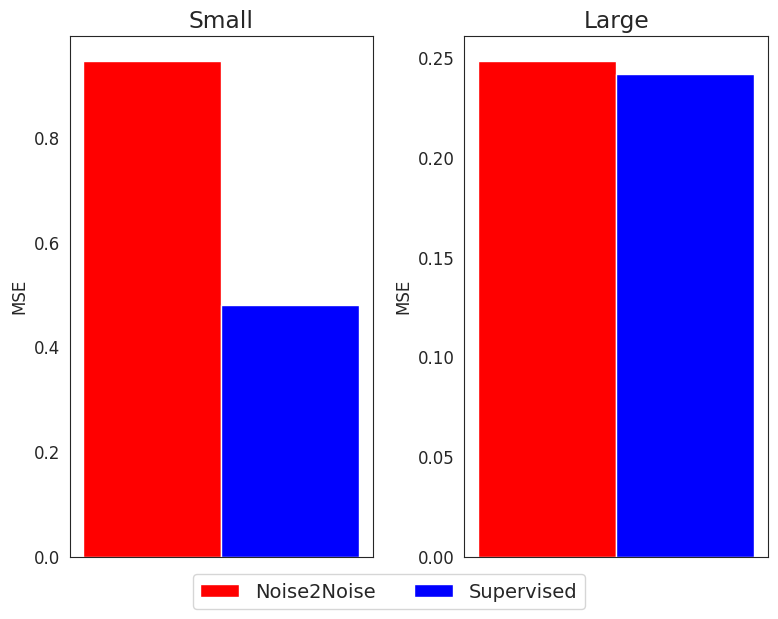

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Colors and fine-tuning sets as specified
category_colors = {
    'Noise2Noise': 'red',
    'Supervised': 'blue'
}

ft_sets = {
    'Small': [('Noise2Noise', 0.9462258213758469), ('Supervised', 0.4796674281358719)],
    'Large': [('Noise2Noise', 0.2483864478766918), ('Supervised', 0.241942210868001)],
}

# Further adjustments based on the new requirements:
# - Make bars much narrower
# - Place a shared legend at the bottom of the plots

# Adjust plot size
fig, axs = plt.subplots(1, 2, figsize=(8, 6))  # Width remains decreased

# Adjust the bar width to be much narrower
bar_width = 0.1

# Increase font size
plt.rcParams.update({'font.size': 14})

legend_labels = {}

# Plot each Fine-Tuning Set
for ax, (ft_set, data_tuples) in zip(axs, ft_sets.items()):
    for j, (data_type, size) in enumerate(data_tuples):
        position = j * bar_width
        ax.bar(position, size, width=bar_width, color=category_colors[data_type], label=data_type if data_type not in legend_labels else "")
        legend_labels[data_type] = category_colors[data_type]

    # Adjust the axes and labels
    ax.set_xticks(np.arange(len(data_tuples)) * bar_width)
    ax.set_xticklabels([])
    ax.set_ylabel('MSE')
    ax.set_title(f'{ft_set}')

# Adjust subplot layout
plt.tight_layout()

# Add a shared legend at the bottom of the plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=len(legend_labels), bbox_to_anchor=(0.5, -0.05))
plt.savefig("unsupervised_training_set_comparison_plot.png", dpi=300, bbox_inches='tight')
plt.show()



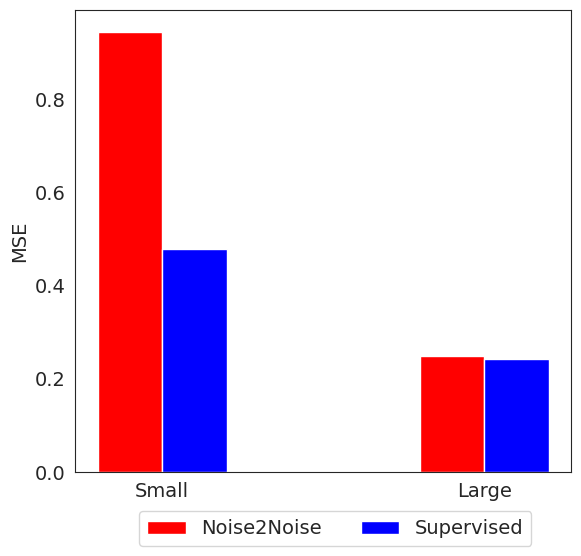

In [ ]:
# Adjusting the plot to show 'Large' and 'Small' on the x-axis and use category colors as legend

# Colors and fine-tuning sets as specified
category_colors = {
    'Noise2Noise': 'red',
    'Supervised': 'blue'
}

ft_sets = {
    'Small': [('Noise2Noise', 0.9462258213758469), ('Supervised', 0.4796674281358719)],
    'Large': [('Noise2Noise', 0.2483864478766918), ('Supervised', 0.241942210868001)],
}


fig, ax = plt.subplots(figsize=(8, 6))

# Adjust the bar width and offset
bar_width = 0.2
offset = bar_width * len(category_colors)

# Track labels for the legend
legend_labels = {}

# Plot each Fine-Tuning Set
for i, (ft_set, data_tuples) in enumerate(ft_sets.items()):
    bottom = 0
    for j, (data_type, size) in enumerate(data_tuples):
        position = i - offset / 2 + j * bar_width
        ax.bar(position, size, width=bar_width, color=category_colors[data_type], label=data_type if data_type not in legend_labels else "")
        legend_labels[data_type] = category_colors[data_type]

# Adjust the axes and labels
ax.set_xticks(np.arange(len(ft_sets)) - offset / 2 + bar_width * (len(category_colors) - 1) / 2)
ax.set_xticklabels(ft_sets.keys())
ax.set_ylabel('MSE')
# ax.set_title('Composition of Fine-Tuning Sets')

# Add the legend
# ax.legend()
# Adjust the plot area and set the legend outside
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height]) # Resize plot to make space for legend
fig.legend(handles, labels, loc='lower center', ncol=len(legend_labels), bbox_to_anchor=(0.45, -0.03))
plt.savefig("unsupervised_training_set_comparison_plot.png", dpi=300, bbox_inches='tight')
# Show the plot
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_combined_three_losses(train_loss, val_loss, train_loss_dnn, val_loss_dnn, train_loss_dnn2, val_loss_dnn2, save_path='combined_losses.pdf', title1='supervised', title2='noise2noise', title3='neighbor2neighbor', title='Combined Losses', y_max=0.2, smooth=True):
    y_min = 0
    y_max = y_max
    fig, ax = plt.subplots(figsize=(10, 8))  # Adjusted for more data

    if smooth:
        # Apply moving average if smoothing is desired
        train_loss = moving_average(train_loss)
        val_loss = moving_average(val_loss)
        train_loss_dnn = moving_average(train_loss_dnn)
        val_loss_dnn = moving_average(val_loss_dnn)
        train_loss_dnn2 = moving_average(train_loss_dnn2)
        val_loss_dnn2 = moving_average(val_loss_dnn2)

    # Plotting for the first experiment
    ax.plot(train_loss, label=title1 + ': Train Loss', color='blue')
    ax.plot(val_loss, label=title1 + ':Validation Loss', color='blue', linestyle='-.')

    # Plotting for the second experiment
    ax.plot(train_loss_dnn, label=title2 + ': Train Loss', color='green')
    ax.plot(val_loss_dnn, label=title2 + ': Validation Loss', color='green', linestyle='-.')

    # Plotting for the third experiment
    ax.plot(train_loss_dnn2, label=title3 + ': Train Loss', color='orange')
    ax.plot(val_loss_dnn2, label=title3 + ': Validation Loss', color='orange', linestyle='-.')

    ax.set_xlabel('Epoch', fontsize=14)
    ax.set_ylabel('Loss', fontsize=14)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=2)  # Adjusted legend

    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax.set_ylim(y_min, y_max)
    ax.set_xlim(0, 100)

    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()


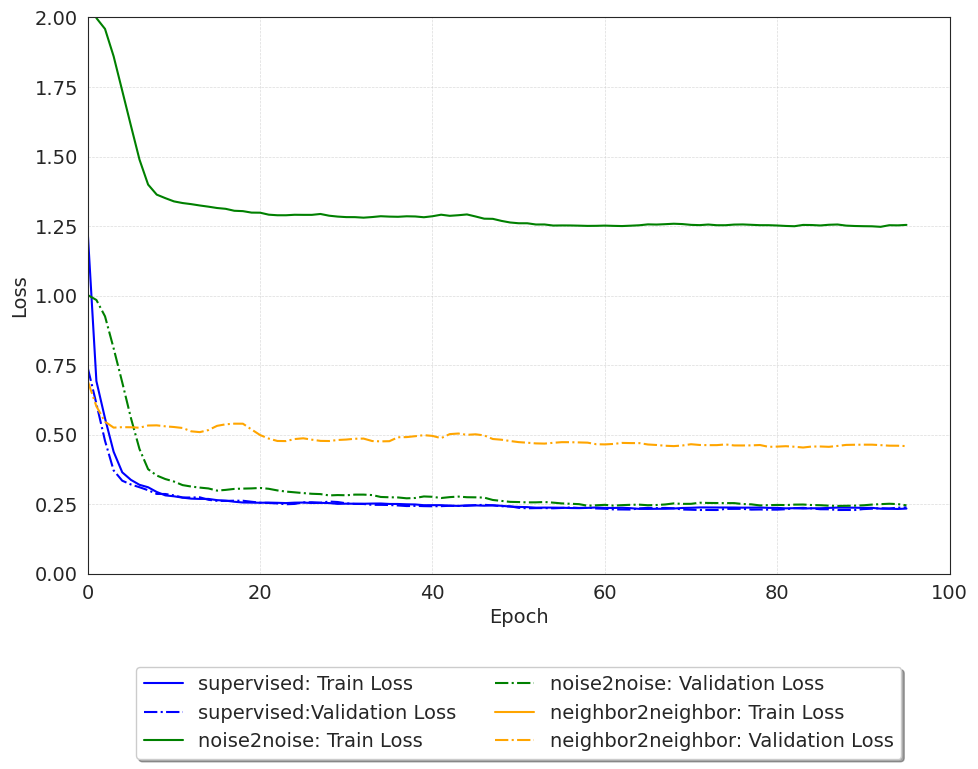

In [ ]:
plot_combined_three_losses(train_loss_dnn_final_supervised*signal_length, val_loss_dnn_final_supervised, train_loss_dnn_final_noise2noise*signal_length, val_loss_dnn_final_noise2noise, train_loss_dnn_final*signal_length, val_loss_dnn_final,  y_max=2)

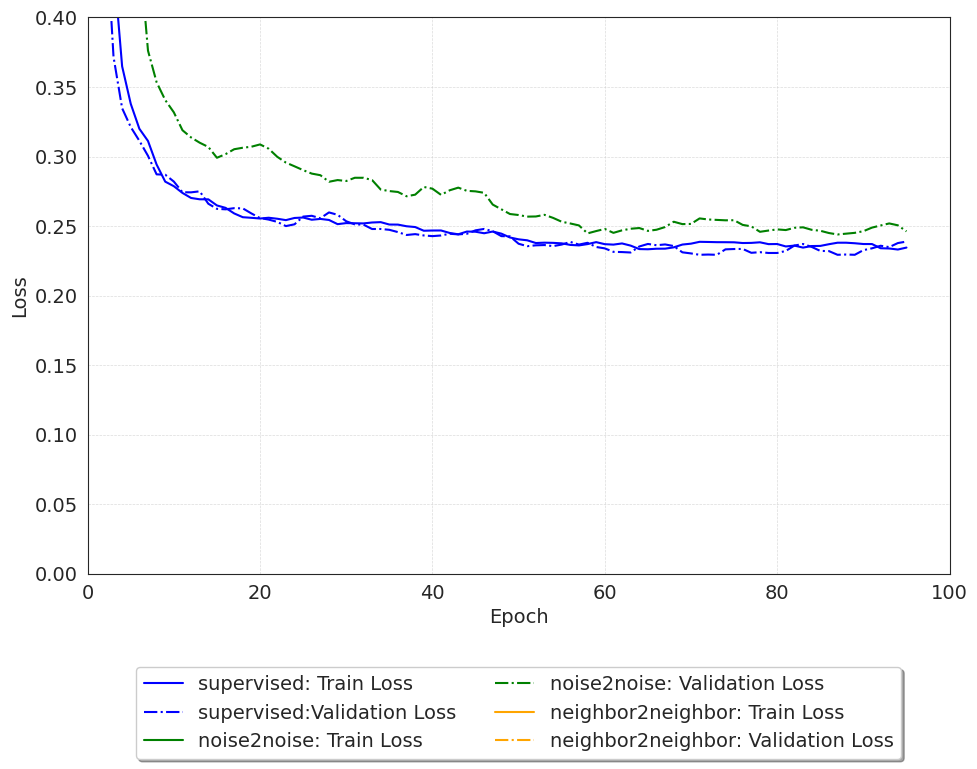

In [ ]:
plot_combined_three_losses(train_loss_dnn_final_supervised*signal_length, val_loss_dnn_final_supervised, train_loss_dnn_final_noise2noise*signal_length, val_loss_dnn_final_noise2noise, train_loss_dnn_final*signal_length, val_loss_dnn_final,  y_max=0.4)

## Visualization comparision: DNN supervised vs unsupervised

In [ ]:
def validation_error(model, dataset_val, noise_std):
    model.eval()
    error_val = 0;
    total_length = 0;
    mean_noisy_psnr = 0;

    criterion = nn.MSELoss(reduction='sum');

    for data in dataset_val:
        out_val = model(data + get_noise(data, noise_std) );
        error_val += criterion(out_val, data).item()
        total_length += data.shape[0];
        # print(data)
        # print(out_val.shape)
        mean_noisy_psnr += compare_psnr(data.data.numpy(), out_val.data.numpy(), data_range=1.)
    print(mean_noisy_psnr/total_length)
    return error_val/total_length

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from scipy.fftpack import fft, ifft, fftshift

import matplotlib.pyplot as plt

# plt.rcParams['axes.titlesize'] = 16

# ... (rest of your code)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 18  # Adjust based on your needs
plt.rcParams['axes.titlesize'] = 30  # Title font size
plt.rcParams['axes.labelsize'] = 25  # Label font size
plt.rcParams['xtick.labelsize'] = 20  # Tick label font size
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['lines.linewidth'] = 2  # Line width



def save_image(img, filename, cmap='gray'):
    fig = plt.figure(frameon=False)
    ax = plt.Axes(fig, [0., 0., 1., 1.], )
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img, aspect='equal', cmap=cmap)
    fig.savefig(filename, dpi=300)
    plt.close(fig)

def compare_all_three(source, noise_std, wiener_star, unet, unet1, unet2, figsize=(35, 20), fft_sample=100, noise_scale=50, output_directory='output_constant_fig1', tick_font_size=25):
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    # Add noise, denoise, and prepare data
    noisy = source + get_noise(source, mode='G', noise_std=noise_std, noise_scale=noise_scale)
    source_numpy = source.cpu().detach().numpy()
    unet_denoised = unet(noisy.to(device))
    denoised2 = unet1(noisy.to(device))
    denoised3 = unet2(noisy.to(device))
    source_torch = source.clone()
    source = np.squeeze(source.numpy())
    noisy = np.squeeze(noisy.numpy())

    # Perform FFT and IFFT
    source_fft = fftshift(fft(source, n=fft_sample))
    noisy_fft = fftshift(fft(noisy, n=fft_sample))
    denoised_fft = noisy_fft * wiener_star
    source_ifft = np.real(ifft(fftshift(source_fft), n=fft_sample))
    noisy_ifft = np.real(ifft(fftshift(noisy_fft), n=fft_sample))
    denoised_ifft = np.real(ifft(fftshift(denoised_fft), n=fft_sample))

    # Calculate PSNR values
    psnr_noisy = round(compare_psnr(source_ifft, noisy_ifft, data_range=1.), 2)
    psnr_denoised = round(compare_psnr(source_ifft, denoised_ifft, data_range=1.), 2)
    psnr_unet = round(batch_PSNR(unet_denoised, source_torch, 1.), 2)
    psnr_denoised2 = round(batch_PSNR(denoised2, source_torch, 1.), 2)
    psnr_denoised3 = round(batch_PSNR(denoised3, source_torch, 1.), 2)

    plots = [
        source_ifft,
        noisy_ifft,
        denoised_ifft,
        tensor_to_signal_1D(unet_denoised[0]),
        tensor_to_signal_1D(denoised2[0]),
        tensor_to_signal_1D(denoised3[0])
    ]
    titles = [
        "Source",
        f"Noisy Image: PSNR {psnr_noisy}",
        f"Wiener Denoised: PSNR {psnr_denoised}",
        f"Neighbor2neighbor Denoised: PSNR {psnr_unet}",
        f"Noise2noise Denoised: PSNR {psnr_denoised2}",
        f"Supervised Denoised: PSNR {psnr_denoised3}"
    ]

    y_min, y_max = 0, 1.2
    aspect_ratio = 100  # Numerical value or 'auto'

    # Plot and save the results individually
    for i, (plot, title) in enumerate(zip(plots, titles)):
        fig, ax = plt.subplots(figsize=figsize)
        ax.plot(plot)
        # ax.set_title(title, fontsize=tick_font_size)
        ax.tick_params(axis='both', which='major', labelsize=tick_font_size)
        ax.minorticks_on()
        ax.grid(False)
        ax.set_ylim(y_min, y_max)
        ax.set_aspect(aspect_ratio)

        # if i == 0:
        #     ax.set_ylabel('Signal Amplitude', fontsize=tick_font_size)
        ax.axis('off')
        plt.tight_layout()
        fig.savefig(os.path.join(output_directory, f'{title.replace(" ", "_").replace(":", "_")}.png'), bbox_inches='tight', dpi=300)
        plt.show()
        plt.close(fig)

# Add the definitions of get_noise, batch_PSNR, compare_psnr, tensor_to_signal_1D and any other necessary functions.


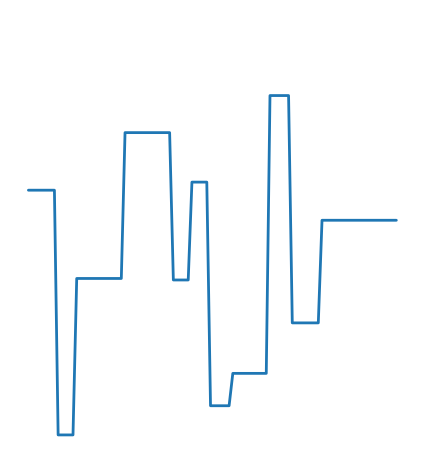

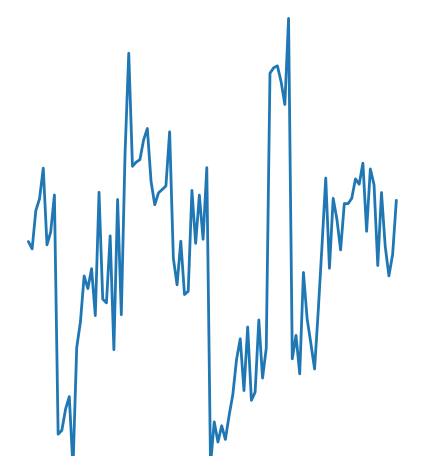

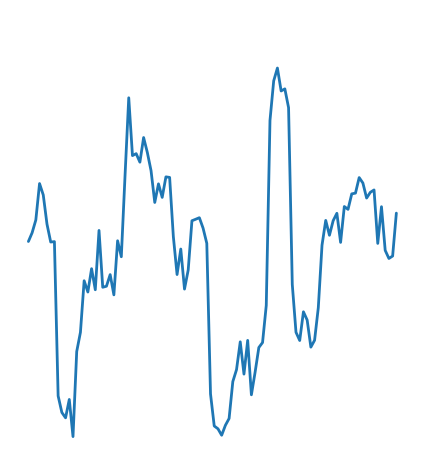

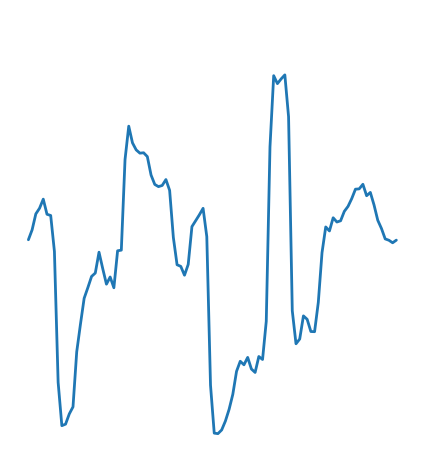

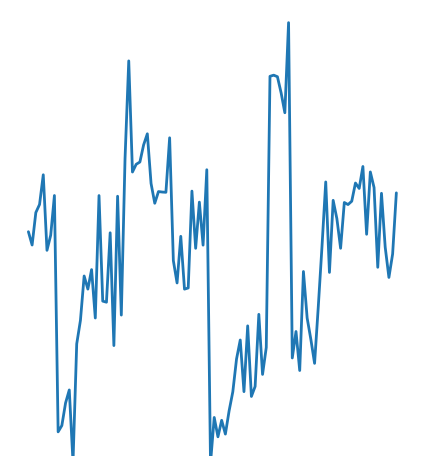

...

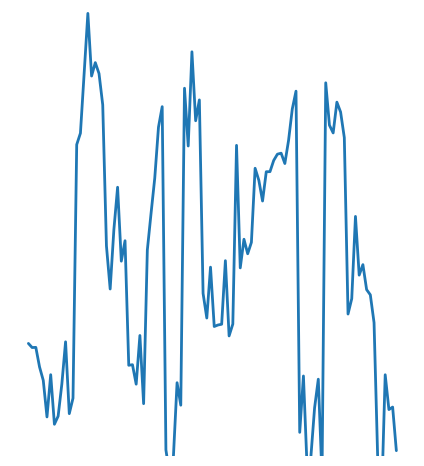

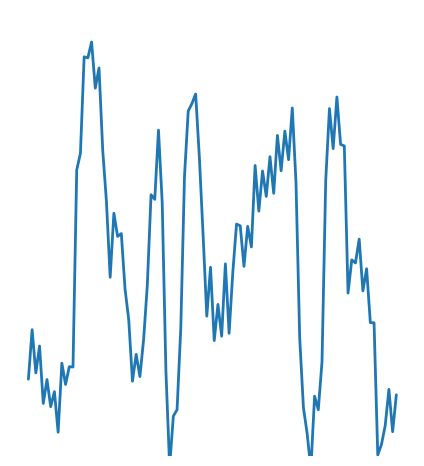

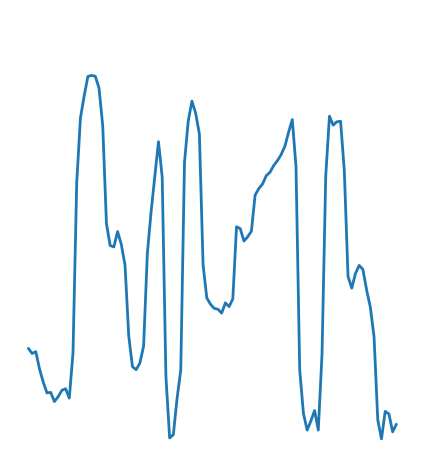

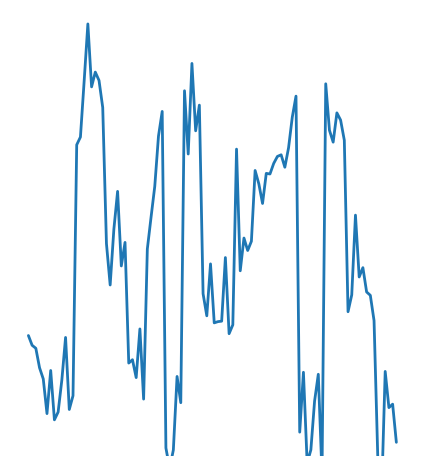

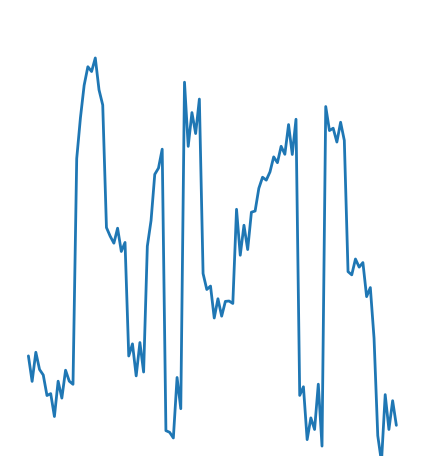

In [ ]:
output_directory_root = 'output_constant_fig1'

count = 0
for b_idx, data in enumerate(test_loader):
    for idx in range(1):
        image_tensor = data[idx].unsqueeze(0)
        compare_all_three(image_tensor,noise_std, wiener_star, net_nn_lr_final,net_nn_lr_final_noise2noise, net_nn_lr_final_supervised,  figsize=(8, 5), fft_sample = 100,noise_scale=noise_scale, output_directory = os.path.join(output_directory_root, str(b_idx)))
        count += 1
    if count > 1:
        break

In [ ]:
def validation_error(model, dataset_val, noise_std):
    model.eval()
    error_val = 0;
    total_length = 0;
    mean_noisy_psnr = 0;

    criterion = nn.MSELoss(reduction='sum');

    for data in dataset_val:
        out_val = model(data + get_noise(data, noise_std) );
        error_val += criterion(out_val, data).item()
        total_length += data.shape[0];
        # print(data)
        # print(out_val.shape)
        mean_noisy_psnr += compare_psnr(data.data.numpy(), out_val.data.numpy(), data_range=1.)
    print(mean_noisy_psnr/total_length)
    return error_val/total_length

In [ ]:
validation_error(net_nn_lr_final_supervised,test_loader,noise_std)

23.254586915340656


0.48403124392032626

In [ ]:
validation_error(net_nn_lr_final_noise2noise,test_loader,noise_std)

20.27588206673159


0.9465981781482696

In [ ]:
def plot_1d_log_fft(signal, ax=None, ax_off=True, title_string=None):
    fft_shifted = np.fft.fftshift(np.fft.fft(signal))
    mat = np.log10(np.abs(fft_shifted) + 1e-9)

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 5))

    if ax_off:
        ax.axis('off')

    ax.plot(mat)
    ax.set_xlabel('Frequency')
#     ax.set_ylabel('Amplitude (Log Scale)')

    if title_string is not None:
        ax.set_title(title_string)

    return mat


# One layer Linear Network without the nolinear activation function

Here we show that one layer CNN without nonlinear layers can not outperform Wiener filter. This was put into a wavelet framework and optimized over a dataset to minimize the mean squared error. Please look into the the folder `multiscale_py` for details on implementation

### Training

In [ ]:
import os
import pickle

In [ ]:
def validation_error_psnr(model, dataset_val, add_noise = False, noise_mode = 'G', noise_std=0.1, max_noise = 5e-1, noise_scale=50):
    model.eval()
    error_val = 0;
    psnr_val = 0;
    total_length = 0;

    criterion = nn.MSELoss(reduction = 'sum');

    for data in dataset_val:
        data = data[0]
#         print(data.shape)
#         data = data['image']
#         data = data.resize((256,256))
        target = data.clone()

        if add_noise:

            data = data + get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

        data = data.to(device)
        target = target.to(device)
        out_val = model( data );

        error_val += criterion(out_val, target).item()
        psnr_val += ( batch_PSNR(out_val, target, 1.0) * data.shape[0] )
        total_length += data.shape[0];

    return error_val/total_length, psnr_val/total_length

In [ ]:
def train_network_on_noise(model, train_loader, val_loader,
                            add_noise = False, noise_mode = 'G', max_noise = 5e-1, noise_std = 0.1,
                            max_epoch = 50,  milestone = 50, lr=0.001, plot_loss = True, verbose = False,
                            verbose_freq = 100, early_stopping = True, noise_scale=50):
    model = model.to(device)

    optimizer = optim.Adam( filter(lambda p: p.requires_grad, model.parameters()) , lr=lr);
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience = 5, factor = 0.5)
    criterion = nn.MSELoss()

    train_loss = np.zeros(max_epoch);
    val_loss = np.zeros(max_epoch);

    train_psnr = np.zeros(max_epoch);
    val_psnr = np.zeros(max_epoch);

    best_model = None;
    best_val_loss = np.inf;

    for epoch in range(max_epoch):

#         if epoch > milestone:
#             for param_group in optimizer.param_groups:
#                 param_group["lr"] = lr/10;

        for i, data in enumerate(train_loader):
            data = data.squeeze()
            optimizer.zero_grad();
            model.train();
#             data = data['image']
            target = data.clone();

            if add_noise:
#                 data = Poisson(data).sample()
                data = data + get_noise(data, mode = noise_mode,noise_std=noise_std, max_noise = max_noise, noise_scale=noise_scale)

            data = data.to(device)
            target = target.to(device)

            out_train = model(data);
            loss = criterion(out_train, target);
            loss.backward()
            optimizer.step()

        train_loss[epoch], train_psnr[epoch] = validation_error_psnr(model, train_loader,
                                                                add_noise = add_noise);
        val_loss[epoch], val_psnr[epoch] = validation_error_psnr(model, val_loader,
                                                            add_noise = add_noise);
        scheduler.step(val_psnr[epoch])

        if (epoch+1) % verbose_freq == 0 and verbose:
            print(epoch+1, 'train error: ', train_loss[epoch],
                             'val error: ', val_loss[epoch],
                              'train psnr: ', train_psnr[epoch],
                             'val psnr: ', val_psnr[epoch]);

        if val_loss[epoch] < best_val_loss:
            best_model = model.state_dict();
            best_val_loss = val_loss[epoch]

    if early_stopping:
        model.load_state_dict(best_model)

    if plot_loss:
        plt.semilogy(np.arange(1, max_epoch+1), train_loss, label = 'train loss');
        plt.semilogy(np.arange(1, max_epoch+1), val_loss, label = 'val loss')
        plt.legend()
        plt.show()

        plt.plot(np.arange(1, max_epoch+1), train_psnr, label = 'train psnr');
        plt.plot(np.arange(1, max_epoch+1), val_psnr, label = 'val psnr')
        plt.legend()
        plt.show()

    return model, train_psnr, val_psnr, train_loss, val_loss

In [ ]:
kernel_size_list = [3,5,7,9];
onelayer_net_dict = {};

Training..
3
1
5 train error:  0.6238248124718666 val error:  0.641934986114502 train psnr:  22.126051013883636 val psnr:  21.984832433564616
10 train error:  0.6219663433730602 val error:  0.6315235182642936 train psnr:  22.074611995522766 val psnr:  22.063075634741054
15 train error:  0.6176965329796076 val error:  0.6469493648409843 train psnr:  22.1337659919702 val psnr:  21.951098879123087
20 train error:  0.6325092632323503 val error:  0.63760213047266 train psnr:  22.06713212910524 val psnr:  22.02941242017958
25 train error:  0.6122803241014481 val error:  0.6417909485101699 train psnr:  22.180127269902506 val psnr:  21.978231987021978
30 train error:  0.6628767047077417 val error:  0.6339228266477585 train psnr:  21.868611356603743 val psnr:  22.037191548685417
35 train error:  0.6736188791692257 val error:  0.6256476569175721 train psnr:  21.750131526467293 val psnr:  22.10431972477735
40 train error:  0.6652481686323881 val error:  0.6372762316465378 train psnr:  21.81473751

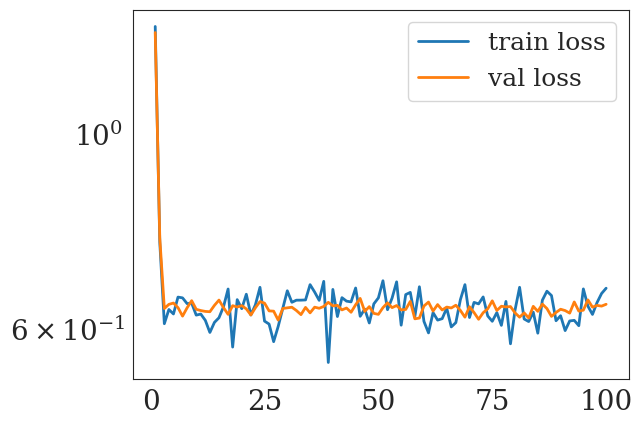

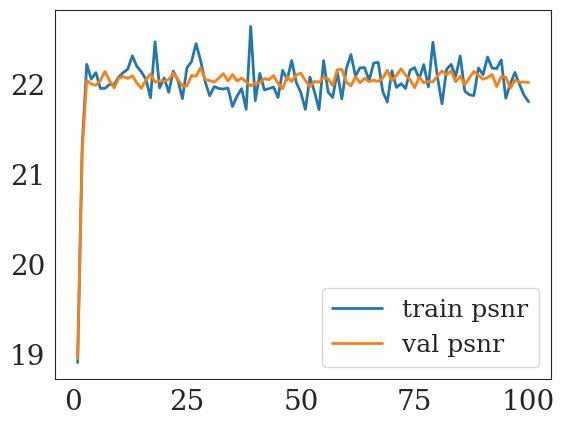

5
2
5 train error:  0.6310075670480728 val error:  0.7025892466306687 train psnr:  22.083277771116673 val psnr:  21.633901470918275
10 train error:  0.6274537835270166 val error:  0.6141617646813393 train psnr:  22.124627260265267 val psnr:  22.17375120280773
15 train error:  0.5961304157972336 val error:  0.6280565690994263 train psnr:  22.325184743396907 val psnr:  22.07583887971962
20 train error:  0.6431593894958496 val error:  0.6221068370342254 train psnr:  21.955494886445603 val psnr:  22.129419904226125
25 train error:  0.6725031230598688 val error:  0.6243344378471375 train psnr:  21.772625838462996 val psnr:  22.11321646250522
30 train error:  0.6139421667903662 val error:  0.629580557346344 train psnr:  22.205278991992877 val psnr:  22.078469090291065
35 train error:  0.6634001415222883 val error:  0.621297471523285 train psnr:  21.861818364584433 val psnr:  22.133494348161776
40 train error:  0.6706473641097546 val error:  0.6194758430123329 train psnr:  21.759886491775244 

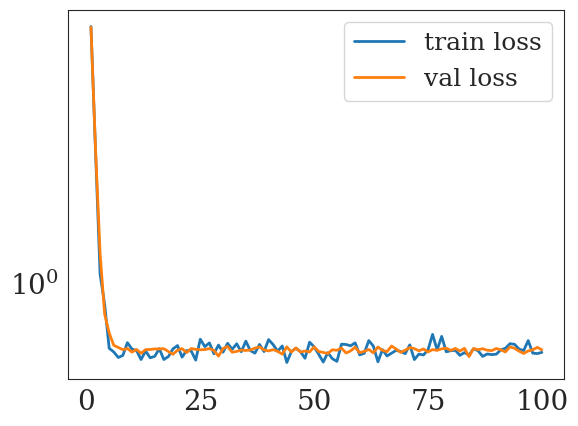

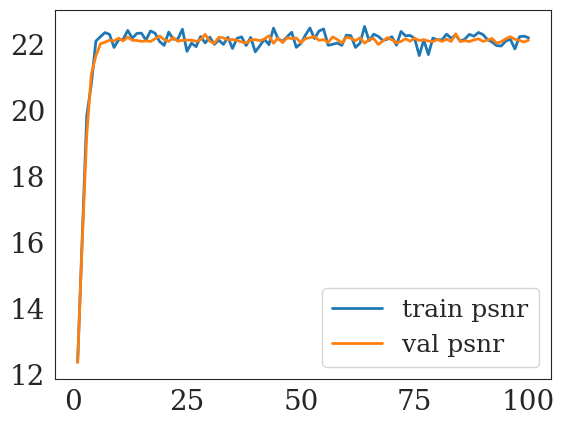

7
3
5 train error:  0.5948123801499605 val error:  0.6183343702554702 train psnr:  22.343808948872695 val psnr:  22.144693638497674
10 train error:  0.6161934249103069 val error:  0.6229797360301018 train psnr:  22.192506154130538 val psnr:  22.14045074177558
15 train error:  0.689485589042306 val error:  0.620183535516262 train psnr:  21.665816363723284 val psnr:  22.14088655062905
20 train error:  0.6405922472476959 val error:  0.6282527220249176 train psnr:  22.071810699743065 val psnr:  22.090162464565097
25 train error:  0.58958899974823 val error:  0.6380927431583404 train psnr:  22.357117374410684 val psnr:  22.00964908925693
30 train error:  0.644516859203577 val error:  0.602449984550476 train psnr:  21.955825572181606 val psnr:  22.27555349782398
35 train error:  0.6630514301359653 val error:  0.626228609085083 train psnr:  21.82085347871615 val psnr:  22.11009454035767
40 train error:  0.6193335354328156 val error:  0.6415086442232132 train psnr:  22.215872797654168 val psnr

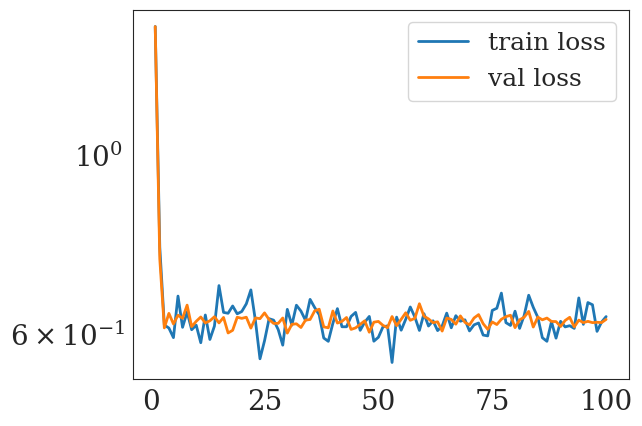

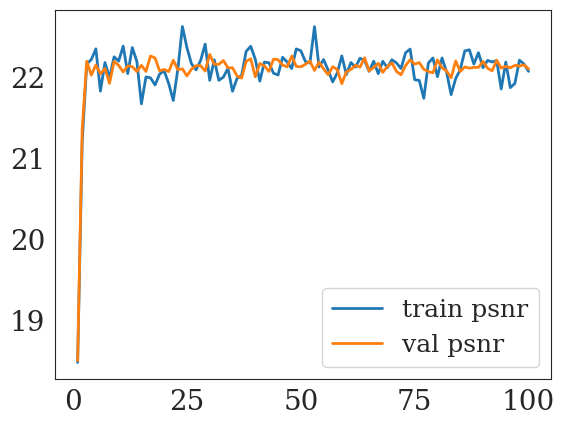

9
4
5 train error:  0.6707551963627338 val error:  0.6574147474765778 train psnr:  21.793181929962312 val psnr:  21.882480960803363
10 train error:  0.6120723653584719 val error:  0.6251988297700882 train psnr:  22.19444119396852 val psnr:  22.106700219967106
15 train error:  0.587012005969882 val error:  0.6265095520019531 train psnr:  22.357180098978013 val psnr:  22.10974978449817
20 train error:  0.6111355368047953 val error:  0.6346785020828247 train psnr:  22.18062875904396 val psnr:  22.037947776604213
25 train error:  0.6250104885548353 val error:  0.6101490598917008 train psnr:  22.082194060764344 val psnr:  22.21648077166651
30 train error:  0.6661175414919853 val error:  0.6250418809056282 train psnr:  21.824084767555632 val psnr:  22.11207432490625
35 train error:  0.5892870649695396 val error:  0.6185221537947655 train psnr:  22.342095179274484 val psnr:  22.150289365402035
40 train error:  0.5684393215924501 val error:  0.6252127942442894 train psnr:  22.503077066287876 v

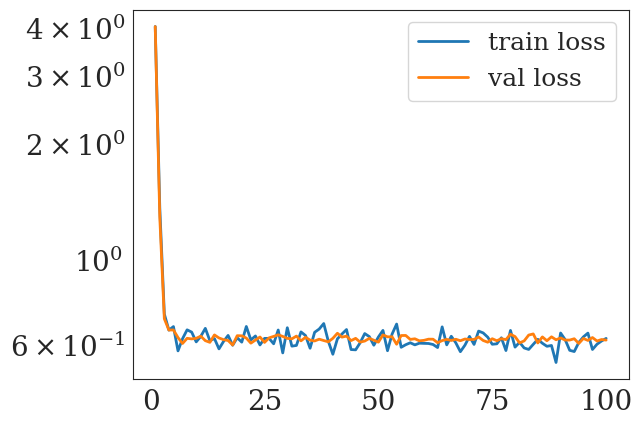

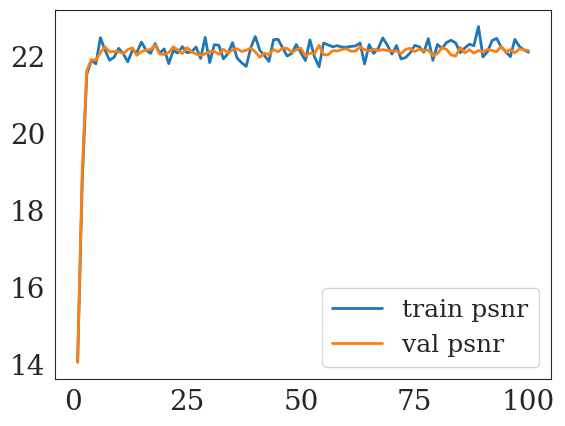

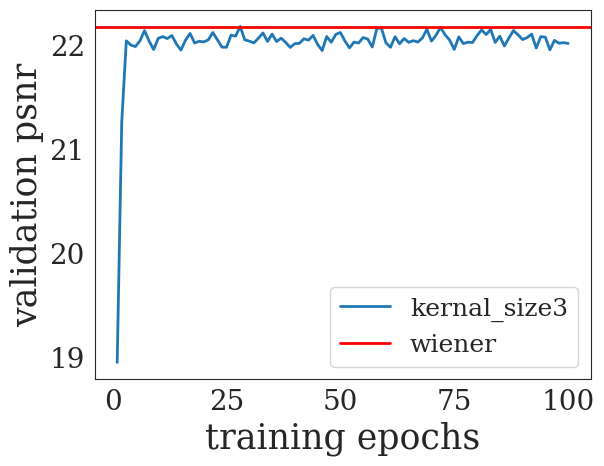

In [ ]:
validation_dict = {}
# noise_std_array = [float(10)/255];

# for noise_std in noise_std_array:
# validation_dict[noise_std] ={}
# print('='*50)
# print('noise std: ', noise_std);

string_noise_scale = str(int(noise_scale))

net_dict_filename = 'onelayerln7_'+string_noise_scale+'.pth';

# if os.path.exists(os.path.join(path_to_saved_models, net_dict_filename)):
#     net_dict = pickle.load( open( os.path.join(path_to_saved_models, net_dict_filename), "rb" ) )
#     onelayer_net_dict[noise_scale] = net_dict
#     print('load pretained')

# else:


net_dict = {}
print('Training..')
for kernel_size in kernel_size_list:
    print(kernel_size)
    net_temp = LinearCNN1D(kernel_size=kernel_size).to(device);

    net_temp, train_psnr_tmpt, val_psnr_tmpt, train_loss_tempt, val_loss_tempt = train_network_on_noise(net_temp, train_loader, val_loader,
                            add_noise = True,
                            noise_mode = 'G',
                            max_epoch = 100,
                            milestone = 100,
                            lr = 1e-1,
                            verbose = True,
                            verbose_freq = 5,
                            plot_loss = True)
#             visualize_filters(net_temp)
    validation_dict[kernel_size] = val_psnr_tmpt
    plt.show()
    print('='*50)
    net_dict[kernel_size] = net_temp;
    pickle.dump(net_dict, open( os.path.join(path_to_saved_models, net_dict_filename), "wb" ) )
onelayer_net_dict[noise_scale] = net_dict
#     kernal_size = 3
max_epoch=30
# for noise_std in noise_std_array:
validation_dict[kernel_size]
#     plt.plot(np.arange(1, max_epoch+1), train_psnr, label = 'train psnr');
plt.plot(np.arange(1, 100+1), validation_dict[kernel_size_list[0]], label = 'kernal_size' + str(kernel_size_list[0]))
#     plt.plot(np.arange(1, max_epoch+1), validation_dict[noise_std][kernel_size_list[1]], label = 'kernal_size' + str(kernel_size_list[1]))
#     plt.plot(np.arange(1, max_epoch+1), validation_dict[noise_std][kernel_size_list[2]], label = 'kernal_size' + str(kernel_size_list[2]))
plt.axhline(y=wiener_star_psnr, color="red", linestyle="-", label = 'wiener')
plt.xlabel('training epochs')
plt.ylabel('validation psnr')
#     plt.title('noise level ' + str(noise_std))
plt.legend()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

def plot_losses(train_loss, val_loss, wiener_star_loss):
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot train and validation losses
    ax.plot(train_loss, label='Train Loss', color='blue')
    ax.plot(val_loss, label='Validation Loss', color='green')

    # Plot the constant wiener_star_loss value
    ax.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')

    # Set titles and labels
    ax.set_title('Loss Curves', fontsize=16)
    ax.set_xlabel('Epoch', fontsize=14)
    ax.set_ylabel('Loss', fontsize=14)

    # Display a legend
    ax.legend()

    # Make the plot grid less pronounced
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    # Ensure a tight layout
    plt.tight_layout()

    # Show the plot
    plt.show()

In [ ]:
import matplotlib.pyplot as plt

def plot_side_by_side_losses(train_loss, val_loss, train_loss_dnn, val_loss_dnn, wiener_star_loss, save_path='side_by_side_losses.pdf'):


    y_min = 0  # Replace with your desired minimum value
    y_max = 1  # Replace with your desired maximum value
    # Create a figure with two side-by-side subplots that share the y-axis
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(14, 6), sharey=True)

    # Plotting for the first experiment on the first subplot
    ax1.plot(train_loss, label='Train Loss', color='blue')
    ax1.plot(val_loss, label='Validation Loss', color='green')
    ax1.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')
    ax1.set_title('Linear Net Loss Curves', fontsize=16)
    ax1.set_xlabel('Epoch', fontsize=14)
    ax1.set_ylabel('Loss', fontsize=14)
    ax1.legend()
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax1.set_ylim(y_min, y_max)

    # Plotting for the DNN experiment on the second subplot
    ax2.plot(train_loss_dnn, label='Train Loss (DNN)', color='blue', linestyle='-.')
    ax2.plot(val_loss_dnn, label='Validation Loss (DNN)', color='green', linestyle='-.')
    ax2.axhline(y=wiener_star_loss, color='red', linestyle='--', label='Wiener Star Loss')
    ax2.set_title('DNN Loss Curves', fontsize=16)
    ax2.set_xlabel('Epoch', fontsize=14)
    ax2.legend()
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    ax2.set_ylim(y_min, y_max)

    # Ensure a tight layout and save
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

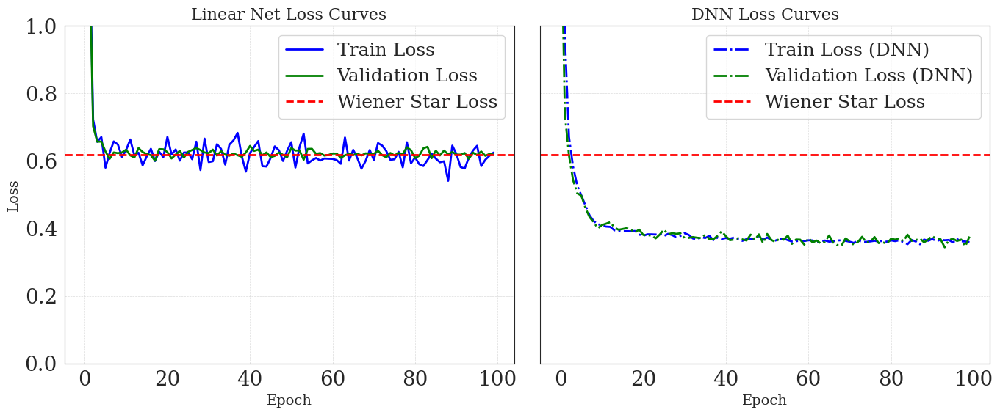

In [ ]:
plot_side_by_side_losses(train_loss_tempt, val_loss_tempt, train_loss_dnn*signal_length, val_loss_dnn, wiener_star_loss)

### Val MSE and PNR for different kernel size

In [ ]:
best_kernel_size = {};
# kernel_size_list = [3]
# for noise_std in noise_std_array:

# print('noise std: ', noise_std)
best_kernel_psnr = 0;
best_kernel = 0;
for kernel_size in kernel_size_list:
    val_loss, val_psnr= validation_error_psnr(net_dict[kernel_size], val_loader,
                                                            add_noise = True);
    print('Kernel Size: ', kernel_size, 'Val MSE: ', val_loss, 'Val PSNR: ', val_psnr)
#         visualize_filters(net_dict[kernel_size])
    plt.show()
    if val_psnr > best_kernel_psnr:
        best_kernel_psnr = val_psnr;
        best_kernel = kernel_size;

best_kernel_size = best_kernel;
print('='*50 + '\n\n')

Kernel Size:  3 Val MSE:  0.6266100183129311 Val PSNR:  22.08817127123179
Kernel Size:  5 Val MSE:  0.6313464364409447 Val PSNR:  22.070205315401736
Kernel Size:  7 Val MSE:  0.6068525359034538 Val PSNR:  22.251228681819384
Kernel Size:  9 Val MSE:  0.6350482541322708 Val PSNR:  22.049047803999887




In [ ]:
net_dict[best_kernel].conv1.weight

Parameter containing:
tensor([[[0.0063, 0.0346, 0.1452, 0.6194, 0.1457, 0.0339, 0.0059]]],
       requires_grad=True)

In [ ]:
net_dict[best_kernel].conv1.bias

Parameter containing:
tensor([0.0070], requires_grad=True)

# More Visualization

## Compare of one layer linear network and deep neural networks


In [ ]:
import matplotlib.pyplot as plt

# plt.rcParams['axes.titlesize'] = 16

# ... (rest of your code)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 18  # Adjust based on your needs
plt.rcParams['axes.titlesize'] = 30  # Title font size
plt.rcParams['axes.labelsize'] = 25  # Label font size
plt.rcParams['xtick.labelsize'] = 20  # Tick label font size
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['lines.linewidth'] = 2  # Line width


def save_image(signal, filename, ymin=0, ymax=1):
    # Create a figure
    fig, ax = plt.subplots()

    # Plot the signal
    ax.plot(signal)

    if ymin is not None and ymax is not None:
      ax.set_ylim([ymin, ymax])

    # Optional: Customize the plot
    # ax.set_title("Signal Plot")
    # ax.set_xlabel("X-axis Label")
    # ax.set_ylabel("Y-axis Label")

    # Turn off grid if not needed
    ax.grid(False)


    # Save the figure to the specified filename at 300 dpi
    fig.savefig(filename, dpi=300)

    # Close the plot to free up memory
    plt.close(fig)

def save_fft(img, filename):
    fig = plt.figure(frameon=False)
    ax = plt.Axes(fig, [0., 0., 1., 1.], )
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow(img, aspect='equal', cmap=plt.cm.Blues)
    fig.savefig(filename, dpi=300)
    plt.close(fig)


def save_subplot(ax, filename):
    fig = ax.get_figure()
    # Ensure the figure is drawn, so that we have correct information for saving
    fig.canvas.draw()
    bbox = ax.get_tightbbox(fig.canvas.renderer)
    fig.savefig(filename, bbox_inches=bbox)

def compare_all(source, noise_std, wiener_star, net_linear, unet, figsize=(30, 15), fft_sample=100, noise_scale=50,output_directory='output_constant_fig1'):
    noisy = source + get_noise(source, mode='G', noise_std=noise_std, noise_scale=noise_scale)
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    source_numpy = source.cpu().detach().numpy()
    linear_denoised = net_linear(noisy[0])
    unet_denoised = unet(noisy.to(device))

    source_torch = source.clone()
    source = np.squeeze(source.numpy())
    noisy = np.squeeze(noisy.numpy())

    source_fft = fftshift(fft(source, n=fft_sample))
    noisy_fft = fftshift(fft(noisy, n=fft_sample))
    denoised_fft = noisy_fft * wiener_star

    source_ifft = np.real(ifft(fftshift(source_fft), n=fft_sample))
    noisy_ifft = np.real(ifft(fftshift(noisy_fft), n=fft_sample))
    denoised_ifft = np.real(ifft(fftshift(denoised_fft), n=fft_sample))

    psnr_noisy = round(compare_psnr(source_ifft, noisy_ifft, data_range=1.), 2)
    psnr_denoised = round(compare_psnr(source_ifft, denoised_ifft, data_range=1.), 2)

    psnr_linear = round(batch_PSNR(linear_denoised, source_torch, 1.), 2)
    psnr_unet = round(batch_PSNR(unet_denoised, source_torch, 1.), 2)

    fig, axes = plt.subplots(2, 4, sharex=True, sharey='row', figsize=figsize)

    plots = [source_ifft, noisy_ifft, denoised_ifft, tensor_to_signal_1D(unet_denoised[0])]
    titles = ["Source", f"Noisy Image:\n PSNR {psnr_noisy}", f"Wiener Denoised:\n PSNR {psnr_denoised}", f"DNN Denoised:\n PSNR {psnr_unet}"]


    for idx, ax in enumerate(axes[0]):
        figure = ax.plot(plots[idx])
#         filename = os.path.join(output_directory, titles[idx].replace(" ", "_").replace(":", "") + ".pdf")
#         fig.savefig(filename)
        ax.set_title(titles[idx])
#         ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.minorticks_on()
#         ax.grid(which='minor', linestyle=':', linewidth='0.5')
        ax.grid(False)

        filename = os.path.join(output_directory, titles[idx].replace(" ", "_").replace(":", "") + ".pdf")
        save_image(plots[idx], filename)
#         save_subplot(ax, filename)

        if idx == 0:
            ax.set_ylabel('Signal Amplitude')


    for idx, ax in enumerate(axes[1]):
        fft_display = plot_1d_log_fft(plots[idx], ax, ax_off=False)
#         ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.minorticks_on()
#         ax.grid(which='minor', linestyle=':', linewidth='0.5')
        ax.grid(False)


        # Enable x-axis and y-axis
        ax.xaxis.set_visible(True)
        ax.yaxis.set_visible(True)
        if idx == 0:
            ax.set_ylabel('FFT Amplitude')
        ax.set_xlabel('Frequency')


    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()
    fig.savefig('comparison_plot_piecewise_const.pdf', bbox_inches='tight', dpi=300)

In [ ]:
def plot_1d_log_fft(signal, ax=None, ax_off=True, title_string=None):
    fft_shifted = np.fft.fftshift(np.fft.fft(signal))
    mat = np.log10(np.abs(fft_shifted) + 1e-9)

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 5))

    if ax_off:
        ax.axis('off')

    ax.plot(mat)
    ax.set_xlabel('Frequency')
#     ax.set_ylabel('Amplitude (Log Scale)')

    if title_string is not None:
        ax.set_title(title_string)

    return mat


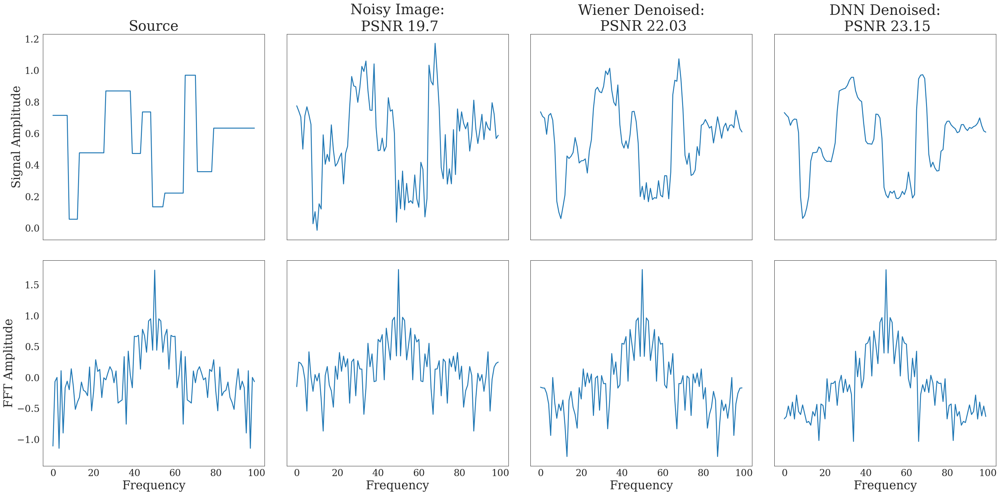

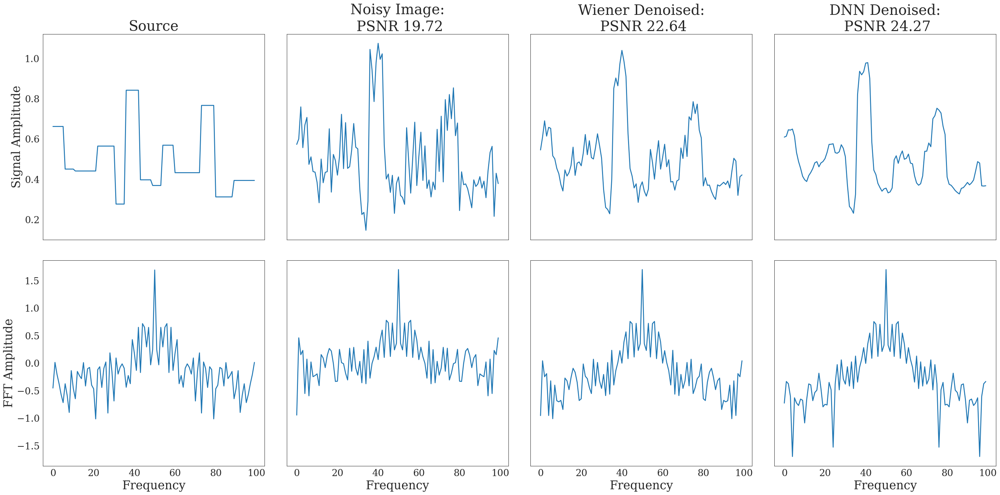

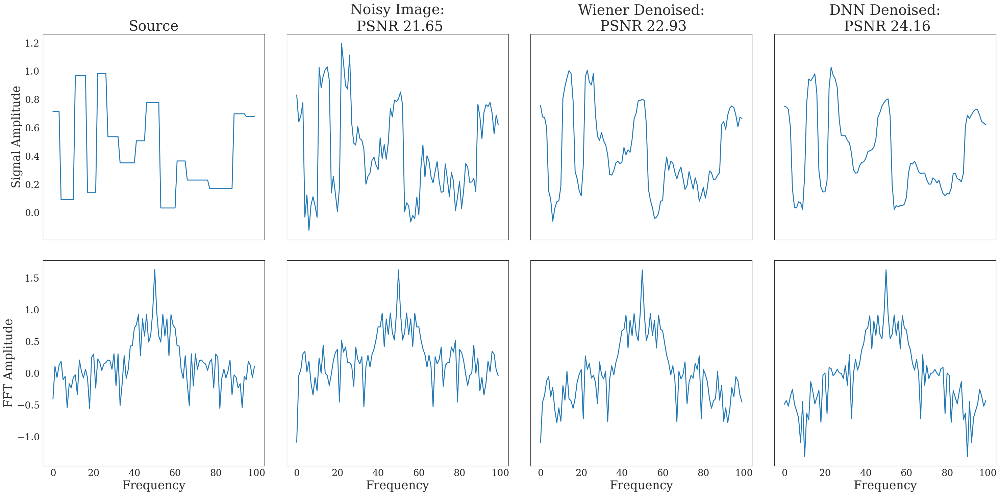

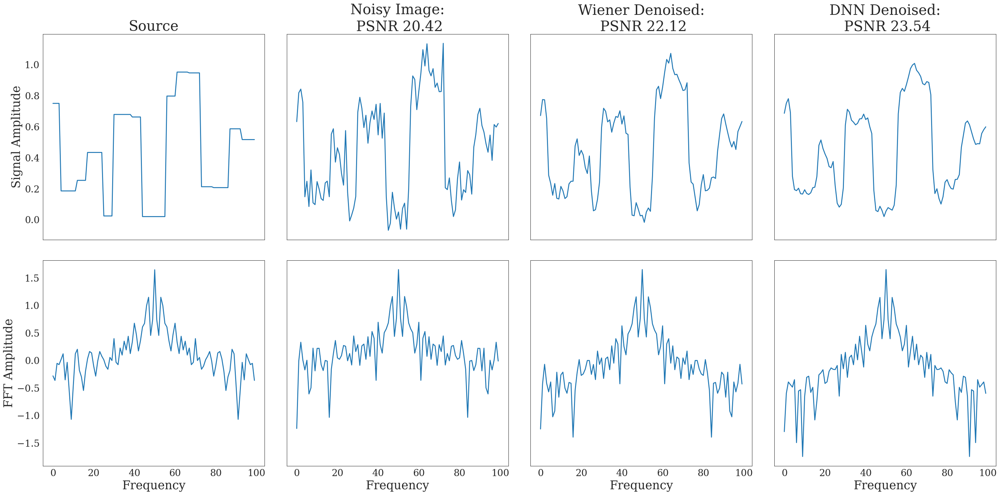

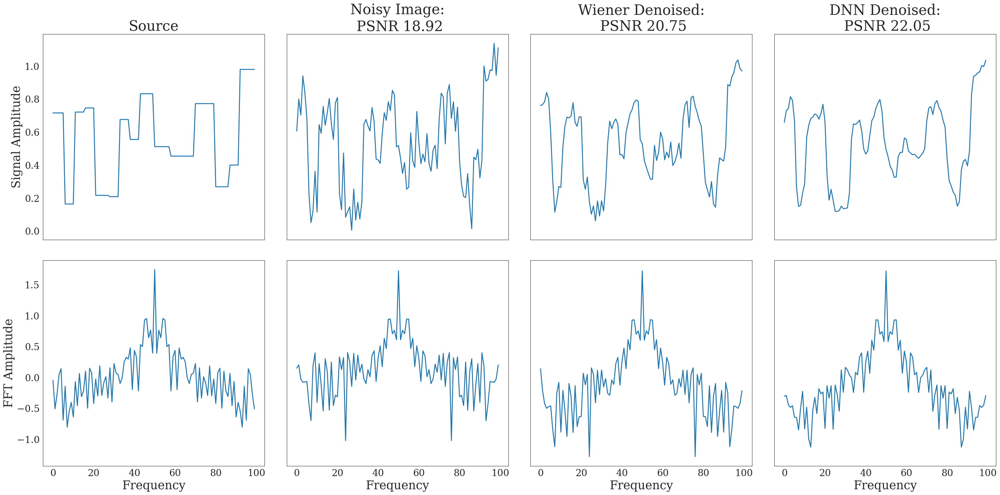

...

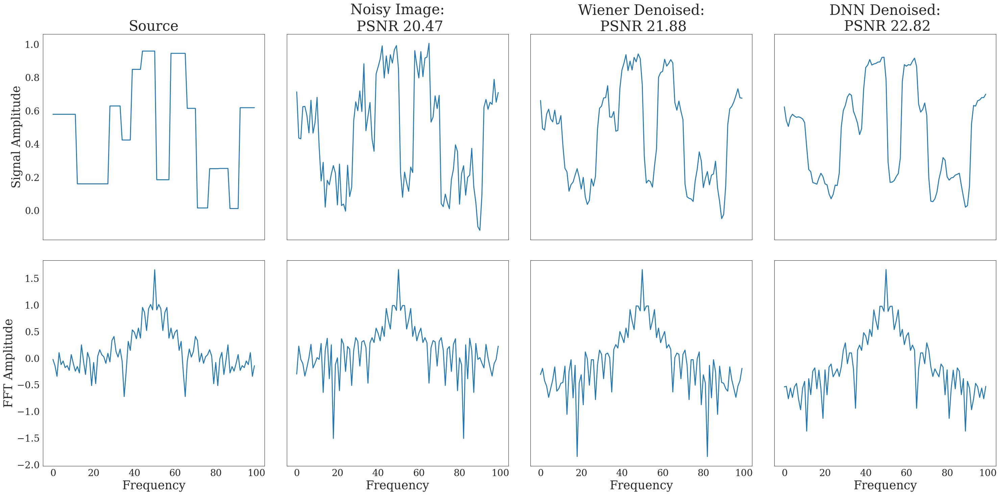

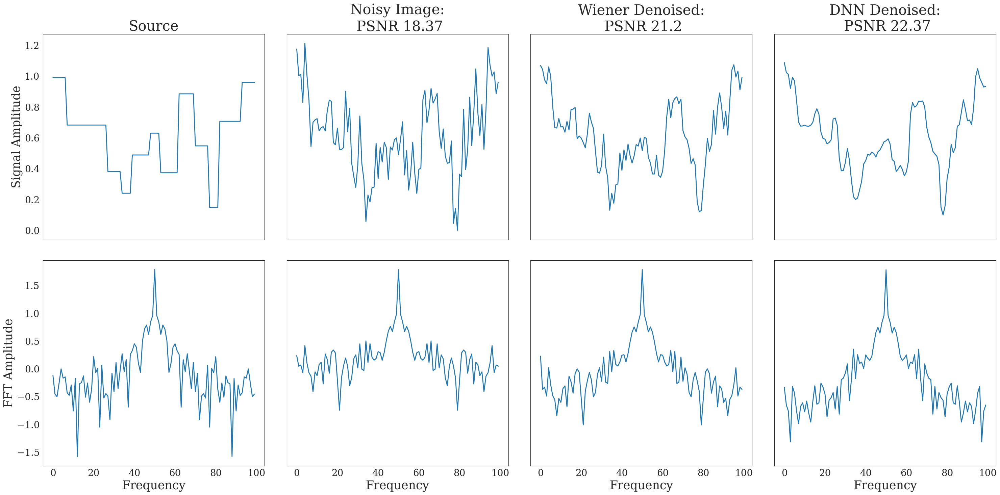

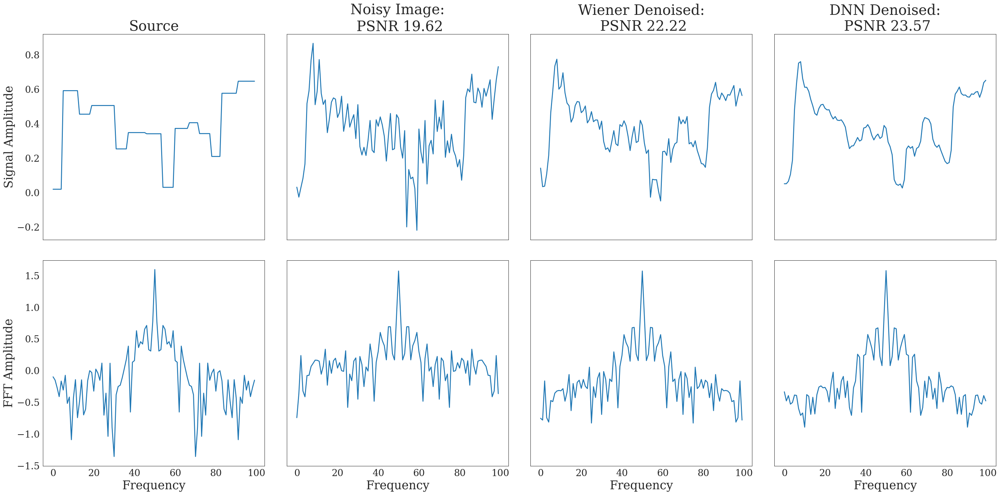

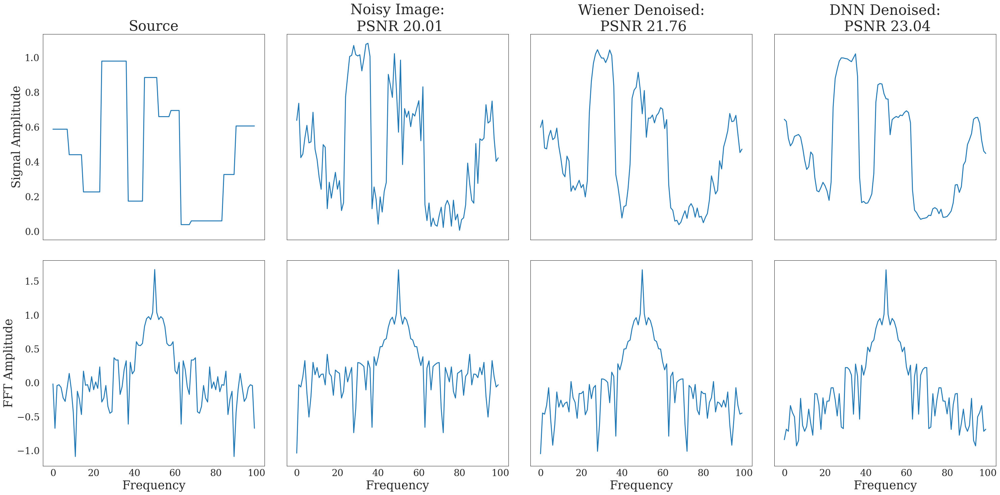

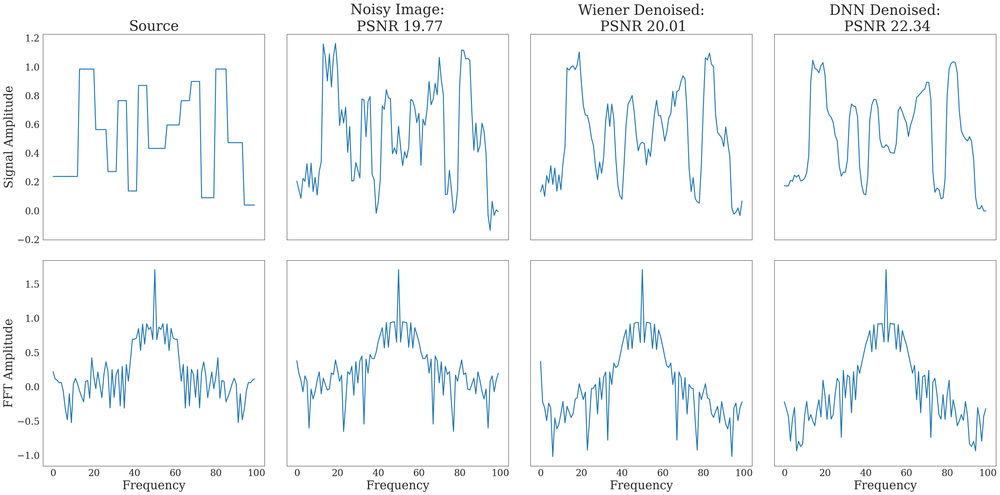

In [ ]:
output_directory_root = 'output_constant_fig1_v2'

count = 0
for data_id, data in enumerate(test_loader):
    for idx in range(1):
        image_tensor = data[idx].unsqueeze(0)
        compare_all(image_tensor,noise_std, wiener_star,
                                   onelayer_net_dict[noise_std][9], net_nn_lr_final, fft_sample = 100,noise_scale=noise_scale, output_directory = os.path.join(output_directory_root, str(data_id)))
        count += 1
    if count > 10:
        break

## Gradient analysis

In [ ]:
def zero_gradients(inputs):
    for inp in inputs:
        if inp.grad is not None:
            inp.grad.data.zero_()


def compute_jacobian_and_bias_1d(inputs, net):

    inputs.requires_grad = True
    assert inputs.requires_grad

    outputs = net(inputs);

    assert(outputs.dim() == 3)
    assert(outputs.shape[0] == 1)
    assert(inputs.shape[1] == 1)

    channels = outputs.shape[1]
    n = inputs.shape[-1];

    total_dim = n*channels;

    jacobian = torch.zeros([total_dim, n]);
    grad_output = torch.zeros(n);

    if inputs.is_cuda:
        grad_output = grad_output.cuda()
        jacobian = jacobian.cuda()

    for j in range(channels):
        for i in range(n):
            zero_gradients(inputs)
            outputs[0, j, i].backward(retain_graph = True)
            jacobian[ j*channels + i, :] = inputs.grad.data.view(-1)


    bias = outputs[0].view(-1) - torch.matmul(jacobian, inputs[0,0])

    return jacobian.cpu().numpy(), bias.data.cpu().numpy()

In [ ]:
import torch

def zero_gradients(inputs):
    for inp in inputs:
        if inp.grad is not None:
            inp.grad.data.zero_()

def compute_jacobian_and_bias_1d(inputs, net):
    inputs.requires_grad = True
    assert inputs.requires_grad

    outputs = net(inputs)

    assert(outputs.dim() == 3)
    assert(outputs.shape[0] == 1)
    assert(inputs.shape[1] == 1)

    channels = outputs.shape[1]
    n = inputs.shape[-1]
    total_dim = n*channels

    jacobian = torch.zeros([total_dim, n])
    grad_output = torch.zeros(n)

    if inputs.is_cuda:
        grad_output = grad_output.cuda()
        jacobian = jacobian.cuda()

    for j in range(channels):
        for i in range(n):
            zero_gradients([inputs])
            outputs[0, j, i].backward(retain_graph=True)
            jacobian[j*channels + i, :] = inputs.grad.data.view(-1)

    bias = outputs[0].view(-1) - torch.matmul(jacobian, inputs[0,0])

    return jacobian.cpu().numpy(), bias.data.cpu().numpy()


In [ ]:
noise_scale

0.1

In [ ]:
net_nn = net_nn_15layer

In [ ]:
sample_idex = 1
source = test_dataset[sample_idex]
noisy = source + get_noise(source, mode='G', noise_std=noise_std, noise_scale=noise_scale)
# noisy = source + get_noise(source, noise_std=noise_std, noise_scale=noise_scale)


In [ ]:
jac, bias = compute_jacobian_and_bias_1d(torch.tensor(noisy.detach().numpy()).unsqueeze(0), net_nn_15layer)

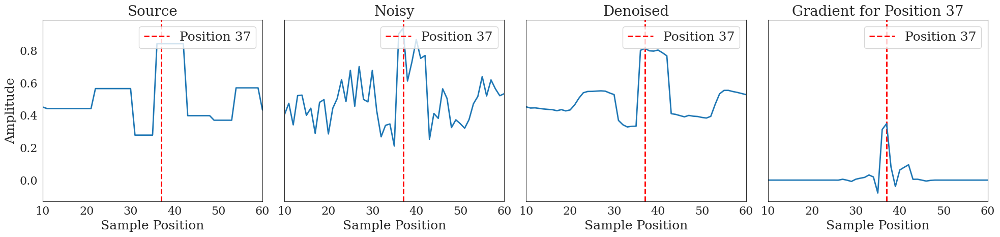

In [ ]:
import matplotlib.pyplot as plt

# Global font settings
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 18  # Adjust based on your needs
plt.rcParams['axes.titlesize'] = 20  # Title font size
plt.rcParams['axes.labelsize'] = 18  # Label font size
plt.rcParams['xtick.labelsize'] = 16  # Tick label font size
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['lines.linewidth'] = 2  # Line width

fig, axes = plt.subplots(nrows=1, ncols=4, sharex=True, sharey=True, figsize=(20, 5))
output_position = 37

# Common settings for all plots
for ax in axes:
    # ax.grid(True, which='both', linestyle='--', linewidth=0.7)  # Adjusted line width
    ax.grid(False)  # Grid turned off
    ax.minorticks_on()
    # ax.grid(which='minor', linestyle=':', linewidth='0.5')
    ax.axvline(x=output_position, color='red', linestyle='--', label=f'Position {output_position}')
    ax.legend(loc='upper right')
    ax.set_xlabel('Sample Position')

axes[0].set_ylabel('Amplitude')  # Only one y-label for shared y-axis

# plot source
axes[0].plot(source[0].cpu().data.numpy())
axes[0].set_title("Source")
axes[0].set_xlim(10,60)

axes[1].plot(noisy[0].cpu().data.numpy())
axes[1].set_title("Noisy")
axes[1].set_xlim(10,60)

# denoise
noisy.requires_grad = True
denoised = net_nn(noisy.unsqueeze(0))

# Plot denoised signal
axes[2].plot(denoised[0,0].cpu().data.numpy())
axes[2].set_title("Denoised")
axes[2].set_xlim(10,60)

# Compute Jacobian for the denoised tensor
jacobian, bias = compute_jacobian_and_bias_1d(torch.tensor(noisy.detach().numpy()).unsqueeze(0), net_nn)

# Choose a specific position in the output to visualize its gradient
gradient = jacobian[output_position, :]
axes[3].plot(gradient)
axes[3].set_title(f"Gradient for Position {output_position}")
axes[3].set_xlim(10,60)

plt.tight_layout()
plt.subplots_adjust(wspace=0.1)
plt.show()
fig.savefig('comparison_plot_piecewise_const_gradient.pdf', bbox_inches='tight', dpi=300)

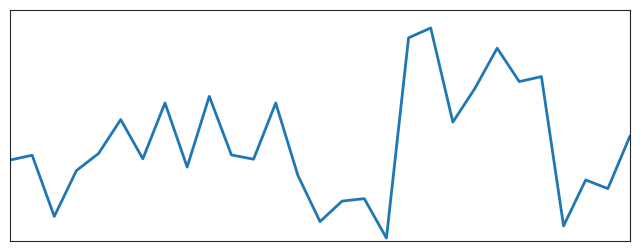

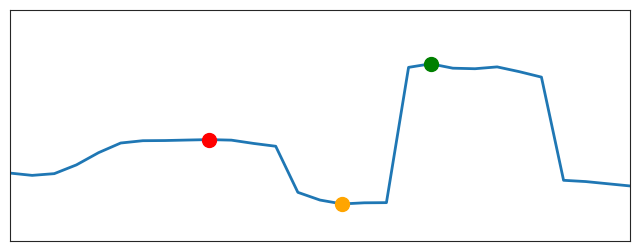

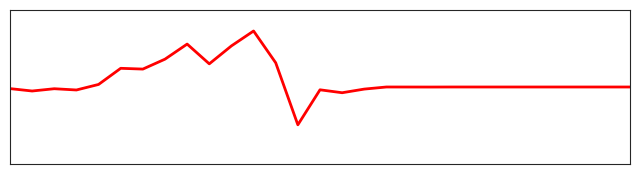

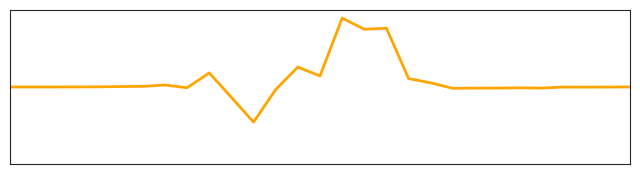

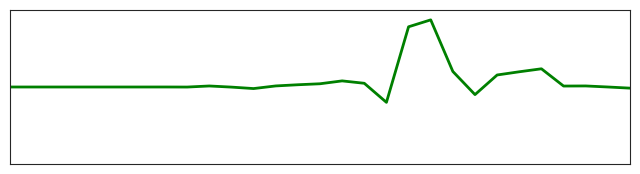

In [ ]:
# Since we are using dummy data for demonstration, we will create dummy jacobian data.
# The following line is just for demonstration and should be replaced with the actual computation of the jacobian.
import matplotlib.pyplot as plt
xlim_min = 18
xlim_max = 46
# Global font settings
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 18  # Adjust based on your needs
plt.rcParams['axes.titlesize'] = 20  # Title font size
plt.rcParams['axes.labelsize'] = 18  # Label font size
plt.rcParams['xtick.labelsize'] = 16  # Tick label font size
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['lines.linewidth'] = 2  # Line width


xlim_min = 18
xlim_max = 46


ylim_min = 0.2
ylim_max = 1
figsize = (8, 3)  # Example size, adjust as needed
output_positions = [27, 33, 37]
colors = ['red', 'orange', 'green']  # Colors for the marker points

# Using the dummy data for demonstration purposes
noisy_data = noisy[0].cpu().data.numpy()
denoised_data = denoised[0,0].cpu().data.numpy()

# Plot and save the noisy and denoised signals with marker points at specified positions
fig, ax = plt.subplots(figsize=figsize)
ax.plot(noisy_data, label='Noisy')
ax.set_xlim(xlim_min, xlim_max)
ax.set_ylim(ylim_min, ylim_max)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')

fig.savefig('noisy_signals_with_markers.pdf', bbox_inches='tight', dpi=300)


fig, ax = plt.subplots(figsize=figsize)
ax.plot(denoised_data, label='Denoised')

# Add marker points to the denoised signal
for pos, color in zip(output_positions, colors):
    ax.plot(pos, denoised_data[pos], 'o', color=color, markersize=10)  # Marker point on denoised signal

ax.set_xlim(xlim_min, xlim_max)
ax.set_ylim(ylim_min, ylim_max)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')

# Re-enable the spines (borders) of the plot
for spine in ax.spines.values():
    spine.set_visible(True)

# Save the noisy and denoised signals plot
fig.savefig('denoised_signals_with_markers.pdf', bbox_inches='tight', dpi=300)
plt.show()
plt.close(fig)

figsize = (8, 2)

ylim_min = -0.4
ylim_max = 0.4
# Now plot and save the gradients with corresponding colors
for i, (pos, color) in enumerate(zip(output_positions, colors)):
    fig, ax = plt.subplots(figsize=figsize)
    gradient = jacobian[pos, :]
    ax.plot(gradient, color=color)
    ax.set_xlim(xlim_min, xlim_max)
    ax.set_ylim(ylim_min, ylim_max)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Re-enable the spines (borders) of the plot
    for spine in ax.spines.values():
        spine.set_visible(True)

    # Save the gradient plot with corresponding color
    fig.savefig(f'gradient_at_position_{pos}_color_{color}.pdf', bbox_inches='tight', dpi=300)
    plt.show()
    plt.close(fig)


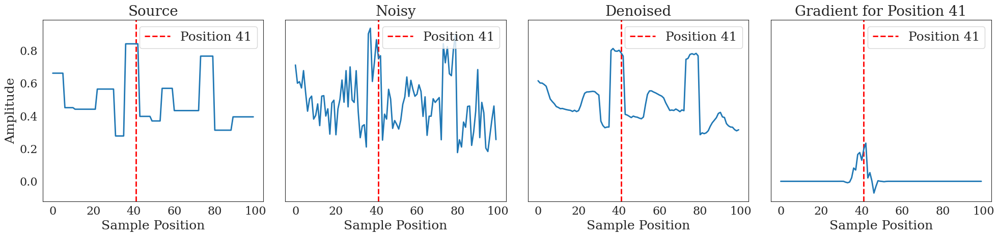

In [ ]:
import matplotlib.pyplot as plt

# Global font settings
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 18  # Adjust based on your needs
plt.rcParams['axes.titlesize'] = 20  # Title font size
plt.rcParams['axes.labelsize'] = 18  # Label font size
plt.rcParams['xtick.labelsize'] = 16  # Tick label font size
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['lines.linewidth'] = 2  # Line width

fig, axes = plt.subplots(nrows=1, ncols=4, sharex=True, sharey=True, figsize=(20, 5))
output_position = 41

# Common settings for all plots
for ax in axes:
    # ax.grid(True, which='both', linestyle='--', linewidth=0.7)  # Adjusted line width
    ax.grid(False)  # Grid turned off
    ax.minorticks_on()
    # ax.grid(which='minor', linestyle=':', linewidth='0.5')
    ax.axvline(x=output_position, color='red', linestyle='--', label=f'Position {output_position}')
    ax.legend(loc='upper right')
    ax.set_xlabel('Sample Position')

axes[0].set_ylabel('Amplitude')  # Only one y-label for shared y-axis

# plot source
axes[0].plot(source[0].cpu().data.numpy())
axes[0].set_title("Source")

axes[1].plot(noisy[0].cpu().data.numpy())
axes[1].set_title("Noisy")

# denoise
noisy.requires_grad = True
denoised = net_nn(noisy.unsqueeze(0))

# Plot denoised signal
axes[2].plot(denoised[0,0].cpu().data.numpy())
axes[2].set_title("Denoised")

# Compute Jacobian for the denoised tensor
jacobian, bias = compute_jacobian_and_bias_1d(torch.tensor(noisy.detach().numpy()).unsqueeze(0), net_nn)

# Choose a specific position in the output to visualize its gradient
gradient = jacobian[output_position, :]
axes[3].plot(gradient)
axes[3].set_title(f"Gradient for Position {output_position}")

plt.tight_layout()
plt.subplots_adjust(wspace=0.1)
plt.show()
fig.savefig('comparison_plot_piecewise_const_gradient_2.pdf', bbox_inches='tight', dpi=300)

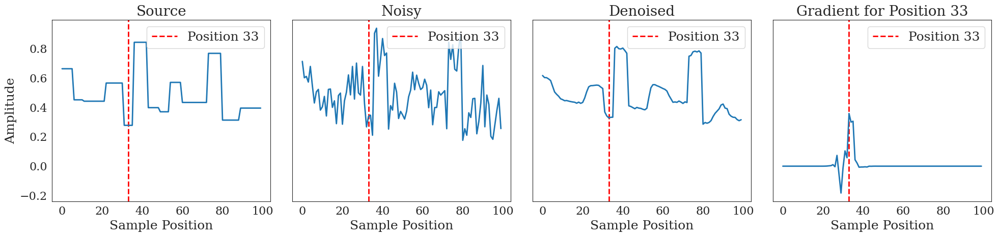

In [ ]:
import matplotlib.pyplot as plt

# Global font settings
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 18  # Adjust based on your needs
plt.rcParams['axes.titlesize'] = 20  # Title font size
plt.rcParams['axes.labelsize'] = 18  # Label font size
plt.rcParams['xtick.labelsize'] = 16  # Tick label font size
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['lines.linewidth'] = 2  # Line width

fig, axes = plt.subplots(nrows=1, ncols=4, sharex=True, sharey=True, figsize=(20, 5))
output_position = 33

# Common settings for all plots
for ax in axes:
    # ax.grid(True, which='both', linestyle='--', linewidth=0.7)  # Adjusted line width
    ax.grid(False)  # Grid turned off
    ax.minorticks_on()
    # ax.grid(which='minor', linestyle=':', linewidth='0.5')
    ax.axvline(x=output_position, color='red', linestyle='--', label=f'Position {output_position}')
    ax.legend(loc='upper right')
    ax.set_xlabel('Sample Position')

axes[0].set_ylabel('Amplitude')  # Only one y-label for shared y-axis

# plot source
axes[0].plot(source[0].cpu().data.numpy())
axes[0].set_title("Source")

axes[1].plot(noisy[0].cpu().data.numpy())
axes[1].set_title("Noisy")

# denoise
noisy.requires_grad = True
denoised = net_nn(noisy.unsqueeze(0))

# Plot denoised signal
axes[2].plot(denoised[0,0].cpu().data.numpy())
axes[2].set_title("Denoised")

# Compute Jacobian for the denoised tensor
jacobian, bias = compute_jacobian_and_bias_1d(torch.tensor(noisy.detach().numpy()).unsqueeze(0), net_nn)

# Choose a specific position in the output to visualize its gradient
gradient = jacobian[output_position, :]
axes[3].plot(gradient)
axes[3].set_title(f"Gradient for Position {output_position}")

plt.tight_layout()
plt.subplots_adjust(wspace=0.1)
plt.show()
fig.savefig('comparison_plot_piecewise_const_gradient_3.pdf', bbox_inches='tight', dpi=300)